# Lib Installation

In [1]:
!pip install  lightning pytorch-lightning torchvision  tqdm python-dotenv PyYAML wilds

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 846.0/846.0 kB 16.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 104.0 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 78.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 32.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 15.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━

# Config

In [2]:
config = {
    "algo": "FOND",
    "dataset": ["PACS", "VLCS", "OfficeHome", "Wilds"],  # Options: VLCS, PACS
    "test_set_id": 0,  # 0, 1, 2, or 3

    # Paths
    "data_dir": {
        "PACS": "/kaggle/input/pacs-dataset/kfold",
        "VLCS": "/kaggle/input/vlcsdataset/",
        "OfficeHome": "/kaggle/input/officehome/OfficeHome/",
        "Wilds": ""
    },
    "log_dir": "./logs",

    # Training settings
    "n_epochs": 5001,
    "checkpoint_freq": 300,
    "holdout_fraction": 0.2,

    # Model checkpointing
    "model_checkpoint": {
        "metric": "val/oacc",
        "maximize": True
    },

    # Seeds
    "overall_seed": 1,
    "trial_id": 0,
    "hparam_id": 0,  # 0=default hparams, 1-4=random variants

    # System
    "num_workers": 4,

    # Dataset config
    "overlap": "high",
    "num_classes": None,
    "num_domain_linked_classes": None,

    # AutoFOND specific
    "auto_augment": True,
    "augment_search_epochs": 5,
    "augment_policy_size": 5,
    "augment_num_policies": 3,

    # MixStyle (feature-level augmentation)
    "mixstyle_p": 0.5,        # probability to apply MixStyle
    "mixstyle_alpha": 0.1,    # beta distribution alpha parameter

    # SWAD
    "use_swad": True,
    "swad_start_epoch": 1,

    # Teacher paths (empty for regular FOND)
    "teacher_paths": {}
}


# Imports

In [3]:
import math
from typing import List, Any, Dict, Optional, Callable, Tuple
import argparse
import logging
import hashlib
import numpy as np
from collections import Counter
import collections
import time
from datetime import datetime
import lightning as L
from tqdm import tqdm
import csv
import json
from pathlib import Path
import os
import torch
import torchmetrics
import torchvision.datasets.folder
from PIL import Image, ImageFile
from torch.utils.data import ConcatDataset, Dataset, Subset, TensorDataset
from torchvision import transforms
from torchvision.datasets import MNIST, ImageFolder
from torchvision.transforms.functional import rotate
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models
from wilds.datasets.camelyon17_dataset import Camelyon17Dataset





# SRC

## Domain Creation

In [4]:



def create_domains(
    num_classes: int, num_linked: int, num_train_domains: int
) -> List[List[int]]:
    """
    Determine and distribute domain-linked and domain-shared classes.
    Domain-linked classes will come from the same domain, i.e., idx=0.
    Domain-shared classes will exist in each of the remaining domains

    Args:
        num_classes: number of overall classes within all the domains
        num_linked: number of classes that are linked to an individual domain
        num_train_domains: number of different training domains
    """
    assert num_linked <= num_classes
    domain_shared = [i for i in range(num_linked, num_classes)]
    domain_linked = [i for i in range(num_linked)]
    logging.info(f"Domain-shared classes: {domain_shared}")
    logging.info(f"Domain-linked classes: {domain_linked}")
    # domains = [domain_shared.copy() for i in range(num_train_domains)]
    domains = [[] for i in range(num_train_domains)]

    # first domain is domain-linked only
    domains[0] = domain_linked
    # other domains contain domain-shared only
    domains[1:] = [domain_shared.copy() for i in range(1, num_train_domains)]

    logging.info(f"domains[0]: {domains[0]}")
    logging.info(f"domains[1:]: {domains[1:]}")

    return domains


def create_domains_1(
    num_classes: int, num_linked: int, num_domains: int
) -> List[List[int]]:
    """
    Args:
        num_classes: number of overall classes within all the domains
        num_linked: number of classes that are linked to an individual domain
        num_domains: number of different domains, including test domain
    """
    assert num_linked < num_classes
    domain_shared = [i for i in range(num_linked, num_classes)]
    print(f"Shared classes: {domain_shared}")
    num_train_domains = num_domains - 1
    domains = [domain_shared.copy() for i in range(num_train_domains)]

    for class_idx in range(num_linked):
        domain_idx = class_idx % num_train_domains
        domains[domain_idx].append(class_idx)
    return domains


def create_domains_2(
    num_classes: int, num_linked_ratio: float, num_domains: int
) -> List[List[int]]:
    """
    Args:
        num_classes: number of overall classes within all the domains
        num_linked_ratio: ratio of linked classes to the total number of classes
        num_domains: number of different domains, including test domain
    """
    num_linked = math.floor(num_linked_ratio * num_classes)
    return create_domains_1(num_classes, num_linked, num_domains)



# Testing
create_domains(num_classes=10, num_linked=5, num_train_domains=3)
# Testing domain linked only
create_domains(num_classes=10, num_linked=10, num_train_domains=3)

# Testing same classes with different overlap
domains = create_domains_1(num_classes=10, num_linked=3, num_domains=4)
print(domains)
domains = create_domains_1(num_classes=10, num_linked=5, num_domains=4)
print(domains)

# Testing different classes with same overlap percentage
domains = create_domains_2(num_classes=10, num_linked_ratio=0.2, num_domains=4)
print(domains)
domains = create_domains_2(num_classes=5, num_linked_ratio=0.2, num_domains=4)
print(domains)


Shared classes: [3, 4, 5, 6, 7, 8, 9]
[[3, 4, 5, 6, 7, 8, 9, 0], [3, 4, 5, 6, 7, 8, 9, 1], [3, 4, 5, 6, 7, 8, 9, 2]]
Shared classes: [5, 6, 7, 8, 9]
[[5, 6, 7, 8, 9, 0, 3], [5, 6, 7, 8, 9, 1, 4], [5, 6, 7, 8, 9, 2]]
Shared classes: [2, 3, 4, 5, 6, 7, 8, 9]
[[2, 3, 4, 5, 6, 7, 8, 9, 0], [2, 3, 4, 5, 6, 7, 8, 9, 1], [2, 3, 4, 5, 6, 7, 8, 9]]
Shared classes: [1, 2, 3, 4]
[[1, 2, 3, 4, 0], [1, 2, 3, 4], [1, 2, 3, 4]]


## Hparams

In [6]:
"""
Hyper-parameter registry (UPDATED WITH MIXSTYLE)
"""

def seed_hash(*args):
    args_str = str(args)
    return int(hashlib.md5(args_str.encode("utf-8")).hexdigest(), 16) % (2**31)

def _define_hparam(hparams, hparam_name, default_val, random_val_fn):
    hparams[hparam_name] = (hparams, hparam_name, default_val, random_val_fn)

def _hparams(algorithm, dataset, random_seed):
    SMALL_IMAGES = ["Debug28", "RotatedMNIST", "ColoredMNIST"]

    hparams = {}

    def _hparam(name, default_val, random_val_fn):
        assert name not in hparams
        random_state = np.random.RandomState(seed_hash(random_seed, name))
        hparams[name] = (default_val, random_val_fn(random_state))

    # -----------------------------
    # GENERAL HPARAMS
    # -----------------------------
    _hparam("data_augmentation", True, lambda r: True)
    _hparam("resnet18", True, lambda r: True)
    _hparam("resnet_dropout", 0.0, lambda r: r.choice([0.0, 0.1, 0.5]))
    _hparam("class_balanced", False, lambda r: False)
    _hparam("nonlinear_classifier", False, lambda r: False)

    # -----------------------------
    # 🔥 MIXSTYLE HPARAMS (added)
    # -----------------------------
    _hparam("mixstyle_p", 0.5, lambda r: 0.5)
    _hparam("mixstyle_alpha", 0.1, lambda r: 0.1)

    # -----------------------------
    # ALGORITHM-SPECIFIC
    # -----------------------------
    if algorithm in ["FOND", "FOND_NC", "FOND_N", "NOC"]:
        _hparam("temperature", 0.07, lambda r: 0.07 * r.uniform(0.75, 1.25))
        _hparam("base_temperature", 0.07, lambda r: 0.07)
        _hparam("xdom_lmbd", 1, lambda r: 10 ** r.uniform(-1, 3))
        _hparam("error_lmbd", 1, lambda r: 10 ** r.uniform(-1, 3))
        _hparam("xda_alpha", 1, lambda r: 10 ** r.uniform(0, 1))
        _hparam("xda_beta", 1, lambda r: 10 ** r.uniform(0, 1))

    # -----------------------------
    # DATASET & ALGO SPECIFIC
    # -----------------------------
    if dataset in SMALL_IMAGES:
        _hparam("lr", 1e-3, lambda r: 10 ** r.uniform(-4.5, -2.5))
    else:
        _hparam("lr", 5e-5, lambda r: 10 ** r.uniform(-5, -3.5))

    if dataset in SMALL_IMAGES:
        _hparam("weight_decay", 0.0, lambda r: 0.0)
    else:
        _hparam("weight_decay", 0.0, lambda r: 10 ** r.uniform(-6, -2))

    if dataset in SMALL_IMAGES:
        _hparam("batch_size", 64, lambda r: int(2 ** r.uniform(3, 9)))
    elif algorithm == "ARM":
        _hparam("batch_size", 8, lambda r: 8)
    elif dataset == "DomainNet":
        _hparam("batch_size", 32, lambda r: int(2 ** r.uniform(3, 5)))
    else:
        _hparam("batch_size", 32, lambda r: int(2 ** r.uniform(3, 5.5)))

    return hparams

def default_hparams(algorithm, dataset):
    return {a: b for a, (b, c) in _hparams(algorithm, dataset, 0).items()}

def random_hparams(algorithm, dataset, seed):
    return {a: c for a, (b, c) in _hparams(algorithm, dataset, seed).items()}


## Misc

In [7]:

class _SplitDataset(torch.utils.data.Dataset):
    """Used by split_dataset"""

    def __init__(self, underlying_dataset, keys):
        super(_SplitDataset, self).__init__()
        self.underlying_dataset = underlying_dataset
        self.keys = keys

    def __getitem__(self, key):
        return self.underlying_dataset[self.keys[key]]

    def __len__(self):
        return len(self.keys)


def split_dataset(dataset, n, seed=0):
    """
    Return a pair of datasets corresponding to a random split of the given
    dataset, with n datapoints in the first dataset and the rest in the last,
    using the given random seed
    """
    assert n <= len(dataset)
    keys = list(range(len(dataset)))
    np.random.RandomState(seed).shuffle(keys)
    keys_1 = keys[:n]
    keys_2 = keys[n:]
    return _SplitDataset(dataset, keys_1), _SplitDataset(dataset, keys_2)


def seed_hash(*args):
    """
    Derive an integer hash from all args, for use as a random seed.
    """
    args_str = str(args)
    return int(hashlib.md5(args_str.encode("utf-8")).hexdigest(), 16) % (2**31)


def make_weights_for_balanced_classes(dataset):
    counts = Counter()
    classes = []
    for _, y in dataset:
        y = int(y)
        counts[y] += 1
        classes.append(y)

    n_classes = len(counts)

    weight_per_class = {}
    for y in counts:
        weight_per_class[y] = 1 / (counts[y] * n_classes)

    weights = torch.zeros(len(dataset))
    for i, y in enumerate(classes):
        weights[i] = weight_per_class[int(y)]

    return weights
def compute_loss(network, loader, device):
    """
    Compute average loss for a given loader.
    Returns: average loss value
    """
    total_loss = 0.0
    num_batches = 0
    
    network.eval()
    with torch.no_grad():
        for x, y in loader:
            x = x.to(device)
            y = y.to(device)
            p = network.predict(x)
            
            # Compute loss
            loss = torch.nn.functional.cross_entropy(p, y, reduction='mean')
            total_loss += loss.item()
            num_batches += 1
    
    network.train()
    
    avg_loss = total_loss / num_batches if num_batches > 0 else 0.0
    return avg_loss

def accuracy(network, loader, weights, device, dataset):
    correct = 0
    total = 0
    weights_offset = 0
    overlapping_classes = dataset.overlapping_classes
    num_classes = dataset.num_classes
    
    f1_score = torchmetrics.F1Score(
        task="multiclass", num_classes=num_classes, average="macro"
    ).to(device)
    per_class_accuracy = torchmetrics.Accuracy(
        task="multiclass",
        num_classes=num_classes,
        average=None,
    ).to(device)
    accuracy = torchmetrics.Accuracy(
        task="multiclass",
        num_classes=num_classes,
        average="macro",
    ).to(device)
    recall = torchmetrics.Recall(
        task="multiclass",
        num_classes=num_classes,
        average="macro",
    ).to(device)
    precision = torchmetrics.Precision(
        task='multiclass',  # ✅ Fixed typo
        num_classes=num_classes,
        average='macro'
    ).to(device)
    conf_mat = torchmetrics.ConfusionMatrix(
        task="multiclass",
        num_classes=num_classes
    ).to(device)  # ✅ Added .to(device)
    
    network.eval()
    with torch.no_grad():
        for x, y in loader:
            x = x.to(device)
            y = y.to(device)
            p = network.predict(x)
            
            if weights is None:
                batch_weights = torch.ones(len(x))
            else:
                batch_weights = weights[weights_offset : weights_offset + len(x)]
                weights_offset += len(x)
            batch_weights = batch_weights.to(device)
            
            if p.size(1) == 1:
                correct += (
                    (p.gt(0).eq(y).float() * batch_weights.view(-1, 1)).sum().item()
                )
            else:
                correct += (p.argmax(1).eq(y).float() * batch_weights).sum().item()
            total += batch_weights.sum().item()
            
            # update metrics
            accuracy.update(p, y)
            recall.update(p, y)
            precision.update(p, y)
            f1_score.update(p, y)
            per_class_accuracy.update(p, y)
            conf_mat.update(p, y)
    
    network.train()
    compute_acc = accuracy.compute().item()
    compute_recall = recall.compute().item()
    compute_precision = precision.compute().item()  # ✅ Fixed typo
    compute_f1 = f1_score.compute().item()
    compute_per_class_acc = per_class_accuracy.compute().cpu().numpy()
    cm_compute = conf_mat.compute().cpu().numpy()  # ✅ Convert to numpy
    
    overlap_class_acc = []
    non_overlap_class_acc = []
    per_class_acc_dict = {}
    for i in range(num_classes):
        per_class_acc_dict[i] = float(compute_per_class_acc[i])
        if i in overlapping_classes:
            overlap_class_acc.append(compute_per_class_acc[i])
        else:
            non_overlap_class_acc.append(compute_per_class_acc[i])
    
    if len(non_overlap_class_acc) == 0:
        non_overlap_class_acc = -1
    else:
        non_overlap_class_acc = np.mean(non_overlap_class_acc)
    if len(overlap_class_acc) == 0:
        overlap_class_acc = -1
    else:
        overlap_class_acc = np.mean(overlap_class_acc)
    
    other_acc = correct / total
    
    return (
        float(compute_acc),
        float(compute_recall),
        float(compute_f1),
        float(compute_precision),      # ✅ Moved before oacc/nacc
        float(overlap_class_acc),
        float(non_overlap_class_acc),
        per_class_acc_dict,
        cm_compute
    )
class _InfiniteSampler(torch.utils.data.Sampler):
    """Wraps another Sampler to yield an infinite stream."""

    def __init__(self, sampler):
        self.sampler = sampler

    def __iter__(self):
        while True:
            for batch in self.sampler:
                yield batch


class InfiniteDataLoader:
    def __init__(self, dataset, weights, batch_size, num_workers):
        super().__init__()

        if weights is not None:
            sampler = torch.utils.data.WeightedRandomSampler(
                weights, replacement=True, num_samples=batch_size
            )
        else:
            sampler = torch.utils.data.RandomSampler(dataset, replacement=True)

        if weights == None:
            weights = torch.ones(len(dataset))

        batch_sampler = torch.utils.data.BatchSampler(
            sampler, batch_size=batch_size, drop_last=True
        )

        self._infinite_iterator = iter(
            torch.utils.data.DataLoader(
                dataset,
                num_workers=num_workers,
                batch_sampler=_InfiniteSampler(batch_sampler),
            )
        )

    def __iter__(self):
        while True:
            yield next(self._infinite_iterator)

    def __len__(self):
        raise ValueError


class FastDataLoader:
    """DataLoader wrapper with slightly improved speed by not respawning worker
    processes at every epoch."""

    def __init__(self, dataset, batch_size, num_workers):
        super().__init__()

        batch_sampler = torch.utils.data.BatchSampler(
            torch.utils.data.RandomSampler(dataset, replacement=False),
            batch_size=batch_size,
            drop_last=False,
        )

        self._infinite_iterator = iter(
            torch.utils.data.DataLoader(
                dataset,
                num_workers=num_workers,
                batch_sampler=_InfiniteSampler(batch_sampler),
            )
        )

        self._length = len(batch_sampler)

    def __iter__(self):
        for _ in range(len(self)):
            yield next(self._infinite_iterator)

    def __len__(self):
        return self._length


def config_logging():
    """
    Reusable code for formatting the logger
    """
    logging.basicConfig(
        format="%(asctime)s,%(msecs)03d %(levelname)-8s [%(filename)s:%(funcName)s:%(lineno)d] %(message)s",
        datefmt="%Y-%m-%d:%H:%M:%S",
        level=logging.INFO,
    )


## Simple Logger

In [9]:
"""
Simple CSV logger to replace W&B during development
Keeps the same interface for easy swap later
"""
class CSVLogger:
    """Lightweight logger that writes metrics to CSV"""
    
    def __init__(self, csv_path: str, root_dir:str=None):
        self.csv_path = Path(csv_path)
        self.csv_path.parent.mkdir(parents=True, exist_ok=True)
        self.fieldnames = None
        self.file = None
        self.writer = None
        self._init_csv()
        self.root = root_dir if root_dir is not None else csv_path.parent
    def _init_csv(self):
        """Initialize CSV file with headers"""
        self.file = open(self.csv_path, 'w', newline='')
        self.writer = None  # Will be created on first log
    def return_root(self):
        return self.root
    def log(self, metrics: Dict[str, Any], step: Optional[int] = None):
        """
        Log metrics to CSV
        
        Args:
            metrics: Dictionary of metric_name -> value
            step: Training step (optional, will be added if provided)
        """
        if step is not None:
            metrics = {"step": step, **metrics}
            
        # Flatten nested dictionaries (e.g., {"train/acc": 0.9})
        flat_metrics = {}
        for key, value in metrics.items():
            if isinstance(value, dict):
                for subkey, subvalue in value.items():
                    flat_metrics[f"{key}/{subkey}"] = subvalue
            else:
                flat_metrics[key] = value
        
        # Initialize writer with fieldnames on first call
        if self.writer is None:
            self.fieldnames = list(flat_metrics.keys())
            self.writer = csv.DictWriter(self.file, fieldnames=self.fieldnames)
            self.writer.writeheader()
            
        # Add new fields if they appear
        new_fields = set(flat_metrics.keys()) - set(self.fieldnames)
        if new_fields:
            self.fieldnames.extend(sorted(new_fields))
            # Rewrite file with new headers
            self.file.close()
            self._rewrite_with_new_fields(flat_metrics)
            return
            
        self.writer.writerow(flat_metrics)
        self.file.flush()  # Ensure immediate write
        
    def _rewrite_with_new_fields(self, new_row: Dict[str, Any]):
        """Rewrite CSV when new fields are discovered"""
        # Read existing rows
        with open(self.csv_path, 'r') as f:
            reader = csv.DictReader(f)
            existing_rows = list(reader)
        
        # Rewrite with updated fieldnames
        self.file = open(self.csv_path, 'w', newline='')
        self.writer = csv.DictWriter(self.file, fieldnames=self.fieldnames)
        self.writer.writeheader()
        for row in existing_rows:
            self.writer.writerow(row)
        self.writer.writerow(new_row)
        self.file.flush()
        
    def save_config(self, config: Dict[str, Any], path: Optional[str] = None):
        """Save experiment config as JSON"""
        if path is None:
            path = self.csv_path.parent / "config.json"
        with open(path, 'w') as f:
            json.dump(config, f, indent=2)
            
    def close(self):
        """Close CSV file"""
        if self.file:
            self.file.close()
            
    def __enter__(self):
        return self
        
    def __exit__(self, exc_type, exc_val, exc_tb):
        self.close()


class PrintLogger:
    """Even simpler logger that just prints to console"""
    
    def log(self, metrics: Dict[str, Any], step: Optional[int] = None):
        step_str = f"[Step {step}] " if step is not None else ""
        metric_str = ", ".join(f"{k}={v:.4f}" if isinstance(v, float) else f"{k}={v}" 
                               for k, v in metrics.items())
        print(f"{step_str}{metric_str}")
        
    def save_config(self, config: Dict[str, Any], path: Optional[str] = None):
        print(f"Config: {json.dumps(config, indent=2)}")
        
    def close(self):
        pass


# Dataset

## Base

In [10]:
ImageFile.LOAD_TRUNCATED_IMAGES = True

DATASETS2 = [
    # Debug
    "Debug28",
    "Debug224",
    # Small images
    "ColoredMNIST",
    "RotatedMNIST",
    # Big images
    "VLCS",
    "PACS",
    "OfficeHome",
    "TerraIncognita",
    "DomainNet",
    "SVIRO",
    # WILDS datasets
    "WILDSCamelyon",
    "WILDSFMoW",
    # Spawrious datasets
    "SpawriousO2O_easy",
    "SpawriousO2O_medium",
    "SpawriousO2O_hard",
    "SpawriousM2M_easy",
    "SpawriousM2M_medium",
    "SpawriousM2M_hard",
]

# OVERLAP_TYPES = ["none", "low", "mid", "high", "full", "0", "33", "66", "100"]
SPECIAL_OVERLAP_TYPES = ["0", "low", "high", "low_linked_only", "high_linked_only"]
OVERLAP_TYPES = ["0", "low", "high", "low_linked_only", "high_linked_only"]


def get_domain_classes(N_c, N_oc, repeat, N_s, seed):
    N_noc = N_c - N_oc
    Q = []
    C = list(range(N_c))

    random_state = np.random.RandomState(seed)

    # choose non overlapping classes
    C_noc = list(random_state.choice(C, replace=False, size=N_noc))
    C_oc = [x for x in C if x not in C_noc]

    # add to queue
    Q.extend(C_noc + list(np.repeat(C_oc, repeat)))

    # Round-robing distribution of classes
    domain_classes = [Q[i::N_s] for i in range(N_s)]

    # assert overlapping classes
    overlap = np.zeros(N_c)
    for cls_list in domain_classes:
        np.add.at(overlap, cls_list, 1)

    assert C_oc == list(np.where(overlap > 1)[0])

    # output
    print("C_noc", C_noc)
    print("C_oc", C_oc)
    print("Q", Q)
    print("domain_classes", domain_classes)

    return domain_classes


class DomainBedImageFolder(ImageFolder):
    """
    Custom class to allow class filtering
    """

    def __init__(
        self,
        root: str,
        transform: Optional[Callable] = None,
        target_transform: Optional[Callable] = None,
        remove_classes: List[int] = [],
        allowed_classes: List[int] = [],
        is_test_env: Optional[bool] = None,
        env_name: Optional[str] = None,
    ):
        super().__init__(root, transform, target_transform)

        # Remove specified classes
        old_samples = self.samples
        self.samples = []
        self.targets = []
        self.is_test_env = is_test_env
        self.allowed_classes = allowed_classes
        self.remove_classes = remove_classes
        self.env_name = env_name
        for sample in old_samples:
            _, target = sample

            if target not in remove_classes:
                self.samples.append(sample)
                self.targets.append(target)

        self.imgs = self.samples
        self.classes = list(set(self.targets))

    def __len__(self) -> int:
        return len(self.samples)

    def __str__(self):
        return (
            f"{self.env_name}: is_test_env={self.is_test_env}, allowed_classes={self.allowed_classes},"
            f" list(set(self.targets))={self.classes}, num_samples={len(self)}"
        )


def get_overlapping_classes(
    class_split: List[List[int]], num_classes: int
) -> List[int]:
    """
    Return the classes in multiple domains.
    """
    overlap = np.zeros(num_classes)
    for data in class_split:
        np.add.at(overlap, data, 1)

    overlapping_classes = list(np.where(overlap > 1)[0])

    return overlapping_classes


def get_dataset_class(dataset_name):
    """Return the dataset class with the given name."""
    if dataset_name not in globals():
        raise NotImplementedError("Dataset not found: {}".format(dataset_name))
    return globals()[dataset_name]


def num_environments(dataset_name):
    return len(get_dataset_class(dataset_name).ENVIRONMENTS)


class MultipleDomainDataset:
    N_STEPS = 5001  # Default, subclasses may override
    CHECKPOINT_FREQ = 100  # Default, subclasses may override
    N_WORKERS = 8  # Default, subclasses may override
    ENVIRONMENTS = None  # Subclasses should override
    INPUT_SHAPE = None  # Subclasses should override

    def __getitem__(self, index):
        return self.datasets[index]

    def __len__(self):
        return len(self.datasets)


class Debug(MultipleDomainDataset):
    def __init__(self, root, test_envs, hparams):
        super().__init__()
        self.input_shape = self.INPUT_SHAPE
        self.num_classes = 2
        self.datasets = []
        for _ in [0, 1, 2]:
            self.datasets.append(
                TensorDataset(
                    torch.randn(16, *self.INPUT_SHAPE),
                    torch.randint(0, self.num_classes, (16,)),
                )
            )


class Debug28(Debug):
    INPUT_SHAPE = (3, 28, 28)
    ENVIRONMENTS = ["0", "1", "2"]


class Debug224(Debug):
    INPUT_SHAPE = (3, 224, 224)
    ENVIRONMENTS = ["0", "1", "2"]


class MultipleEnvironmentMNIST(MultipleDomainDataset):
    def __init__(
        self,
        root,
        environments,
        dataset_transform,
        input_shape,
        num_classes,
        test_envs: List[int],
        domain_class_filter: List[List[int]],
    ):
        super().__init__()
        if root is None:
            raise ValueError("Data directory not specified!")

        original_dataset_tr = MNIST(root, train=True, download=True)
        original_dataset_te = MNIST(root, train=False, download=True)

        original_images = torch.cat(
            (original_dataset_tr.data, original_dataset_te.data)
        )

        original_labels = torch.cat(
            (original_dataset_tr.targets, original_dataset_te.targets)
        )

        shuffle = torch.randperm(len(original_images))

        original_images = original_images[shuffle]
        original_labels = original_labels[shuffle]

        assert len(test_envs) == 1, "Not performing leave-one-domain-out validation"
        num_envs = len(environments)

        self.num_classes = num_classes
        self.overlapping_classes = get_overlapping_classes(
            domain_class_filter, self.num_classes
        )

        # Dynamically associate a filter with a domain except for test_envs[0]
        num_filters = len(domain_class_filter)
        assert num_envs - 1 == num_filters  # b/c exempt first test env
        shift_filter = list(range(num_filters)) + list(range(num_filters))
        shift_filter = shift_filter[test_envs[0] : test_envs[0] + num_filters]

        self.datasets = []

        for i in range(len(environments)):
            images = original_images[i :: len(environments)]
            labels = original_labels[i :: len(environments)]
            self.datasets.append(dataset_transform(images, labels, environments[i]))

        self.input_shape = input_shape


class MultipleEnvironmentImageFolder(MultipleDomainDataset):
    def __init__(
        self,
        root,
        test_envs,
        augment,
        hparams,
        domain_class_filter: List[List[int]],
        num_classes=None,
    ):
        super().__init__()
        environments = [f.name for f in os.scandir(root) if f.is_dir()]
        environments = sorted(environments)
        num_envs = len(environments)

        assert len(test_envs) == 1, "Not performing leave-one-domain-out validation"

        self.idx_to_class = self.get_idx_to_class(
            os.path.join(root, environments[test_envs[0]])
        )
        self.num_classes = (
            len(self.idx_to_class) if num_classes is None else num_classes
        )

        self.overlapping_classes = get_overlapping_classes(
            domain_class_filter, self.num_classes
        )
        logging.info(f"Overlapping classes: {self.overlapping_classes}")

        # Dynamically associate a filter with a domain except for test_envs[0]
        num_filters = len(domain_class_filter)
        print(f"num_envs={num_envs}, num_filters={num_filters}, domain_class_filter={domain_class_filter}")
        assert num_envs - 1 == num_filters  # b/c exempt first test env
        shift_filter = list(range(num_filters)) + list(range(num_filters))
        shift_filter = shift_filter[test_envs[0] : test_envs[0] + num_filters]

        transform = transforms.Compose(
            [
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )

        augment_transform = transforms.Compose(
            [
                # transforms.Resize((224,224)),
                transforms.RandomResizedCrop(224, scale=(0.7, 1.0)),
                transforms.RandomHorizontalFlip(),
                transforms.ColorJitter(0.3, 0.3, 0.3, 0.3),
                transforms.RandomGrayscale(),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )

        self.datasets = []
        for i, environment in enumerate(environments):
            path = os.path.join(root, environment)

            # setup augmentation
            if augment and (i not in test_envs):
                env_transform = augment_transform
            else:
                env_transform = transform

            # setup class filtering
            all_classes = set(list(self.idx_to_class.keys()))
            if i not in test_envs:
                filter = domain_class_filter[shift_filter.pop()]
                if filter == []:
                    continue
                remove_classes = list(all_classes - set(filter))

                env_dataset = DomainBedImageFolder(
                    path,
                    transform=env_transform,
                    remove_classes=remove_classes,
                    is_test_env=False,
                    allowed_classes=filter,
                    env_name=environment,
                )
            else:
                remove_classes = list(range(self.num_classes, len(all_classes)))
                env_dataset = DomainBedImageFolder(
                    path,
                    transform=env_transform,
                    remove_classes=remove_classes,
                    is_test_env=True,
                    allowed_classes=list(range(self.num_classes)),
                    env_name=environment,
                )
                assert self.num_classes == len(env_dataset.classes)

            # print(f"\n[info] environment: {env_dataset.env_name}, classes: {env_dataset.allowed_classes}, is_test: {env_dataset.is_test_env}")
            logging.info(f"Created domain -> {env_dataset}")
            self.datasets.append(env_dataset)

        self.input_shape = (
            3,
            224,
            224,
        )

    def get_overlapping_classes(
        self, class_split: List[List[int]], num_classes: int
    ) -> List[int]:
        """
        Return the classes in multiple domains.
        """
        overlap = np.zeros(num_classes)
        for data in class_split:
            np.add.at(overlap, data, 1)

        overlapping_classes = list(np.where(overlap > 1)[0])

        return overlapping_classes

    def get_idx_to_class(self, data_dir: str) -> Dict[int, str]:
        dataset = ImageFolder(data_dir)
        idx_to_class = {}
        for key, value in dataset.class_to_idx.items():
            idx_to_class.update({value: key})

        assert len(dataset.class_to_idx) == len(
            idx_to_class
        ), "Class and labels are not one-to-one"

        return idx_to_class

## PACS

In [11]:


class PACS(MultipleEnvironmentImageFolder):
    CHECKPOINT_FREQ = 300
    ENVIRONMENTS = sorted(["A", "C", "P", "S"])
    NUM_CLASSES = 7
    OVERLAP_CONFIG = {
        "0": [[0, 1], [2, 3], [4, 5, 6]],
        "low": [[0, 1, 2], [2, 3, 4], [4, 5, 6]],
        "high": [[0, 1, 2, 3], [2, 3, 4, 5], [4, 5, 6, 0]],
        "100": [list(range(7)), list(range(7)), list(range(7))],
        "low_linked_only": [[0, 1], [3], [5, 6]],
        "high_linked_only": [[0, 1], [], [6]],
    }

    # overlap_type
    def __init__(
        self,
        root: str,
        test_envs: list,
        hparams: dict,
        overlap_type: str,
        overlap_seed=None,
        num_classes=None,
        num_domain_linked_classes=None
    ):
        # print(f"[info] {type(self)}, test_envs: {test_envs}, overlap: {class_overlap_id}")
        self.dir = root
        print(root)
        self._num_source_domains = 3
        self._num_classes = 7

        super().__init__(
            self.dir,
            test_envs,
            hparams["data_augmentation"],
            hparams,
            PACS.OVERLAP_CONFIG[overlap_type],
        )


## VLCS

In [12]:
class VLCS(MultipleEnvironmentImageFolder):
    CHECKPOINT_FREQ = 300
    ENVIRONMENTS = sorted(["C", "L", "S", "V"])
    NUM_CLASSES = 5
    OVERLAP_CONFIG = {
        "0": [[0, 1], [2, 3], [4]],
        "low": [[0, 1, 2], [2, 3], [3, 4]],
        "high": [[0, 1, 2], [2, 3, 4], [3, 4, 0]],
        "low_linked_only": [[0, 1], [], [4]],
        "high_linked_only": [[1], [], []],
        "100": [list(range(5)), list(range(5)), list(range(5))],
    }

    def __init__(
        self,
        root: str,
        test_envs: list,
        hparams: dict,
        overlap_type: str,
        overlap_seed=None,
        num_classes=None,
        num_domain_linked_classes=None
    ):
        # print(f"[info] {type(self)}, test_envs: {test_envs}, overlap: {class_overlap_id}")
        self.dir = os.path.join(root, "VLCS/")
        self._num_source_domains = 3
        self._num_classes = 5

        super().__init__(
            self.dir,
            test_envs,
            hparams["data_augmentation"],
            hparams,
            VLCS.OVERLAP_CONFIG[overlap_type],
        )


## OfficeHome

In [13]:


class OfficeHome(MultipleEnvironmentImageFolder):
    CHECKPOINT_FREQ = 300
    ENVIRONMENTS = sorted(["A", "C", "P", "R"])
    OVERLAP_CONFIG = {
        "0": [list(range(0, 22)), list(range(22, 44)), list(range(44, 65))],
        "low": [list(range(0, 30)), list(range(14, 44)), list(range(35, 65))],  # 25/65
        "high": [list(range(0, 38)), list(range(5, 44)), list(range(27, 65))],  # 50/65
        "low_linked_only": [
            list(range(0, 14)),
            list(range(30, 35)),
            list(range(44, 65)),
        ],
        "high_linked_only": [list(range(0, 5)), [], list(range(44, 65))],
        "100": [list(range(65)), list(range(65)), list(range(65))],
    }

    def __init__(
        self,
        root: str,
        test_envs: List[int],
        hparams: dict,
        num_classes: int,
        num_domain_linked_classes: int,
        overlap_type=None,
        overlap_seed=None,
    ):
        
        self.dir = root
        self._num_source_domains = 3
        self._num_classes = 65

        domain_class_filter = []
        if overlap_type is not None:
            logging.info(
                f"Using predefined class distributions: overlap_type={overlap_type}"
            )
            domain_class_filter = OfficeHome.OVERLAP_CONFIG[overlap_type]
        else:
            logging.info(
                f"Using dynamic class distributions: num_classes={num_classes}, num_linked={num_domain_linked_classes}, num_train_domains={self._num_source_domains}"
            )
            assert num_classes <= self._num_classes
            self._num_classes = num_classes
            domain_class_filter = create_domains(
                num_classes=num_classes,
                num_linked=num_domain_linked_classes,
                num_train_domains=self._num_source_domains,
            )
        print(f"DEBUG: overlap_type={overlap_type}")
        print(f"DEBUG: domain_class_filter={domain_class_filter}")
        print(f"DEBUG: len(domain_class_filter)={len(domain_class_filter)}")
        print(f"DEBUG: test_envs={test_envs}")


        super().__init__(
            self.dir,
            test_envs,
            hparams["data_augmentation"],
            hparams,
            domain_class_filter=domain_class_filter,
            num_classes=self._num_classes
        )


## Wilds

In [14]:

class WILDSEnvironment:
    def __init__(
        self, 
        wilds_dataset, 
        metadata_name, 
        metadata_value, 
        transform=None,
        is_test_env=False,
        allowed_classes=None  # Filter samples by class
    ):
        self.name = metadata_name + "_" + str(metadata_value)
        self.is_test_env = is_test_env

        metadata_index = wilds_dataset.metadata_fields.index(metadata_name)
        metadata_array = wilds_dataset.metadata_array
        subset_indices = torch.where(
            metadata_array[:, metadata_index] == metadata_value
        )[0]

        # Filter by allowed classes if specified
        if allowed_classes is not None:
            y_values = wilds_dataset.y_array[subset_indices]
            class_mask = torch.zeros(len(subset_indices), dtype=torch.bool)
            for allowed_class in allowed_classes:
                class_mask |= (y_values == allowed_class)
            subset_indices = subset_indices[class_mask]
            print(f"  {self.name}: Filtered to classes {allowed_classes}, {len(subset_indices)} samples")
        else:
            print(f"  {self.name}: All classes, {len(subset_indices)} samples")

        self.dataset = wilds_dataset
        self.indices = subset_indices
        self.transform = transform

    def __getitem__(self, i):
        x = self.dataset.get_input(self.indices[i])
        if type(x).__name__ != "Image":
            x = Image.fromarray(x)

        y = self.dataset.y_array[self.indices[i]]
        if self.transform is not None:
            x = self.transform(x)
        return x, y

    def __len__(self):
        return len(self.indices)


class WILDSDataset(MultipleDomainDataset):
    INPUT_SHAPE = (3, 224, 224)

    def __init__(
        self, 
        dataset, 
        metadata_name, 
        test_envs, 
        augment, 
        hparams,
        overlap_config
    ):
        super().__init__()

        transform = transforms.Compose(
            [
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )

        augment_transform = transforms.Compose(
            [
                transforms.Resize((224, 224)),
                transforms.RandomResizedCrop(224, scale=(0.7, 1.0)),
                transforms.RandomHorizontalFlip(),
                transforms.ColorJitter(0.3, 0.3, 0.3, 0.3),
                transforms.RandomGrayscale(),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )

        self.datasets = []
        metadata_values = self.metadata_values(dataset, metadata_name)
        
        print(f"[WILDS] Creating {len(metadata_values)} environments with overlap config: {overlap_config}")

        # Map environment index to allowed classes
        # Test environments get all classes, source environments get restricted classes
        source_env_idx = 0
        for i, metadata_value in enumerate(metadata_values):
            if augment and (i not in test_envs):
                env_transform = augment_transform
            else:
                env_transform = transform

            # Determine allowed classes for this environment
            if i in test_envs:
                # Test environment gets all classes
                allowed_classes = None
                print(f"[WILDS] Env {i} (TEST): all classes")
            else:
                # Source environment gets restricted classes from overlap_config
                if source_env_idx < len(overlap_config):
                    allowed_classes = overlap_config[source_env_idx]
                    print(f"[WILDS] Env {i} (SOURCE): classes {allowed_classes}")
                else:
                    allowed_classes = None
                    print(f"[WILDS] Env {i} (SOURCE): all classes (no config)")
                source_env_idx += 1

            env_dataset = WILDSEnvironment(
                dataset, 
                metadata_name, 
                metadata_value, 
                env_transform,
                is_test_env=(i in test_envs),
                allowed_classes=allowed_classes
            )

            self.datasets.append(env_dataset)

        self.input_shape = (3, 224, 224)
        self.num_classes = dataset.n_classes
        
        # Set overlapping classes from overlap_config (same as PACS/VLCS)
        all_overlapping = set()
        for domain_classes in overlap_config:
            all_overlapping.update(domain_classes)
        self.overlapping_classes = sorted(list(all_overlapping))
        
        print(f"[WILDS] Total overlapping classes: {self.overlapping_classes}")
        print(f"[WILDS] Dataset created with {len(self.datasets)} environments")

    def metadata_values(self, wilds_dataset, metadata_name):
        metadata_index = wilds_dataset.metadata_fields.index(metadata_name)
        metadata_vals = wilds_dataset.metadata_array[:, metadata_index]
        return sorted(list(set(metadata_vals.view(-1).tolist())))


class WILDSCamelyon(WILDSDataset):
    CHECKPOINT_FREQ = 300
    ENVIRONMENTS = [
        "hospital_0",
        "hospital_1",
        "hospital_2",
        "hospital_3",
        "hospital_4",
    ]
    NUM_CLASSES = 2  # Binary: 0=normal, 1=tumor
    
    # Overlap configurations matching PACS/VLCS structure
    # For 4 source domains (when 1 is held out as test)
    OVERLAP_CONFIG = {
        "0": [[0], [1], [0, 1], [0]],  # Minimal overlap
        "low": [[0], [0, 1], [1], [0, 1]],  # Some overlap
        "high": [[0, 1], [0, 1], [0, 1], [0, 1]],  # Full overlap
        "100": [[0, 1], [0, 1], [0, 1], [0, 1]],  # All classes everywhere
        "low_linked_only": [[0], [], [1], []],  # Sparse
        "high_linked_only": [[0], [], [], []],  # Very sparse
    }

    def __init__(
        self, 
        root: str,
        test_envs: list,
        hparams: dict,
        overlap_type: str,
        overlap_seed=None,
        num_classes=None,
        num_domain_linked_classes=None
    ):
        self.dir = os.path.join(root, "camelyon17_v1.0/")
        self._num_source_domains = 4  # 5 hospitals - 1 test = 4 source
        self._num_classes = 2
        
        print(f"[WILDSCamelyon] Initializing with overlap_type: {overlap_type}")
        print(f"[WILDSCamelyon] Test environments: {test_envs}")
        
        dataset = Camelyon17Dataset(root_dir=root)
        
        print(f"[WILDSCamelyon] Loaded base dataset: {len(dataset)} total samples")
        print(f"[WILDSCamelyon] Number of classes: {dataset.n_classes}")
        
        super().__init__(
            dataset,
            "hospital",
            test_envs,
            hparams["data_augmentation"],
            hparams,
            WILDSCamelyon.OVERLAP_CONFIG[overlap_type],
        )


# if __name__ == '__main__':
#     parser = argparse.ArgumentParser()
#     parser.add_argument("--data_dir", type=str, default="./data")
#     parser.add_argument("--overlap", type=str, default="high")
#     args = parser.parse_args()
    
#     dataset = WILDSCamelyon(
#         root=args.data_dir, 
#         test_envs=[0], 
#         hparams={'data_augmentation': True},
#         overlap_type=args.overlap
#     )
    
#     print(f"\n=== Dataset Summary ===")
#     print(f"Number of classes: {dataset.num_classes}")
#     print(f"Overlapping classes: {dataset.overlapping_classes}")
#     print(f"Number of environments: {len(dataset.datasets)}")
    
#     for i, env in enumerate(dataset.datasets):
#         print(f"  {env.name}: {len(env)} samples (test={env.is_test_env})")

## INIT

In [15]:
DATASETS = {
    "PACS": PACS,
    "VLCS": VLCS,
    "OfficeHome": OfficeHome,
    #"WILDSCamelyon": WILDSCamelyon
}


# Networks

## Base


# MixStyle

In [16]:
# -----------------------------
# Networks Base (fixed: MixStyle detection)
# -----------------------------
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision

# -----------------------------
# MixStyle module
# -----------------------------
class MixStyle(nn.Module):
    def __init__(self, p: float = 0.5, alpha: float = 0.1, eps: float = 1e-6):
        super(MixStyle, self).__init__()
        self.p = float(p)
        self.alpha = float(alpha)
        self.eps = float(eps)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        if (not self.training) or (torch.rand(1).item() > self.p):
            return x
        B, C, H, W = x.size()
        mu = x.mean(dim=[2, 3], keepdim=True)
        sigma = x.std(dim=[2, 3], keepdim=True).clamp(min=self.eps)
        idx = torch.randperm(B, device=x.device)
        mu2 = mu[idx]
        sigma2 = sigma[idx]
        lam = torch.distributions.Beta(self.alpha, self.alpha).sample().to(x.device) if self.alpha > 0 else 0.5
        x_normed = (x - mu) / sigma
        mixed_sigma = lam * sigma + (1 - lam) * sigma2
        mixed_mu = lam * mu + (1 - lam) * mu2
        x_mixed = x_normed * mixed_sigma + mixed_mu
        return x_mixed


# -----------------------------
# Identity layer
# -----------------------------
class Identity(nn.Module):
    def forward(self, x):
        return x


# -----------------------------
# ResNet with MixStyle and train()
# -----------------------------
class ResNet(nn.Module):
    def __init__(self, input_shape, hparams):
        super(ResNet, self).__init__()
        resnet18_flag = hparams.get("resnet18", True)
        self.hparams = hparams

        # Load backbone
        if resnet18_flag:
            self._load_resnet_variant(torchvision.models.resnet18,
                                      torchvision.models.ResNet18_Weights.IMAGENET1K_V1,
                                      pretrained_path="~/scratch/saved/resnet18-f37072fd.pth")
            self.n_outputs = 512
        else:
            self._load_resnet_variant(torchvision.models.resnet50,
                                      torchvision.models.ResNet50_Weights.IMAGENET1K_V2,
                                      pretrained_path="~/scratch/saved/resnet50-11ad3fa6.pth")
            self.n_outputs = 2048

        # Adapt first conv if input channels != 3
        nc = input_shape[0]
        if nc != 3:
            tmp = self.network.conv1.weight.data.clone()
            self.network.conv1 = nn.Conv2d(nc, 64, kernel_size=7, stride=2, padding=3, bias=False)
            for i in range(nc):
                self.network.conv1.weight.data[:, i, :, :] = tmp[:, i % 3, :, :]

        # Remove final fc
        self.network.fc = Identity()

        # MixStyle module
        ms_p = hparams.get("mixstyle_p", 0.5)
        ms_alpha = hparams.get("mixstyle_alpha", 0.1)
        self.mixstyle = MixStyle(p=ms_p, alpha=ms_alpha)
        self.use_mixstyle = True  # <- required for sanity check

        # Dropout
        self.dropout = nn.Dropout(hparams.get("resnet_dropout", 0.0))

        # Freeze BN
        self.freeze_bn()

    def _load_resnet_variant(self, constructor_fn, weights_enum, pretrained_path=None):
        pretrained_path = os.path.expanduser(pretrained_path) if pretrained_path else None
        if pretrained_path and os.path.exists(pretrained_path):
            print(f"[info] loading weights from {pretrained_path}")
            model = constructor_fn()
            state = torch.load(pretrained_path, map_location="cpu")
            model.load_state_dict(state)
            self.network = model
        else:
            self.network = constructor_fn(weights=weights_enum)

    def forward(self, x):
        x = self.network.conv1(x)
        x = self.network.bn1(x)
        x = self.network.relu(x)
        x = self.network.maxpool(x)
        x = self.network.layer1(x)
        # Debug print to confirm MixStyle activation
        if hasattr(self, "mixstyle") and self.training:
            # print(">> MixStyle ACTIVE on this batch")
            x = self.mixstyle(x)
        x = self.network.layer2(x)
        x = self.network.layer3(x)
        x = self.network.layer4(x)
        x = self.network.avgpool(x)
        x = torch.flatten(x, 1)
        return self.dropout(x)

    def train(self, mode: bool = True):
        super(ResNet, self).train(mode)
        self.freeze_bn()
        return self

    def freeze_bn(self):
        for m in self.network.modules():
            if isinstance(m, nn.BatchNorm2d):
                m.eval()
                if hasattr(m, "weight") and m.weight is not None:
                    m.weight.requires_grad = False
                if hasattr(m, "bias") and m.bias is not None:
                    m.bias.requires_grad = False


# -----------------------------
# Featurizer / Classifier / Algorithm / ERM
# -----------------------------
def Featurizer(input_shape, hparams):
    if input_shape[1:3] == (224, 224):
        return ResNet(input_shape, hparams)
    else:
        raise NotImplementedError("Featurizer only supports 224x224 inputs.")


def Classifier(in_features, out_features, is_nonlinear=False):
    if is_nonlinear:
        return nn.Sequential(
            nn.Linear(in_features, in_features // 2),
            nn.ReLU(),
            nn.Linear(in_features // 2, in_features // 4),
            nn.ReLU(),
            nn.Linear(in_features // 4, out_features),
        )
    else:
        return nn.Linear(in_features, out_features)


class Algorithm(nn.Module):
    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super(Algorithm, self).__init__()
        self.hparams = hparams

    def update(self, minibatches, unlabeled=None):
        raise NotImplementedError

    def predict(self, x):
        raise NotImplementedError


class ERM(Algorithm):
    use_mixstyle = True  # <- required for sanity check

    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super(ERM, self).__init__(input_shape, num_classes, num_domains, hparams)
        self.featurizer = Featurizer(input_shape, self.hparams)
        self.classifier = Classifier(
            self.featurizer.n_outputs, num_classes, self.hparams.get("nonlinear_classifier", False)
        )
        self.network = nn.Sequential(self.featurizer, self.classifier)
        self.optimizer = torch.optim.Adam(
            self.network.parameters(),
            lr=self.hparams.get("lr", 1e-4),
            weight_decay=self.hparams.get("weight_decay", 0.0),
        )

    def train(self, mode: bool = True):
        super(ERM, self).train(mode)
        self.featurizer.train(mode)  # ensures MixStyle is active
        return self

    def update(self, minibatches, unlabeled=None):
        all_x = torch.cat([x for x, y in minibatches])
        all_y = torch.cat([y for x, y in minibatches])
        loss = F.cross_entropy(self.predict(all_x), all_y)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        return {"loss": loss.item()}

    def predict(self, x):
        return self.network(x)


## Fond

In [17]:


class AbstractXDom(ERM):
    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super(AbstractXDom, self).__init__(
            input_shape, num_classes, num_domains, hparams
        )

        self.domain_relations = hparams.get("domain_relations", None)

        self.temperature = hparams["temperature"]
        self.base_temperature = hparams["base_temperature"]

        encoder_output = 512 if hparams["resnet18"] else 2048
        self.projector = nn.Sequential(
            nn.Linear(encoder_output, encoder_output),
            nn.ReLU(),
            nn.Linear(encoder_output, 256),
        )

        def weight_init(m):
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

        self.projector.apply(weight_init)

        self.optimizer = torch.optim.Adam(
            (
                list(self.featurizer.parameters())
                + list(self.classifier.parameters())
                + list(self.projector.parameters())
            ),
            lr=self.hparams["lr"],
            weight_decay=self.hparams["weight_decay"],
        )

    def get_masks(self, Y, D):
        """
        Generate masks relating samples and their domains/classes
        """
        # mask-out self-contrast cases
        self_mask = (~torch.eye(Y.shape[0], dtype=torch.bool)).to(Y.device)

        # mask out dot products between different classes
        same_Y_mask = torch.eq(Y.view(-1, 1), Y.view(-1, 1).T)
        # mask out dot products between different domains
        same_D_mask = torch.eq(D.view(-1, 1), D.view(-1, 1).T)

        return {
            "self_mask": self_mask,
            "same_class_mask": same_Y_mask,
            "same_class_exclude_self_mask": same_Y_mask * self_mask,
            "same_domain_mask": same_D_mask,
            "diff_domain_mask": ~same_D_mask,
            "diff_domain_same_class_mask": same_Y_mask * ~same_D_mask,
            "same_domain_diff_class_mask": ~same_Y_mask * same_D_mask,
            "same_domain_same_class_mask": same_Y_mask * same_D_mask,
        }

    def supcon_loss(
        self,
        projections,
        positive_mask,
        negative_mask,
        alpha: torch.Tensor,
        beta: torch.Tensor,
        epsilon: float = 1e-6,
    ):
        """
        Regular FOND_FBA Loss with custom masks for positive and A(i) "negative" samples
        """

        mean_positives_per_sample = (
            torch.count_nonzero(positive_mask) / projections.shape[0]
        )

        # count the number of samples with no positives
        num_zero_positives = projections.shape[0] - torch.count_nonzero(
            positive_mask.sum(1)
        )

        # proj_dot is cos similarity b/c features are normalized
        # find the dot product with respect to every x
        proj_dot = torch.div(torch.matmul(projections, projections.T), self.temperature)

        # for numeric stability so sum is never zero
        logits_max, _ = torch.max(proj_dot, dim=1, keepdim=True)
        logits = proj_dot - logits_max.detach()

        # compute exp per element (i.e. over each cosine similarity)
        exp_logits = torch.exp(logits) * negative_mask * beta
        # weigh intra domain negatives higher = same domain different class

        # decompose log(exp(x)/y) = x - log(y)
        # y = summation of cos similarities excluding self
        log_prob = logits - torch.log(exp_logits.sum(1, keepdim=True))

        # compute mean of log-likelihood over positives
        mean_log_prob_pos = (positive_mask * alpha * log_prob).sum(1) / (
            positive_mask.sum(1) + epsilon
        )

        loss = -(self.temperature / self.base_temperature) * mean_log_prob_pos
        loss = loss.mean()

        return loss, mean_positives_per_sample, num_zero_positives

    def preprocess(self, minibatches):
        # NOTE: current implementations doesn't create duplicates
        # check SelfReg

        num_domains = len(minibatches)
        features = [self.featurizer(xi) for xi, _ in minibatches]

        projections = [F.normalize(self.projector(fi)) for fi in features]
        classifs = [self.classifier(fi) for fi in features]
        targets = [yi for _, yi in minibatches]

        # create domain labels
        domains = [
            torch.zeros(len(x), dtype=torch.uint8).to(x.device) + i
            for i, x in enumerate(targets)
        ]

        # match domains
        if self.domain_relations is not None:
            for old, new in self.domain_relations.items():
                for d in domains:
                    d[d == old] = new

        return {
            "features": features,
            "projections": projections,
            "classifs": classifs,
            "targets": targets,
            "domains": domains,
            "num_domains": num_domains,
        }

    def update(self, minibatches, unlabeled=None):
        raise NotImplementedError()


class FONDBase(AbstractXDom):
    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super(FONDBase, self).__init__(input_shape, num_classes, num_domains, hparams)

        # hparams
        self.xdom_lmbd = hparams["xdom_lmbd"]
        self.error_lmbd = hparams["error_lmbd"]
        self.xda_alpha = hparams["xda_alpha"]
        self.xda_beta = hparams["xda_beta"]
        self.C_oc = hparams["C_oc"]

        # create class masks
        oc_weight = torch.zeros(num_classes, dtype=torch.bool)
        oc_weight[self.C_oc] = True
        noc_weight = ~oc_weight
        self.oc_weight = oc_weight.type(torch.float)
        self.noc_weight = noc_weight.type(torch.float)

    def update(self, minibatches, unlabeled=None):
        values = self.preprocess(minibatches)

        domains = torch.cat(values["domains"])
        targets = torch.cat(values["targets"])
        classifs = torch.cat(values["classifs"])
        projections = torch.cat(values["projections"])

        masks = self.get_masks(Y=targets, D=domains)

        alpha = (
            ~masks["diff_domain_same_class_mask"]
            + masks["diff_domain_same_class_mask"] * self.xda_alpha
        )

        beta = (
            ~masks["same_domain_diff_class_mask"]
            + masks["same_domain_diff_class_mask"] * self.xda_beta
        )

        xdom_loss, mean_positives_per_sample, num_zero_positives = self.supcon_loss(
            projections=projections,
            positive_mask=masks["same_class_mask"] * masks["self_mask"],
            negative_mask=masks["self_mask"],
            alpha=alpha,
            beta=beta,
        )

        oc_class_loss = F.cross_entropy(
            classifs, targets, weight=self.oc_weight.to(targets.device)
        )
        noc_class_loss = F.cross_entropy(
            classifs, targets, weight=self.noc_weight.to(targets.device)
        )
        error_loss = oc_class_loss - noc_class_loss
        if torch.isnan(error_loss):
            error_loss = torch.tensor(0).to(targets.device)

        class_loss = F.cross_entropy(classifs, targets)

        loss = (
            class_loss
            + self.xdom_lmbd * xdom_loss
            + self.error_lmbd * torch.abs(error_loss)
        )

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        return {
            "loss": loss.item(),
            "class_loss": class_loss.item(),
            "xdom_loss": xdom_loss.item(),
            "error_loss": error_loss.item(),
            "mean_p": mean_positives_per_sample.item(),
            "zero_p": num_zero_positives.item(),
        }


class FOND(FONDBase):
    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super(FOND, self).__init__(input_shape, num_classes, num_domains, hparams)


class FOND_NC(FONDBase):
    """
    Based on FOND however we replace the fairness loss with the domain-linked
    classification loss
    """

    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super(FOND_NC, self).__init__(input_shape, num_classes, num_domains, hparams)

    def update(self, minibatches, unlabeled=None):
        values = self.preprocess(minibatches)

        domains = torch.cat(values["domains"])
        targets = torch.cat(values["targets"])
        classifs = torch.cat(values["classifs"])
        projections = torch.cat(values["projections"])

        masks = self.get_masks(Y=targets, D=domains)

        alpha = (
            ~masks["diff_domain_same_class_mask"]
            + masks["diff_domain_same_class_mask"] * self.xda_alpha
        )

        beta = (
            ~masks["same_domain_diff_class_mask"]
            + masks["same_domain_diff_class_mask"] * self.xda_beta
        )

        xdom_loss, mean_positives_per_sample, num_zero_positives = self.supcon_loss(
            projections=projections,
            positive_mask=masks["same_class_mask"] * masks["self_mask"],
            negative_mask=masks["self_mask"],
            alpha=alpha,
            beta=beta,
        )

        oc_class_loss = F.cross_entropy(
            classifs, targets, weight=self.oc_weight.to(targets.device)
        )
        noc_class_loss = F.cross_entropy(
            classifs, targets, weight=self.noc_weight.to(targets.device)
        )
        error_loss = oc_class_loss - noc_class_loss
        if torch.isnan(error_loss):
            error_loss = torch.tensor(0).to(targets.device)
        class_loss = F.cross_entropy(classifs, targets)
        if torch.isnan(noc_class_loss):
            noc_class_loss = torch.tensor(0).to(targets.device)

        loss = (
            class_loss + self.xdom_lmbd * xdom_loss + self.error_lmbd * noc_class_loss
        )

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        return {
            "loss": loss.item(),
            "class_loss": class_loss.item(),
            "xdom_loss": xdom_loss.item(),
            "error_loss": error_loss.item(),
            "noc_class_loss": noc_class_loss.item(),
            "mean_p": mean_positives_per_sample.item(),
            "zero_p": num_zero_positives.item(),
        }


# FOND with a non overlapping class loss, but no overall class loss
class FOND_N(FONDBase):
    """
    Guiding Question: Why optimize for domain-shared class accuracy if
    we are only interested in domain-linked classes? Does including domain-shared
    classes for the contrastive objective only improve domain-linked class
    performance?

    Based on FOND however we keep the domain-shared and domain-linked
    contrastive loss and only optimize for the domain-linked classification
    loss.
    """

    def __init__(self, input_shape, num_classes, num_domains, hparams):
        super(FOND_N, self).__init__(input_shape, num_classes, num_domains, hparams)

    def update(self, minibatches, unlabeled=None):
        values = self.preprocess(minibatches)

        domains = torch.cat(values["domains"])
        targets = torch.cat(values["targets"])
        classifs = torch.cat(values["classifs"])
        projections = torch.cat(values["projections"])

        masks = self.get_masks(Y=targets, D=domains)

        alpha = (
            ~masks["diff_domain_same_class_mask"]
            + masks["diff_domain_same_class_mask"] * self.xda_alpha
        )

        beta = (
            ~masks["same_domain_diff_class_mask"]
            + masks["same_domain_diff_class_mask"] * self.xda_beta
        )

        xdom_loss, mean_positives_per_sample, num_zero_positives = self.supcon_loss(
            projections=projections,
            positive_mask=masks["same_class_mask"] * masks["self_mask"],
            negative_mask=masks["self_mask"],
            alpha=alpha,
            beta=beta,
        )

        oc_class_loss = F.cross_entropy(
            classifs, targets, weight=self.oc_weight.to(targets.device)
        )
        noc_class_loss = F.cross_entropy(
            classifs, targets, weight=self.noc_weight.to(targets.device)
        )
        error_loss = oc_class_loss - noc_class_loss
        if torch.isnan(error_loss):
            error_loss = torch.tensor(0).to(targets.device)
        class_loss = F.cross_entropy(classifs, targets)
        if torch.isnan(noc_class_loss):
            noc_class_loss = torch.tensor(0).to(targets.device)

        loss = self.xdom_lmbd * xdom_loss + noc_class_loss

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        return {
            "loss": loss.item(),
            "class_loss": class_loss.item(),
            "xdom_loss": xdom_loss.item(),
            "error_loss": error_loss.item(),
            "noc_class_loss": noc_class_loss.item(),
            "mean_p": mean_positives_per_sample.item(),
            "zero_p": num_zero_positives.item(),
        }


# DomainBalance Mini Batch

In [18]:
# --- DOMAIN-BALANCED MINI-BATCH SETUP ---
from torch.utils.data import DataLoader, ConcatDataset, Sampler
import torch
import math

class DomainBalancedSampler(Sampler):
    """
    Samples batches ensuring each source domain contributes equally.
    """
    def __init__(self, domain_datasets, batch_size):
        self.domain_datasets = domain_datasets
        self.batch_size = batch_size
        self.num_domains = len(domain_datasets)
        self.domain_lengths = [len(d) for d in domain_datasets]

        self.per_domain_batch = batch_size // self.num_domains
        assert self.per_domain_batch > 0, "Batch size too small for number of domains"

        self.domain_indices = [torch.randperm(l).tolist() for l in self.domain_lengths]
        self.num_batches = max([math.ceil(l / self.per_domain_batch) for l in self.domain_lengths])

    def __iter__(self):
        for batch_idx in range(self.num_batches):
            batch = []
            for d, indices in enumerate(self.domain_indices):
                start = batch_idx * self.per_domain_batch
                end = start + self.per_domain_batch
                domain_batch = indices[start:end]
                if len(domain_batch) < self.per_domain_batch:
                    reshuffled = torch.randperm(len(self.domain_datasets[d])).tolist()
                    domain_batch += reshuffled[: self.per_domain_batch - len(domain_batch)]
                    self.domain_indices[d] = reshuffled
                batch.extend(domain_batch)
            yield batch

    def __len__(self):
        return self.num_batches

# --- Dynamically get dataset object ---
# This assumes `dataset_name` will be assigned later (e.g., "OfficeHome")
# The `dataset_obj` variable will be used in training code
dataset_obj = None  # placeholder, will be assigned after dataset is initialized

def create_domain_balanced_loader(dataset_obj, batch_size=32, num_workers=4):
    """
    Returns a DataLoader that balances samples across source domains
    """
    source_env_datasets = [
        dataset_obj.datasets[i] for i in range(len(dataset_obj.datasets))
        if i not in dataset_obj.test_envs
    ]
    sampler = DomainBalancedSampler(source_env_datasets, batch_size)
    combined_dataset = ConcatDataset(source_env_datasets)
    balanced_loader = DataLoader(
        combined_dataset,
        batch_sampler=sampler,
        num_workers=num_workers,
        pin_memory=True,
    )
    print(f"[INFO] Domain-balanced loader created with {len(source_env_datasets)} source domains.")
    print(f"[INFO] Total samples in loader: {len(combined_dataset)}")
    return balanced_loader

# Example usage after dataset object is initialized:
# dataset_obj = OfficeHome(root="data/OfficeHome", test_envs=[0], hparams=hparams, overlap_type="high")
# balanced_loader = create_domain_balanced_loader(dataset_obj, batch_size=32)


## Init

In [19]:


ALGORITHMS = {
    "ERM": ERM,
    "FOND": FOND, 
    # "FOND_NC": "FOND_NC",
    # "FOND_N": "FOND_N",
    # "FOND_Distillation_Separate_Projector": "FOND_Distillation_Separate_Projector",
    # "FOND_Distillation_Teacher_Projector": "FOND_Distillation_Teacher_Projector",
    # "FOND_Distillation_Student_Projector": "FOND_Distillation_Student_Projector",
}


# DOmain Mini Batch Setup

In [20]:
# ------------------------------
# Domain-Balanced Mini-batch Setup
# ------------------------------
from torch.utils.data import DataLoader, ConcatDataset

# Ensure the dataset object exists before using it
try:
    dataset_obj
except NameError:
    dataset_obj = None
    print("Dataset object not yet defined. DomainBalancedSampler will be initialized after dataset creation.")

if dataset_obj is not None:
    # Extract source domains (exclude test_envs)
    source_env_datasets = [dataset_obj[i] for i in range(len(dataset_obj)) if i not in config["test_set_id"]]
    
    # Use batch_size from config if exists, else default
    batch_size = config.get("batch_size", 32)
    
    # Initialize the sampler
    sampler = DomainBalancedSampler(source_env_datasets, batch_size)
    
    # Concatenate all source envs
    combined_dataset = ConcatDataset(source_env_datasets)
    
    # DataLoader with domain-balanced sampling
    balanced_loader = DataLoader(
        combined_dataset,
        batch_sampler=sampler,  # <-- Corrected: use batch_sampler, not sampler
        num_workers=config.get("num_workers", 4),
        pin_memory=True,
    )
    
    print(f"[INFO] Domain-balanced loader initialized with {len(source_env_datasets)} source environments.")
    print(f"[INFO] Total samples in loader: {len(combined_dataset)}")
else:
    print("Skipping DomainBalancedSampler initialization since dataset is not defined yet.")


Skipping DomainBalancedSampler initialization since dataset is not defined yet.


# Train

# SWAD

## Fit Simple

In [21]:
def fit_simple(
    exp_dir: str,
    logger,  # CSVLogger or PrintLogger
    seed: int,
    trial_seed: int,
    hparams_seed: int,
    algorithm_name: str,
    dataset_name: str,
    data_dir: str,
    num_workers: int,
    test_envs: list,
    overlap_type: str,
    holdout_fraction: float = 0.2,
    n_steps: int = 5001,  
    checkpoint_freq: int = 300,  
    model_checkpoint: Optional[Dict] = None,
    teacher_paths: Optional[Dict] = None,
    num_domain_linked_classes: Optional[int] = None,
    num_classes: Optional[int] = None,
    auto_augment: bool = False,
    augment_search_epochs: int = 10,
    use_swad: bool = True,          # enable SWAD
    swad_start_epoch: int = 1       # start SWAD averaging after this epoch
):
    import collections, os, json, time, logging
    import numpy as np
    import torch
    from tqdm import tqdm
    import matplotlib.pyplot as plt
    import seaborn as sns

    # ----------------------------
    # SEED AND DEVICE
    # ----------------------------
    L.seed_everything(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    device = "cuda" if torch.cuda.is_available() else "cpu"

    # ----------------------------
    # HYPERPARAMETERS
    # ----------------------------
    if hparams_seed == 0:
        hparams = default_hparams(algorithm_name, dataset_name)
    else:
        hparams = random_hparams(algorithm_name, dataset_name, seed_hash(hparams_seed, trial_seed))
    logging.info(f"hparams: {hparams}")

    # ----------------------------
    # LOAD DATASET
    # ----------------------------
    dataset = DATASETS[dataset_name](
        root=data_dir,
        test_envs=test_envs,
        hparams=hparams,
        overlap_type=overlap_type,
        num_classes=num_classes,
        num_domain_linked_classes=num_domain_linked_classes,
    )
    hparams["C_oc"] = dataset.overlapping_classes
    logging.info(f"Loaded {dataset_name}")

    # ----------------------------
    # SPLIT ENVIRONMENTS
    # ----------------------------
    in_splits, out_splits = [], []
    relative_test_env = None
    log_dir = logger.return_root()
    for env_i, env in enumerate(dataset):
        out, in_ = split_dataset(env, int(len(env) * holdout_fraction), seed_hash(trial_seed, env_i))
        if hparams["class_balanced"]:
            in_weights = make_weights_for_balanced_classes(in_)
            out_weights = make_weights_for_balanced_classes(out)
        else:
            in_weights, out_weights = None, None
        in_splits.append((in_, in_weights))
        out_splits.append((out, out_weights))
        if env.is_test_env:
            relative_test_env = env_i
    assert relative_test_env is not None, "No testing domains"
    logging.info(f"test_envs={test_envs}, relative_test_env={relative_test_env}")

    # ----------------------------
    # DATA LOADERS
    # ----------------------------
    train_loaders = [
        InfiniteDataLoader(dataset=env, weights=env_weights, batch_size=hparams["batch_size"], num_workers=num_workers)
        for i, (env, env_weights) in enumerate(in_splits) if i != relative_test_env
    ]
    eval_loaders = [
        FastDataLoader(dataset=env, batch_size=hparams["batch_size"], num_workers=num_workers)
        for env, _ in (in_splits + out_splits)
    ]
    eval_weights = [None for _, weights in (in_splits + out_splits)]
    eval_loader_names = ["env{}_in".format(i) for i in range(len(in_splits))] + \
                        ["env{}_out".format(i) for i in range(len(out_splits))]
    logging.info(f"Created data loaders: {eval_loader_names}")
    train_minibatches_iterator = zip(*train_loaders)
    steps_per_epoch = min([len(env) / hparams["batch_size"] for env, _ in in_splits])

    # ----------------------------
    # INITIALIZE ALGORITHM
    # ----------------------------
    if "distillation" in algorithm_name.lower():
        assert len(test_envs) == 1
        teacher_path = teacher_paths[dataset_name][str(test_envs[0])]
        teacher_algorithm = torch.load(teacher_path, map_location=device)
        algorithm = ALGORITHMS[algorithm_name](
            input_shape=dataset.input_shape,
            num_classes=dataset.num_classes,
            num_domains=len(dataset) - len(test_envs),
            hparams=hparams,
            teacher=teacher_algorithm,
        )
    else:
        algorithm = ALGORITHMS[algorithm_name](
            input_shape=dataset.input_shape,
            num_classes=dataset.num_classes,
            num_domains=len(dataset) - len(test_envs),
            hparams=hparams,
        )
    algorithm.to(device)
    logging.info(f"Algorithm {algorithm_name} setup")

    # ----------------------------
    # MODEL STATS
    # ----------------------------
    total_params = sum(p.numel() for p in algorithm.parameters())
    trainable_params = sum(p.numel() for p in algorithm.parameters() if p.requires_grad)
    param_size = sum(p.nelement() * p.element_size() for p in algorithm.parameters())
    buffer_size = sum(b.nelement() * b.element_size() for b in algorithm.buffers())
    model_size_mb = (param_size + buffer_size) / (1024 ** 2)
    logging.info(f"Total parameters: {total_params:,}")
    logging.info(f"Trainable parameters: {trainable_params:,}")
    logging.info(f"Model size: {model_size_mb:.2f} MB")

    with open(os.path.join(log_dir, "model_statistics.json"), "w") as f:
        json.dump({
            "total_params": total_params,
            "trainable_params": trainable_params,
            "model_size_mb": model_size_mb,
            "dataset": dataset_name,
            "algorithm": algorithm_name
        }, f, indent=4)

    # ----------------------------
    # INITIALIZE SWAD
    # ----------------------------
    if use_swad:
        swad_weights = {name: p.clone().detach() for name, p in algorithm.named_parameters() if p.requires_grad}
        swad_n = 0

    # ----------------------------
    # TRAINING LOOP
    # ----------------------------
    checkpoint_vals = collections.defaultdict(lambda: [])
    best_model_checkpoint_value = None
    best_model_checkpoint_path = ""
    epoch_history = {
        "train": {"loss": [], "acc": [], "precision": [], "recall": [], "f1": []},
        "val": {"loss": [], "acc": [], "precision": [], "recall": [], "f1": []},
        "test": {"loss": [], "acc": [], "precision": [], "recall": [], "f1": []},
        "epochs": [], "epoch_times": []
    }

    training_start_time = time.time()
    epoch_start_time = time.time()
    current_epoch = 0
    steps_in_current_epoch = 0

    for step in tqdm(range(n_steps)):
        step_start_time = time.time()

        minibatches_device = [(x.to(device), y.to(device)) for x, y in next(train_minibatches_iterator)]
        step_vals = algorithm.update(minibatches_device, None)
        for key, val in step_vals.items():
            checkpoint_vals[key].append(val)

        # ----------------------------
        # UPDATE SWAD
        # ----------------------------
        if use_swad and current_epoch >= swad_start_epoch:
            swad_n += 1
            for name, p in algorithm.named_parameters():
                if p.requires_grad:
                    swad_weights[name] = ((swad_n - 1) * swad_weights[name] + p.detach()) / swad_n

        # ----------------------------
        # EPOCH TRACKING
        # ----------------------------
        steps_in_current_epoch += 1
        if steps_in_current_epoch >= steps_per_epoch:
            epoch_time = time.time() - epoch_start_time
            epoch_history["epoch_times"].append(epoch_time)
            current_epoch += 1
            steps_in_current_epoch = 0
            epoch_start_time = time.time()

        # ----------------------------
        # CHECKPOINTS & EVALUATION
        # ----------------------------
        if (step % checkpoint_freq == 0) or (step == n_steps - 1):
            # Temporarily replace with SWAD for evaluation
            if use_swad and swad_n > 0:
                original_params = {name: p.clone() for name, p in algorithm.named_parameters()}
                for name, p in algorithm.named_parameters():
                    if p.requires_grad:
                        p.data.copy_(swad_weights[name].data)

            # ====== FULL EVALUATION, LOGGING, PLOTTING (from your original code) ======
            results_dict = {
                key: { _key: [] for _key in ["acc", "f1", "nacc", "oacc", "recall", "precision", "cm", "loss"] + [f"acc-{i}" for i in range(dataset.num_classes)] }
                for key in ["train", "val", "test", "other"]
            }

            # calculate training value averages
            for key, val in checkpoint_vals.items():
                results_dict["train"][str(key)] = [np.mean(val)]

            # evaluation loop
            for name, loader, weights in zip(eval_loader_names, eval_loaders, eval_weights):
                (acc, recall, f1, precision, oacc, nacc, per_class_acc, cm) = accuracy(algorithm, loader, weights, device, dataset)
                loss = compute_loss(algorithm, loader, device)
                domain_idx = int(name[3])
                loader_type = "train"
                if domain_idx == relative_test_env:
                    loader_type = "test" if "in" in name else "other"
                elif "out" in name:
                    loader_type = "val"
                results_dict[loader_type]["acc"].append(float(acc))
                results_dict[loader_type]["recall"].append(float(recall))
                results_dict[loader_type]["f1"].append(float(f1))
                results_dict[loader_type]["precision"].append(float(precision))
                results_dict[loader_type]["nacc"].append(float(nacc))
                results_dict[loader_type]["oacc"].append(float(oacc))
                results_dict[loader_type]["cm"].append(cm)
                results_dict[loader_type]["loss"].append(float(loss))
                for class_id, class_acc in per_class_acc.items():
                    results_dict[loader_type]["acc-" + str(class_id)].append(class_acc)

            # log metrics
            current_epoch_num = step / steps_per_epoch
            epoch_history["epochs"].append(current_epoch_num)
            for split in ["train", "val", "test"]:
                if results_dict[split]["acc"]:
                    epoch_history[split]["acc"].append(np.mean(results_dict[split]["acc"]))
                    epoch_history[split]["precision"].append(np.mean(results_dict[split]["precision"]))
                    epoch_history[split]["recall"].append(np.mean(results_dict[split]["recall"]))
                    epoch_history[split]["f1"].append(np.mean(results_dict[split]["f1"]))
                    epoch_history[split]["loss"].append(np.mean(results_dict[split]["loss"]))


            tqdm.write(f"\n=== Step {step} (Epoch {current_epoch_num:.2f}) ===")

            for stage in ["train", "val", "test", "other"]:
                if results_dict[stage]["acc"]:
                    acc = np.mean(results_dict[stage]["acc"])
                    loss = np.mean(results_dict[stage]["loss"])
                    precision = np.mean(results_dict[stage]["precision"])
                    recall = np.mean(results_dict[stage]["recall"])
                    f1 = np.mean(results_dict[stage]["f1"])
                    oacc = np.mean(results_dict[stage]["oacc"])
                    nacc = np.mean(results_dict[stage]["nacc"])
                    
                    tqdm.write(
                        f"{stage.upper()}: "
                        f"loss: {loss:.4f} | "
                        f"acc: {acc:.4f} | "
                        f"precision: {precision:.4f} | "
                        f"recall: {recall:.4f} | "
                        f"recall: {recall:.4f} | "
                        f"f1: {f1:.4f} | "
                        f"oacc: {oacc:.4f} | "
                        f"nacc: {nacc:.4f}"
                    )
            # keep your logging
            logger.log(results_dict, step)
                        

            # ----------------------------
            # MODEL CHECKPOINTING
            # ----------------------------
            if model_checkpoint is not None:
                checkpoint_metric = model_checkpoint["metric"].split("/")
                maximize = model_checkpoint["maximize"]
                stage, metric = checkpoint_metric[0], checkpoint_metric[1]
                current_model_checkpoint_value = np.nanmean(results_dict[stage][metric])
                ckpt_path = os.path.join(log_dir, f"{id}_model_step{step}.ckpt")
                if best_model_checkpoint_value is None:
                    best_model_checkpoint_value = current_model_checkpoint_value
                    best_model_checkpoint_path = ckpt_path
                    torch.save(algorithm, ckpt_path)
                elif (best_model_checkpoint_value < current_model_checkpoint_value and maximize) or \
                     (best_model_checkpoint_value > current_model_checkpoint_value and not maximize):
                    torch.save(algorithm, ckpt_path)
                    if os.path.exists(best_model_checkpoint_path):
                        os.remove(best_model_checkpoint_path)
                    logging.info(f"Updated {model_checkpoint['metric']} from {best_model_checkpoint_value} to {current_model_checkpoint_value}")
                    best_model_checkpoint_value = current_model_checkpoint_value
                    best_model_checkpoint_path = ckpt_path

            checkpoint_vals = collections.defaultdict(lambda: [])

            # restore original params if SWAD
            if use_swad and swad_n > 0:
                for name, p in algorithm.named_parameters():
                    if p.requires_grad:
                        p.data.copy_(original_params[name].data)

    # ----------------------------
    # FINAL SWAD MODEL SAVE
    # ----------------------------
    if use_swad and swad_n > 0:
        for name, p in algorithm.named_parameters():
            if p.requires_grad:
                p.data.copy_(swad_weights[name].data)
        final_ckpt_path = os.path.join(log_dir, f"swad_final_model.ckpt")
        torch.save(algorithm, final_ckpt_path)
        print(f"Saved final SWAD model to: {final_ckpt_path}")

    # ----------------------------
    # POST-TRAINING STATISTICS, PLOTS, CONFUSION MATRICES
    # ----------------------------
    # Copy all of your plotting, evaluation, confusion matrix, and training curves code here
    # (everything you had at the end of your original fit_simple)
 # TRAINING COMPLETE - NOW PRINT EVERYTHING
    
    # Calculate total training time
    total_training_time = time.time() - training_start_time
    avg_epoch_time = np.mean(epoch_history["epoch_times"]) if epoch_history["epoch_times"] else 0
    
    print(f"\n{'='*60}")
    print(f"TRAINING COMPLETED")
    print(f"{'='*60}")
    print(f"Total training time: {total_training_time:.2f}s ({total_training_time/60:.2f} minutes)")
    print(f"Average time per epoch: {avg_epoch_time:.2f}s")
    print(f"Total epochs: {current_epoch}")
    print(f"{'='*60}\n")
    
    # Save training time statistics
    time_stats = {
        "total_training_time_seconds": total_training_time,
        "total_training_time_minutes": total_training_time / 60,
        "average_epoch_time_seconds": avg_epoch_time,
        "total_epochs": current_epoch,
        "epoch_times": epoch_history["epoch_times"],
    }
    
    with open(os.path.join(log_dir, "training_time_statistics.json"), "w") as f:
        json.dump(time_stats, f, indent=4)
    
    # Print and save final confusion matrices
    print("\n" + "="*60)
    print("FINAL EVALUATION - CONFUSION MATRICES")
    print("="*60)
    
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    for name, loader, weights in zip(eval_loader_names, eval_loaders, eval_weights):
        domain_idx = int(name[3])
        
        (acc, recall, f1, precision, oacc, nacc, per_class_acc, cm) = accuracy(
            algorithm, loader, weights, device, dataset
        )
        loss = compute_loss(algorithm, loader, device)
        
        # Determine split type
        if domain_idx == relative_test_env:
            if "in" in name:
                split_name = "TEST"
            else:
                split_name = "OTHER"
        elif "out" in name:
            split_name = "VAL"
        else:
            split_name = "TRAIN"
        
        print(f"\n{split_name} - {name}:")
        print(f"  Loss: {loss:.4f}")
        print(f"  Accuracy: {acc:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")
        
        # Save confusion matrix as CSV
        cm_path = os.path.join(log_dir, f"confusion_matrix_{split_name}_{name}.csv")
        np.savetxt(cm_path, cm, delimiter=",", fmt="%d")
        print(f"  Saved CSV to: {cm_path}")
        
        # Plot confusion matrix as heatmap
        fig, ax = plt.subplots(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax, 
                    cbar_kws={'label': 'Count'})
        ax.set_xlabel('Predicted Label', fontsize=12)
        ax.set_ylabel('True Label', fontsize=12)
        ax.set_title(f'Confusion Matrix - {split_name} - {name}', fontsize=14)
        
        # Save confusion matrix plot
        cm_plot_path = os.path.join(log_dir, f"confusion_matrix_{split_name}_{name}.png")
        plt.savefig(cm_plot_path, dpi=300, bbox_inches='tight')
        print(f"  Saved plot to: {cm_plot_path}")
        plt.show()
        plt.close()
    
    # Generate and save plots
    epochs = epoch_history["epochs"]
    
    # Create figure with subplots
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'Training Curves - {dataset_name}', fontsize=16)
    
    # Plot 1: Accuracy
    ax = axes[0, 0]
    if epoch_history["train"]["acc"]:
        ax.plot(epochs, epoch_history["train"]["acc"], label='Train', marker='o', markersize=4)
    if epoch_history["val"]["acc"]:
        ax.plot(epochs, epoch_history["val"]["acc"], label='Val', marker='s', markersize=4)
    if epoch_history["test"]["acc"]:
        ax.plot(epochs, epoch_history["test"]["acc"], label='Test', marker='^', markersize=4)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Accuracy')
    ax.set_title('Accuracy vs Epochs')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 2: Loss
    ax = axes[0, 1]
    if epoch_history["train"]["loss"]:
        ax.plot(epochs, epoch_history["train"]["loss"], label='Train', marker='o', markersize=4)
    if epoch_history["val"]["loss"]:
        ax.plot(epochs, epoch_history["val"]["loss"], label='Val', marker='s', markersize=4)
    if epoch_history["test"]["loss"]:
        ax.plot(epochs, epoch_history["test"]["loss"], label='Test', marker='^', markersize=4)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.set_title('Loss vs Epochs')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 3: F1 Score
    ax = axes[1, 0]
    if epoch_history["train"]["f1"]:
        ax.plot(epochs, epoch_history["train"]["f1"], label='Train', marker='o', markersize=4)
    if epoch_history["val"]["f1"]:
        ax.plot(epochs, epoch_history["val"]["f1"], label='Val', marker='s', markersize=4)
    if epoch_history["test"]["f1"]:
        ax.plot(epochs, epoch_history["test"]["f1"], label='Test', marker='^', markersize=4)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('F1 Score')
    ax.set_title('F1 Score vs Epochs')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    # Plot 4: Precision and Recall
    ax = axes[1, 1]
    if epoch_history["val"]["precision"]:
        ax.plot(epochs, epoch_history["val"]["precision"], label='Val Precision', marker='s', linestyle='--', markersize=4)
    if epoch_history["val"]["recall"]:
        ax.plot(epochs, epoch_history["val"]["recall"], label='Val Recall', marker='o', linestyle='--', markersize=4)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Score')
    ax.set_title('Precision & Recall vs Epochs')
    ax.legend()
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    # Save figure
    plot_path = os.path.join(log_dir, f'training_curves_{dataset_name}.png')
    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
    print(f"\nTraining curves saved to: {plot_path}")
    plt.show()
    plt.close()
    
    # Create a separate plot for training time per epoch
    if epoch_history["epoch_times"]:
        fig, ax = plt.subplots(figsize=(10, 6))
        ax.plot(range(1, len(epoch_history["epoch_times"]) + 1), 
                epoch_history["epoch_times"], marker='o', markersize=4)
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Time (seconds)')
        ax.set_title(f'Training Time per Epoch - {dataset_name}')
        ax.grid(True, alpha=0.3)
        
        # Add average line
        avg_time = np.mean(epoch_history["epoch_times"])
        ax.axhline(y=avg_time, color='r', linestyle='--', 
                   label=f'Average: {avg_time:.2f}s')
        ax.legend()
        
        plt.tight_layout()
        time_plot_path = os.path.join(log_dir, f'epoch_times_{dataset_name}.png')
        plt.savefig(time_plot_path, dpi=300, bbox_inches='tight')
        print(f"Epoch time plot saved to: {time_plot_path}")
        plt.show()
        plt.close()
    
    # Save epoch history for later analysis
    with open(os.path.join(log_dir, "epoch_history.json"), "w") as f:
        history_serializable = {
            "epochs": epoch_history["epochs"],
            "epoch_times": epoch_history["epoch_times"],
        }
        for split in ["train", "val", "test"]:
            history_serializable[split] = {}
            for metric in ["loss", "acc", "precision", "recall", "f1"]:
                history_serializable[split][metric] = [
                    float(x) if not np.isnan(x) else None 
                    for x in epoch_history[split][metric]
                ]
        json.dump(history_serializable, f, indent=4)
    
    print(f"\nAll results saved to: {log_dir}")
    print(f"\nSummary of saved files:")
    print(f"  - model_statistics.json")
    print(f"  - training_time_statistics.json")
    print(f"  - epoch_history.json")
    print(f"  - training_curves_{dataset_name}.png")
    print(f"  - epoch_times_{dataset_name}.png")
    print(f"  - confusion_matrix_*.csv (for all splits)")
    print(f"  - confusion_matrix_*.png (heatmaps for all splits)")


# Train AutoFOND

## Setup

In [22]:
output_dir = "/kaggle/working/experiments"
if not os.path.exists(output_dir):
    os.mkdir(output_dir)
exp_name_oh = input()
config["name"] = exp_name_oh

exp_name_oh = config["name"] or f"{config['algo']}_{config['dataset']}_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
exp_dir = Path(output_dir) / exp_name_oh
exp_dir.mkdir(parents=True, exist_ok=True)
log_dir = exp_dir / 'logs'
log_dir.mkdir(parents=True, exist_ok=True)
# Setup logging
config_logging()
logging.info(f"Starting experiment: {exp_name_oh}")
logging.info(f"Output directory: {exp_dir}")

# Save config to experiment directory
with open(exp_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)


logger = CSVLogger(log_dir / 'metrics.csv',  root_dir=log_dir)


 third_experiment


## OfficeHome

In [23]:
dataset_name = config["dataset"][2]
dataset_name

'OfficeHome'

Seed set to 0


DEBUG: overlap_type=high
DEBUG: domain_class_filter=[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43], [27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64]]
DEBUG: len(domain_class_filter)=3
DEBUG: test_envs=[0]
num_envs=4, num_filters=3, domain_class_filter=[[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37], [5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43], [27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:02<00:00, 18.7MB/s]
  0%|          | 0/5001 [02:09<?, ?it/s]


=== Step 0 (Epoch 0.00) ===
TRAIN: loss: 5.1598 | acc: 0.0068 | precision: 0.0044 | recall: 0.0068 | recall: 0.0068 | f1: 0.0037 | oacc: 0.0071 | nacc: 0.0040
VAL: loss: 4.4010 | acc: 0.0083 | precision: 0.0108 | recall: 0.0083 | recall: 0.0083 | f1: 0.0052 | oacc: 0.0085 | nacc: 0.0034
TEST: loss: 4.4454 | acc: 0.0113 | precision: 0.0037 | recall: 0.0113 | recall: 0.0113 | f1: 0.0043 | oacc: 0.0094 | nacc: 0.0141
OTHER: loss: 4.4355 | acc: 0.0016 | precision: 0.0002 | recall: 0.0016 | recall: 0.0016 | f1: 0.0003 | oacc: 0.0000 | nacc: 0.0038


  6%|▌         | 300/5001 [07:28<40:19,  1.94it/s]   


=== Step 300 (Epoch 4.94) ===
TRAIN: loss: 2.1198 | acc: 0.4250 | precision: 0.4835 | recall: 0.4250 | recall: 0.4250 | f1: 0.4392 | oacc: 0.5116 | nacc: 0.2143
VAL: loss: 1.4708 | acc: 0.4460 | precision: 0.5017 | recall: 0.4460 | recall: 0.4460 | f1: 0.4492 | oacc: 0.4932 | nacc: 0.1975
TEST: loss: 2.6792 | acc: 0.2995 | precision: 0.3260 | recall: 0.2995 | recall: 0.2995 | f1: 0.2701 | oacc: 0.3403 | nacc: 0.2382
OTHER: loss: 2.6402 | acc: 0.2917 | precision: 0.3030 | recall: 0.2917 | recall: 0.2917 | f1: 0.2605 | oacc: 0.2945 | nacc: 0.2875


 12%|█▏        | 600/5001 [12:42<45:56,  1.60it/s]   


=== Step 600 (Epoch 9.89) ===
TRAIN: loss: 1.2116 | acc: 0.5218 | precision: 0.5562 | recall: 0.5218 | recall: 0.5218 | f1: 0.5343 | oacc: 0.6098 | nacc: 0.2739
VAL: loss: 0.9921 | acc: 0.5348 | precision: 0.5679 | recall: 0.5348 | recall: 0.5348 | f1: 0.5394 | oacc: 0.5605 | nacc: 0.2367
TEST: loss: 2.4462 | acc: 0.3612 | precision: 0.3898 | recall: 0.3612 | recall: 0.3612 | f1: 0.3331 | oacc: 0.4324 | nacc: 0.2544
OTHER: loss: 2.3844 | acc: 0.3269 | precision: 0.3487 | recall: 0.3269 | recall: 0.3269 | f1: 0.2979 | oacc: 0.3668 | nacc: 0.2670


 18%|█▊        | 900/5001 [17:56<34:49,  1.96it/s]   


=== Step 900 (Epoch 14.83) ===
TRAIN: loss: 0.8585 | acc: 0.6028 | precision: 0.6278 | recall: 0.6028 | recall: 0.6028 | f1: 0.6116 | oacc: 0.6532 | nacc: 0.2948
VAL: loss: 0.7858 | acc: 0.6045 | precision: 0.6330 | recall: 0.6045 | recall: 0.6045 | f1: 0.6083 | oacc: 0.5960 | nacc: 0.2538
TEST: loss: 2.3713 | acc: 0.3864 | precision: 0.4131 | recall: 0.3864 | recall: 0.3864 | f1: 0.3573 | oacc: 0.4729 | nacc: 0.2568
OTHER: loss: 2.2458 | acc: 0.3536 | precision: 0.3897 | recall: 0.3536 | recall: 0.3536 | f1: 0.3314 | oacc: 0.3968 | nacc: 0.2888


 24%|██▍       | 1200/5001 [23:08<50:02,  1.27it/s]  


=== Step 1200 (Epoch 19.77) ===
TRAIN: loss: 0.6499 | acc: 0.6608 | precision: 0.6767 | recall: 0.6608 | recall: 0.6608 | f1: 0.6675 | oacc: 0.6852 | nacc: 0.3061
VAL: loss: 0.6865 | acc: 0.6079 | precision: 0.6359 | recall: 0.6079 | recall: 0.6079 | f1: 0.6118 | oacc: 0.6018 | nacc: 0.2575
TEST: loss: 2.3540 | acc: 0.4005 | precision: 0.4306 | recall: 0.4005 | recall: 0.4005 | f1: 0.3728 | oacc: 0.4966 | nacc: 0.2563
OTHER: loss: 2.4035 | acc: 0.3776 | precision: 0.4092 | recall: 0.3776 | recall: 0.3776 | f1: 0.3471 | oacc: 0.4397 | nacc: 0.2845


 30%|██▉       | 1500/5001 [28:24<34:32,  1.69it/s]   


=== Step 1500 (Epoch 24.72) ===
TRAIN: loss: 0.5113 | acc: 0.7418 | precision: 0.7536 | recall: 0.7418 | recall: 0.7418 | f1: 0.7468 | oacc: 0.7064 | nacc: 0.3166
VAL: loss: 0.6670 | acc: 0.6703 | precision: 0.6927 | recall: 0.6703 | recall: 0.6703 | f1: 0.6735 | oacc: 0.6264 | nacc: 0.2629
TEST: loss: 2.3645 | acc: 0.4078 | precision: 0.4294 | recall: 0.4078 | recall: 0.4078 | f1: 0.3793 | oacc: 0.5095 | nacc: 0.2552
OTHER: loss: 2.3580 | acc: 0.3822 | precision: 0.3942 | recall: 0.3822 | recall: 0.3822 | f1: 0.3513 | oacc: 0.4578 | nacc: 0.2688


 36%|███▌      | 1801/5001 [33:38<32:27:00, 36.51s/it]


=== Step 1800 (Epoch 29.66) ===
TRAIN: loss: 0.4166 | acc: 0.7810 | precision: 0.7904 | recall: 0.7810 | recall: 0.7810 | f1: 0.7851 | oacc: 0.7192 | nacc: 0.3203
VAL: loss: 0.6171 | acc: 0.6347 | precision: 0.6541 | recall: 0.6347 | recall: 0.6347 | f1: 0.6370 | oacc: 0.6233 | nacc: 0.2534
TEST: loss: 2.3835 | acc: 0.4170 | precision: 0.4422 | recall: 0.4170 | recall: 0.4170 | f1: 0.3878 | oacc: 0.5206 | nacc: 0.2615
OTHER: loss: 2.2735 | acc: 0.3831 | precision: 0.4026 | recall: 0.3831 | recall: 0.3831 | f1: 0.3519 | oacc: 0.4645 | nacc: 0.2611


 42%|████▏     | 2100/5001 [38:51<28:52,  1.67it/s]   


=== Step 2100 (Epoch 34.60) ===
TRAIN: loss: 0.3592 | acc: 0.8692 | precision: 0.8746 | recall: 0.8692 | recall: 0.8692 | f1: 0.8715 | oacc: 0.7339 | nacc: 0.3247
VAL: loss: 0.5732 | acc: 0.6875 | precision: 0.7073 | recall: 0.6875 | recall: 0.6875 | f1: 0.6912 | oacc: 0.6433 | nacc: 0.2667
TEST: loss: 2.3958 | acc: 0.4225 | precision: 0.4618 | recall: 0.4225 | recall: 0.4225 | f1: 0.3958 | oacc: 0.5295 | nacc: 0.2620
OTHER: loss: 2.3654 | acc: 0.3846 | precision: 0.4040 | recall: 0.3846 | recall: 0.3846 | f1: 0.3544 | oacc: 0.4641 | nacc: 0.2654


 48%|████▊     | 2400/5001 [44:04<24:06,  1.80it/s]   


=== Step 2400 (Epoch 39.55) ===
TRAIN: loss: 0.3153 | acc: 0.8910 | precision: 0.8957 | recall: 0.8910 | recall: 0.8910 | f1: 0.8931 | oacc: 0.7390 | nacc: 0.3269
VAL: loss: 0.5466 | acc: 0.6682 | precision: 0.6875 | recall: 0.6682 | recall: 0.6682 | f1: 0.6714 | oacc: 0.6446 | nacc: 0.2740
TEST: loss: 2.4143 | acc: 0.4288 | precision: 0.4761 | recall: 0.4288 | recall: 0.4288 | f1: 0.4028 | oacc: 0.5331 | nacc: 0.2723
OTHER: loss: 2.3999 | acc: 0.4028 | precision: 0.4190 | recall: 0.4028 | recall: 0.4028 | f1: 0.3710 | oacc: 0.4821 | nacc: 0.2839


 54%|█████▍    | 2700/5001 [49:20<22:17,  1.72it/s]   


=== Step 2700 (Epoch 44.49) ===
TRAIN: loss: 0.2786 | acc: 0.9159 | precision: 0.9209 | recall: 0.9159 | recall: 0.9159 | f1: 0.9182 | oacc: 0.7442 | nacc: 0.3280
VAL: loss: 0.5471 | acc: 0.6669 | precision: 0.6874 | recall: 0.6669 | recall: 0.6669 | f1: 0.6709 | oacc: 0.6524 | nacc: 0.2689
TEST: loss: 2.4435 | acc: 0.4333 | precision: 0.4827 | recall: 0.4333 | recall: 0.4333 | f1: 0.4083 | oacc: 0.5371 | nacc: 0.2778
OTHER: loss: 2.3722 | acc: 0.4105 | precision: 0.4220 | recall: 0.4105 | recall: 0.4105 | f1: 0.3755 | oacc: 0.4948 | nacc: 0.2839


 60%|██████    | 3001/5001 [54:40<20:20:15, 36.61s/it]


=== Step 3000 (Epoch 49.43) ===
TRAIN: loss: 0.2525 | acc: 0.9038 | precision: 0.9085 | recall: 0.9038 | recall: 0.9038 | f1: 0.9059 | oacc: 0.7451 | nacc: 0.3290
VAL: loss: 0.5381 | acc: 0.6845 | precision: 0.7045 | recall: 0.6845 | recall: 0.6845 | f1: 0.6893 | oacc: 0.6454 | nacc: 0.2756
TEST: loss: 2.4591 | acc: 0.4310 | precision: 0.4906 | recall: 0.4310 | recall: 0.4310 | f1: 0.4067 | oacc: 0.5344 | nacc: 0.2758
OTHER: loss: 2.4699 | acc: 0.4205 | precision: 0.4329 | recall: 0.4205 | recall: 0.4205 | f1: 0.3847 | oacc: 0.5051 | nacc: 0.2935


 66%|██████▌   | 3301/5001 [59:56<17:21:21, 36.75s/it]


=== Step 3300 (Epoch 54.38) ===
TRAIN: loss: 0.2379 | acc: 0.9704 | precision: 0.9722 | recall: 0.9704 | recall: 0.9704 | f1: 0.9712 | oacc: 0.7494 | nacc: 0.3312
VAL: loss: 0.5179 | acc: 0.7113 | precision: 0.7308 | recall: 0.7113 | recall: 0.7113 | f1: 0.7142 | oacc: 0.6474 | nacc: 0.2818
TEST: loss: 2.4794 | acc: 0.4326 | precision: 0.4927 | recall: 0.4326 | recall: 0.4326 | f1: 0.4079 | oacc: 0.5359 | nacc: 0.2777
OTHER: loss: 2.3346 | acc: 0.4258 | precision: 0.4588 | recall: 0.4258 | recall: 0.4258 | f1: 0.3931 | oacc: 0.5098 | nacc: 0.2999


 72%|███████▏  | 3601/5001 [1:05:15<14:24:52, 37.07s/it]


=== Step 3600 (Epoch 59.32) ===
TRAIN: loss: 0.2218 | acc: 0.9400 | precision: 0.9420 | recall: 0.9400 | recall: 0.9400 | f1: 0.9409 | oacc: 0.7509 | nacc: 0.3314
VAL: loss: 0.5245 | acc: 0.7246 | precision: 0.7401 | recall: 0.7246 | recall: 0.7246 | f1: 0.7258 | oacc: 0.6496 | nacc: 0.2793
TEST: loss: 2.4999 | acc: 0.4313 | precision: 0.4925 | recall: 0.4313 | recall: 0.4313 | f1: 0.4067 | oacc: 0.5344 | nacc: 0.2766
OTHER: loss: 2.3978 | acc: 0.4327 | precision: 0.4617 | recall: 0.4327 | recall: 0.4327 | f1: 0.3975 | oacc: 0.5212 | nacc: 0.2999


 78%|███████▊  | 3901/5001 [1:10:29<10:58:00, 35.89s/it]


=== Step 3900 (Epoch 64.26) ===
TRAIN: loss: 0.2203 | acc: 0.9647 | precision: 0.9660 | recall: 0.9647 | recall: 0.9647 | f1: 0.9652 | oacc: 0.7514 | nacc: 0.3313
VAL: loss: 0.5276 | acc: 0.7166 | precision: 0.7350 | recall: 0.7166 | recall: 0.7166 | f1: 0.7185 | oacc: 0.6468 | nacc: 0.2692
TEST: loss: 2.5171 | acc: 0.4324 | precision: 0.4919 | recall: 0.4324 | recall: 0.4324 | f1: 0.4072 | oacc: 0.5354 | nacc: 0.2780
OTHER: loss: 2.4352 | acc: 0.4314 | precision: 0.4584 | recall: 0.4314 | recall: 0.4314 | f1: 0.3962 | oacc: 0.5190 | nacc: 0.2999


 84%|████████▍ | 4200/5001 [1:15:34<08:54,  1.50it/s]   


=== Step 4200 (Epoch 69.21) ===
TRAIN: loss: 0.2071 | acc: 0.9672 | precision: 0.9681 | recall: 0.9672 | recall: 0.9672 | f1: 0.9675 | oacc: 0.7520 | nacc: 0.3329
VAL: loss: 0.5046 | acc: 0.7070 | precision: 0.7250 | recall: 0.7070 | recall: 0.7070 | f1: 0.7106 | oacc: 0.6533 | nacc: 0.2784
TEST: loss: 2.5359 | acc: 0.4320 | precision: 0.4909 | recall: 0.4320 | recall: 0.4320 | f1: 0.4072 | oacc: 0.5348 | nacc: 0.2776
OTHER: loss: 2.4785 | acc: 0.4350 | precision: 0.4501 | recall: 0.4350 | recall: 0.4350 | f1: 0.3962 | oacc: 0.5251 | nacc: 0.2999


 90%|████████▉ | 4500/5001 [1:20:40<05:07,  1.63it/s]  


=== Step 4500 (Epoch 74.15) ===
TRAIN: loss: 0.1930 | acc: 0.9589 | precision: 0.9602 | recall: 0.9589 | recall: 0.9589 | f1: 0.9595 | oacc: 0.7527 | nacc: 0.3320
VAL: loss: 0.5065 | acc: 0.6928 | precision: 0.7106 | recall: 0.6928 | recall: 0.6928 | f1: 0.6957 | oacc: 0.6550 | nacc: 0.2751
TEST: loss: 2.5476 | acc: 0.4316 | precision: 0.4899 | recall: 0.4316 | recall: 0.4316 | f1: 0.4062 | oacc: 0.5338 | nacc: 0.2781
OTHER: loss: 2.3646 | acc: 0.4350 | precision: 0.4420 | recall: 0.4350 | recall: 0.4350 | f1: 0.3932 | oacc: 0.5294 | nacc: 0.2935


 96%|█████████▌| 4801/5001 [1:25:51<1:58:16, 35.48s/it]


=== Step 4800 (Epoch 79.09) ===
TRAIN: loss: 0.1909 | acc: 0.9836 | precision: 0.9853 | recall: 0.9836 | recall: 0.9836 | f1: 0.9843 | oacc: 0.7538 | nacc: 0.3317
VAL: loss: 0.5370 | acc: 0.6851 | precision: 0.7105 | recall: 0.6851 | recall: 0.6851 | f1: 0.6917 | oacc: 0.6489 | nacc: 0.2743
TEST: loss: 2.5612 | acc: 0.4295 | precision: 0.4905 | recall: 0.4295 | recall: 0.4295 | f1: 0.4049 | oacc: 0.5312 | nacc: 0.2768
OTHER: loss: 2.4977 | acc: 0.4359 | precision: 0.4443 | recall: 0.4359 | recall: 0.4359 | f1: 0.3949 | oacc: 0.5308 | nacc: 0.2935


100%|██████████| 5001/5001 [1:30:01<00:00,  1.08s/it]  



=== Step 5000 (Epoch 82.39) ===
TRAIN: loss: 0.1909 | acc: 0.9683 | precision: 0.9694 | recall: 0.9683 | recall: 0.9683 | f1: 0.9688 | oacc: 0.7537 | nacc: 0.3320
VAL: loss: 0.5311 | acc: 0.7123 | precision: 0.7360 | recall: 0.7123 | recall: 0.7123 | f1: 0.7168 | oacc: 0.6480 | nacc: 0.2784
TEST: loss: 2.5711 | acc: 0.4311 | precision: 0.4844 | recall: 0.4311 | recall: 0.4311 | f1: 0.4055 | oacc: 0.5336 | nacc: 0.2772
OTHER: loss: 2.6307 | acc: 0.4359 | precision: 0.4448 | recall: 0.4359 | recall: 0.4359 | f1: 0.3947 | oacc: 0.5308 | nacc: 0.2935
Saved final SWAD model to: /kaggle/working/experiments/third_experiment/logs/swad_final_model.ckpt

TRAINING COMPLETED
Total training time: 5402.12s (90.04 minutes)
Average time per epoch: 64.71s
Total epochs: 81


FINAL EVALUATION - CONFUSION MATRICES

TEST - env0_in:
  Loss: 2.5776
  Accuracy: 0.4311, Precision: 0.4844, Recall: 0.4311, F1: 0.4055
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TEST_env0_in

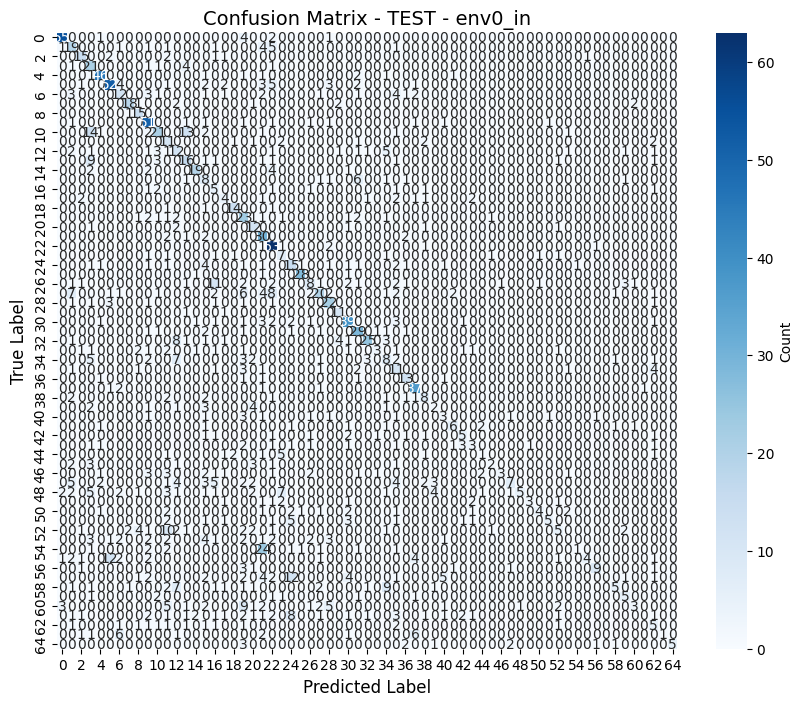


TRAIN - env1_in:
  Loss: 0.0499
  Accuracy: 0.9886, Precision: 0.9904, Recall: 0.9886, F1: 0.9893
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.png


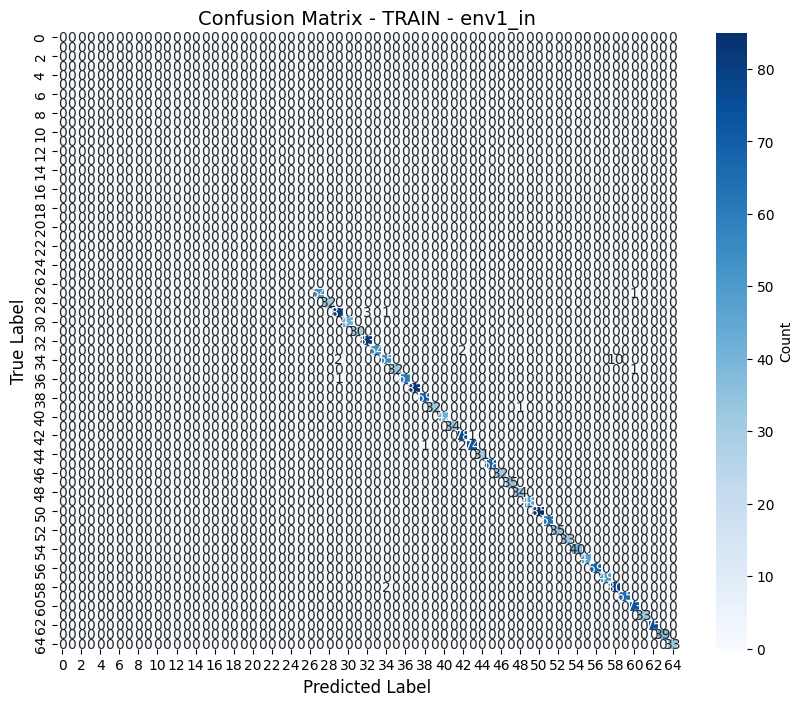


TRAIN - env2_in:
  Loss: 0.0303
  Accuracy: 0.9221, Precision: 0.9247, Recall: 0.9221, F1: 0.9234
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.png


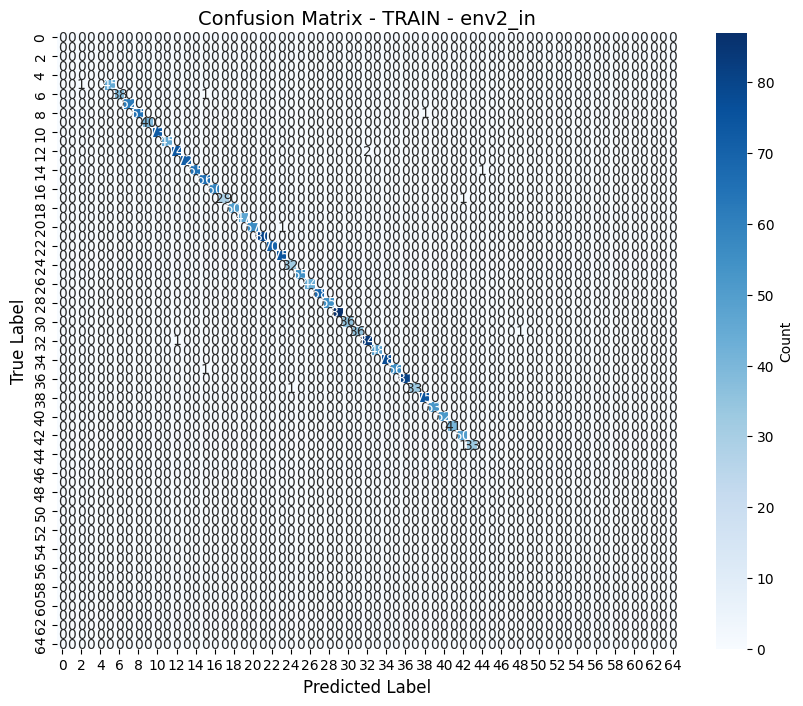


TRAIN - env3_in:
  Loss: 0.0234
  Accuracy: 0.9962, Precision: 0.9963, Recall: 0.9962, F1: 0.9962
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.png


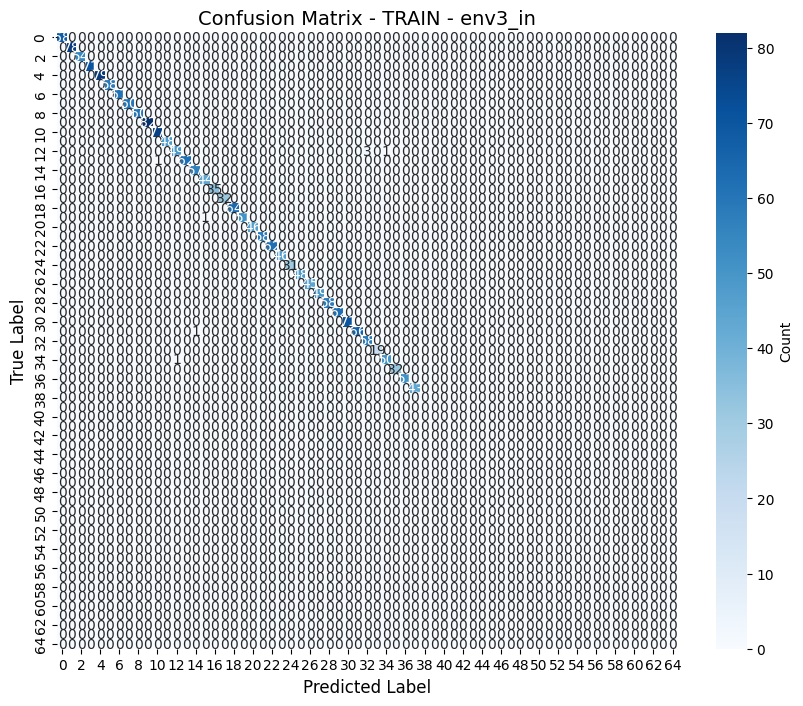


OTHER - env0_out:
  Loss: 2.4220
  Accuracy: 0.4359, Precision: 0.4448, Recall: 0.4359, F1: 0.3947
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.png


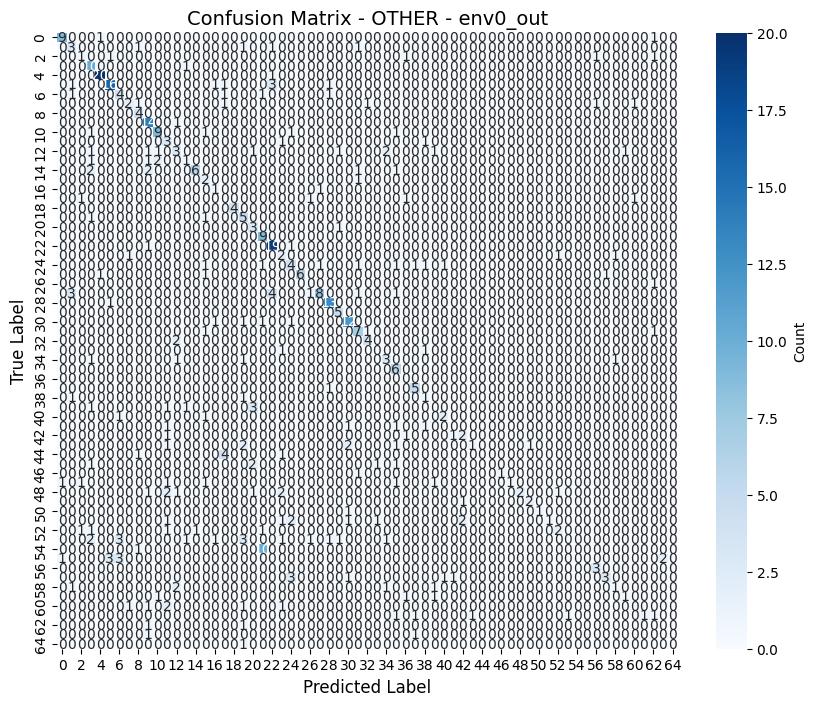


VAL - env1_out:
  Loss: 0.6455
  Accuracy: 0.6580, Precision: 0.6756, Recall: 0.6580, F1: 0.6566
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.png


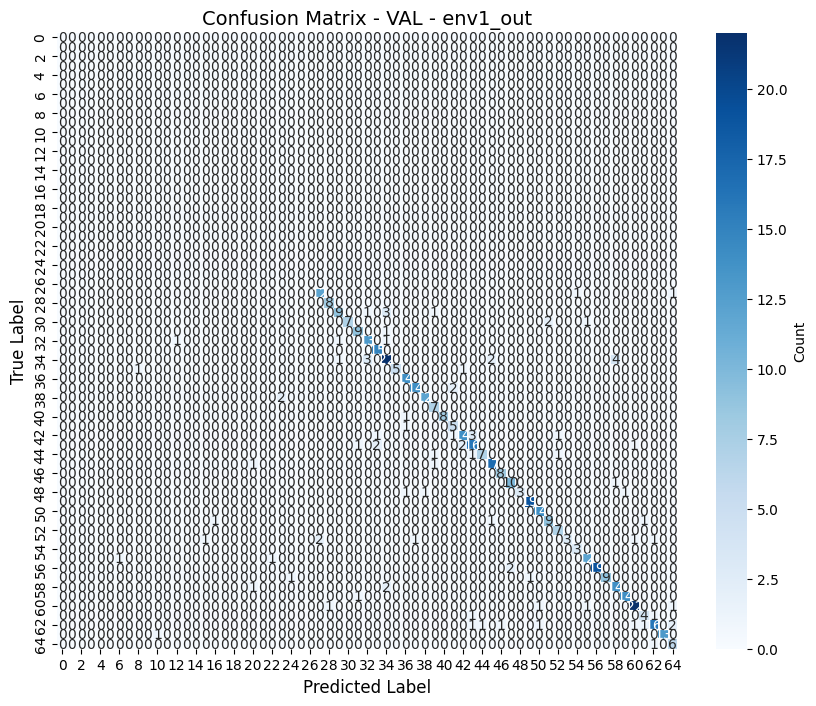


VAL - env2_out:
  Loss: 0.3968
  Accuracy: 0.7601, Precision: 0.7751, Recall: 0.7601, F1: 0.7628
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.png


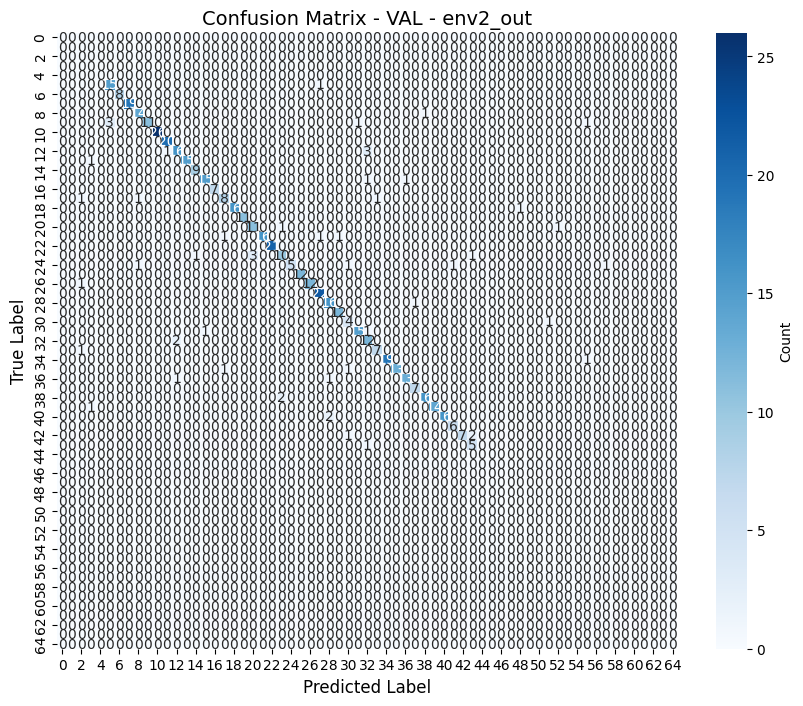


VAL - env3_out:
  Loss: 0.5480
  Accuracy: 0.6958, Precision: 0.7183, Recall: 0.6958, F1: 0.7024
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.png


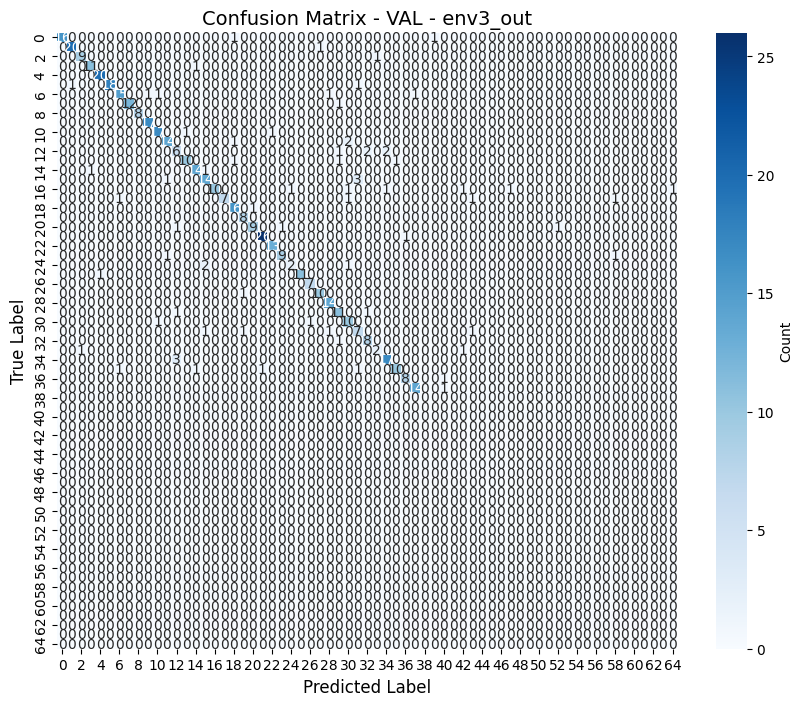


Training curves saved to: /kaggle/working/experiments/third_experiment/logs/training_curves_OfficeHome.png


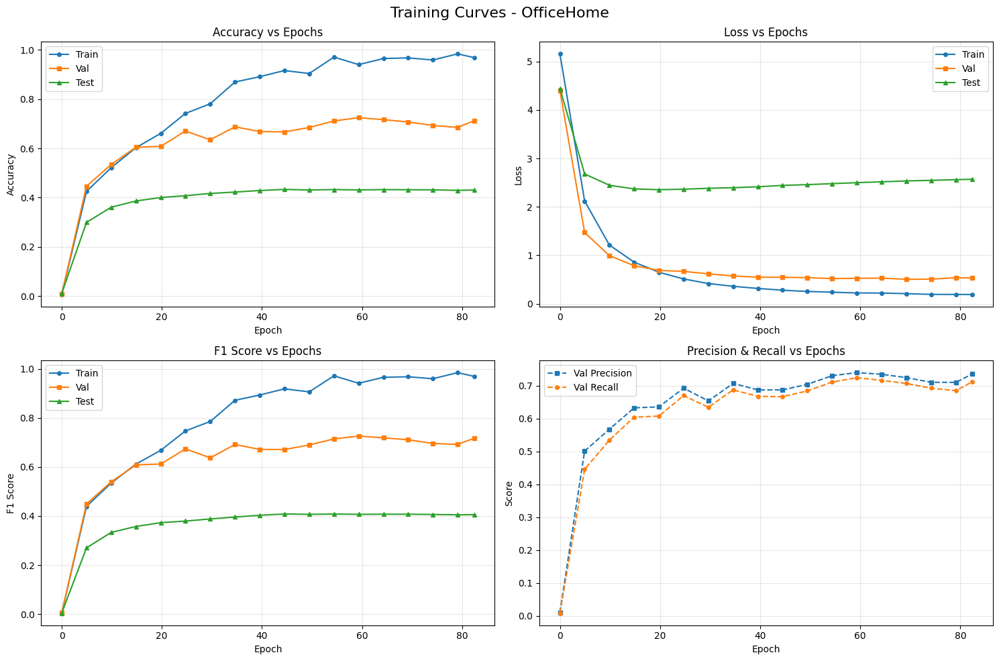

Epoch time plot saved to: /kaggle/working/experiments/third_experiment/logs/epoch_times_OfficeHome.png


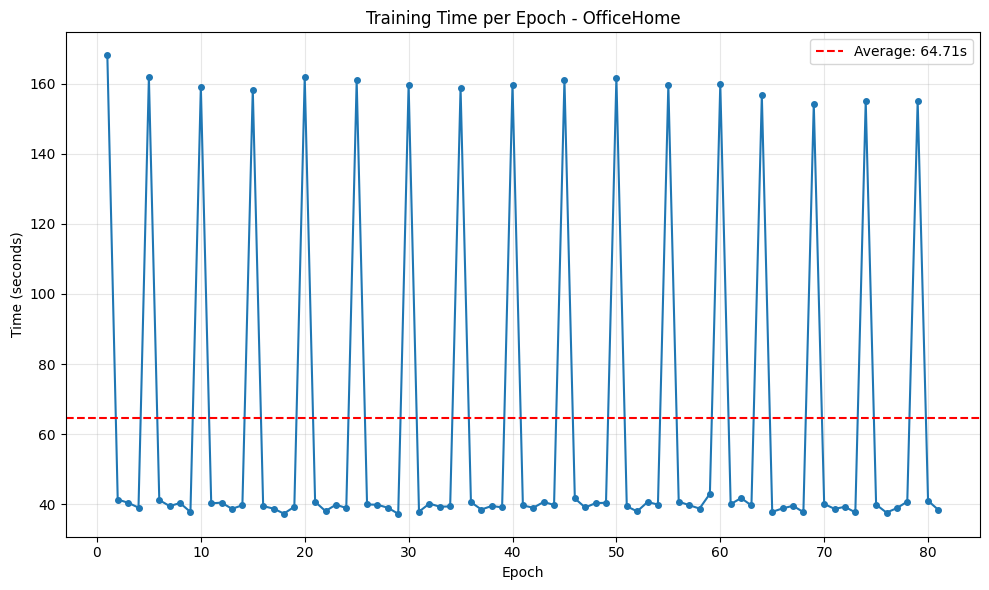


All results saved to: /kaggle/working/experiments/third_experiment/logs

Summary of saved files:
  - model_statistics.json
  - training_time_statistics.json
  - epoch_history.json
  - training_curves_OfficeHome.png
  - epoch_times_OfficeHome.png
  - confusion_matrix_*.csv (for all splits)
  - confusion_matrix_*.png (heatmaps for all splits)

✓ Experiment complete!
  Results: /kaggle/working/experiments/third_experiment/metrics_oh.csv
  Best model: /kaggle/working/experiments/third_experiment/best_model_oh.ckpt
  Config: /kaggle/working/experiments/third_experiment/config_oh.json
CONFUSION MATRICES:

confusion_matrix_OTHER_env0_out.png


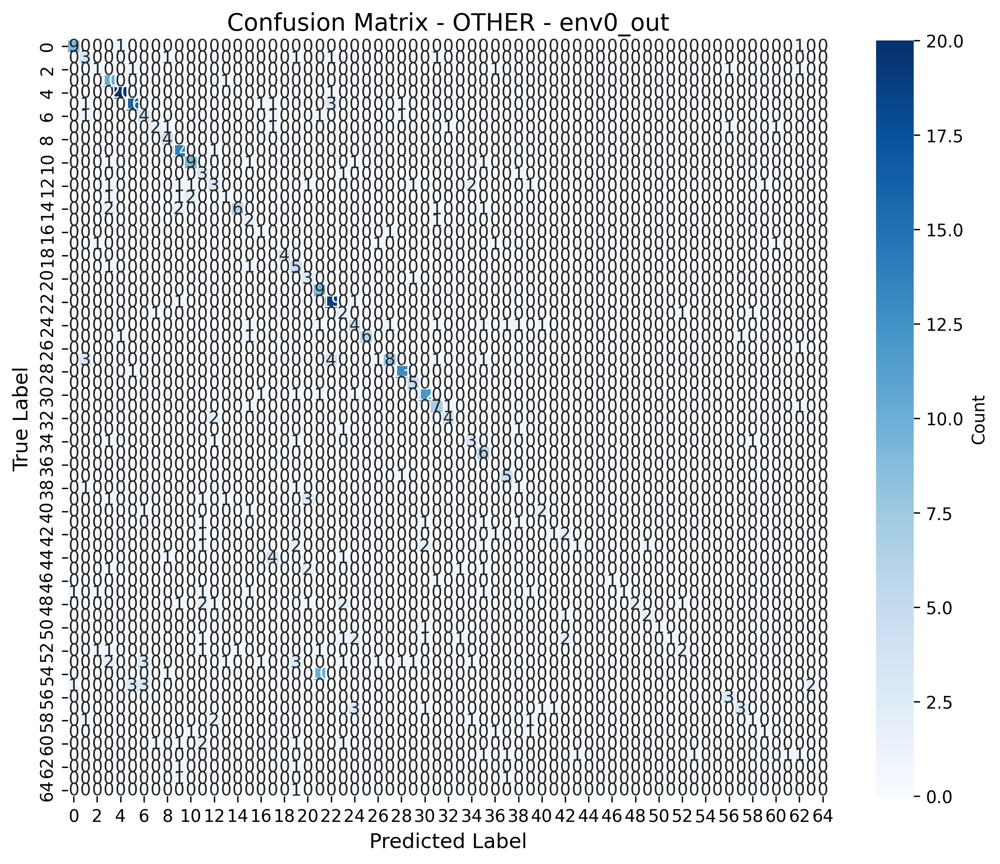


confusion_matrix_TEST_env0_in.png


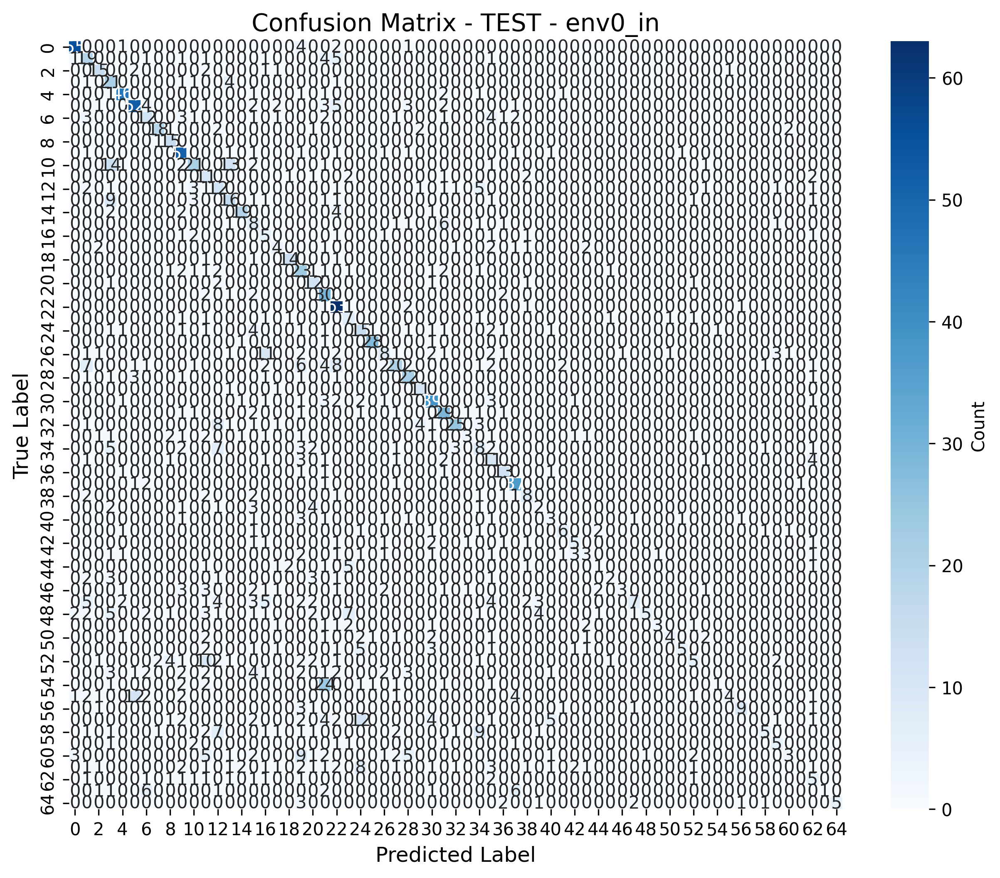


confusion_matrix_TRAIN_env1_in.png


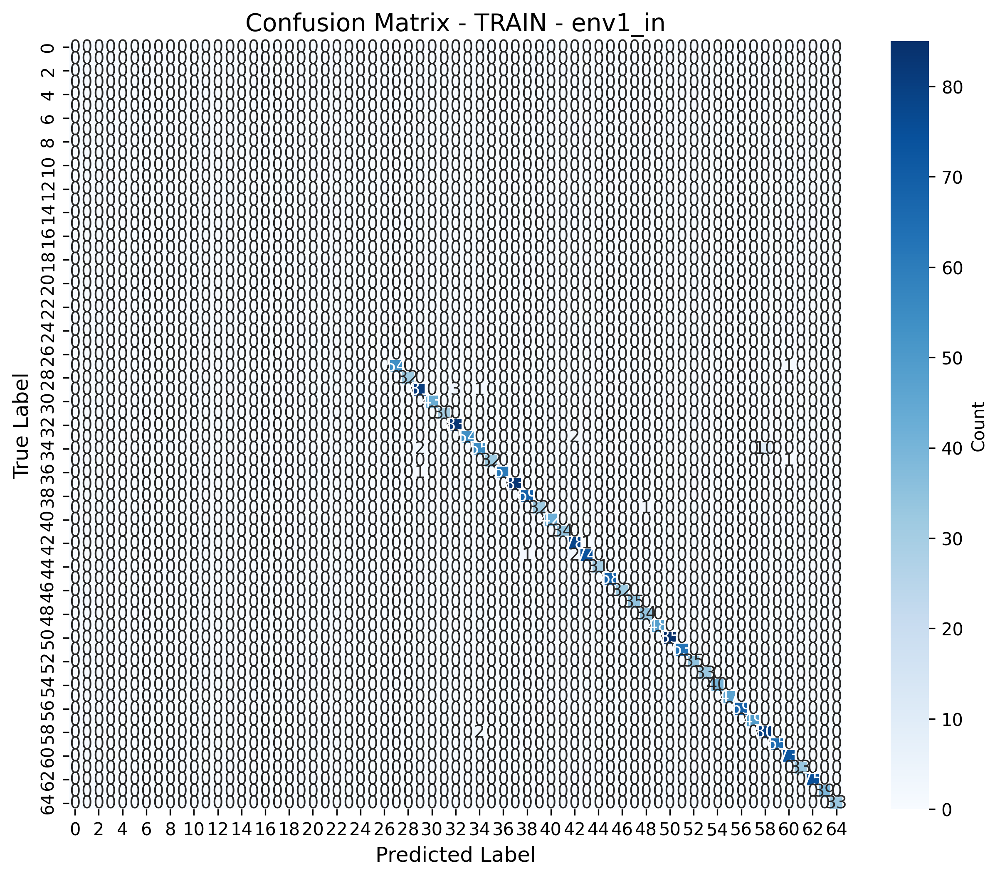


confusion_matrix_TRAIN_env2_in.png


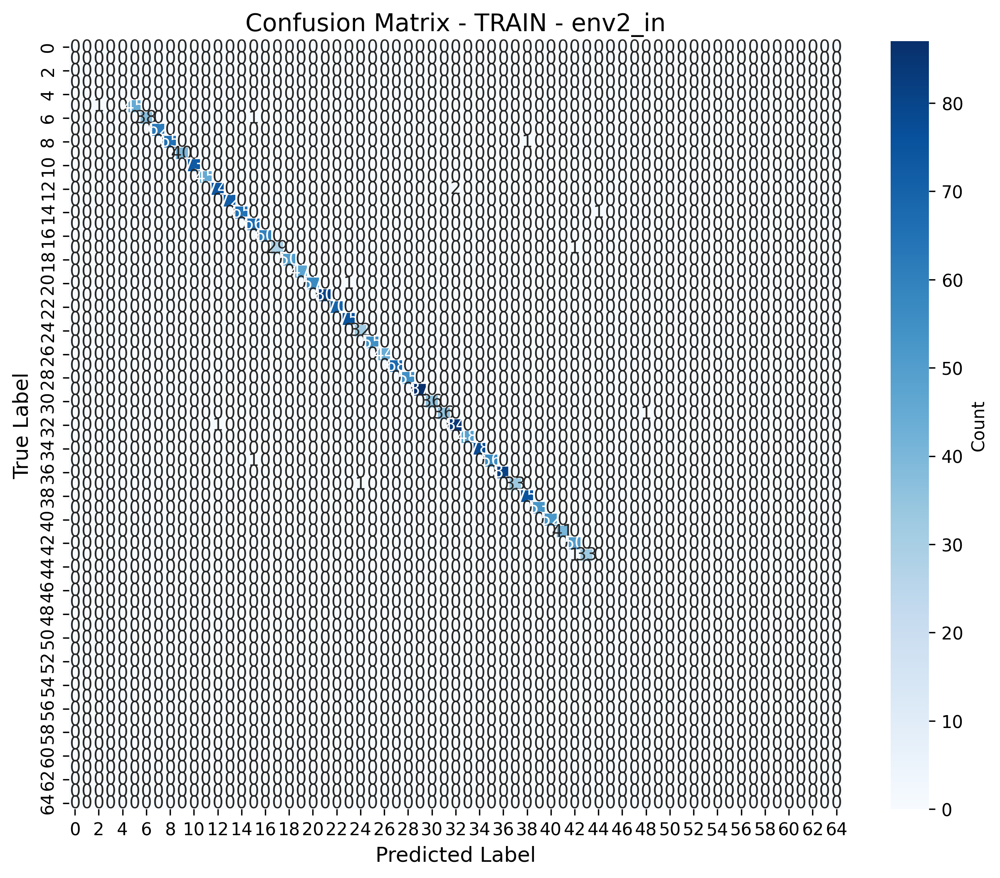


confusion_matrix_TRAIN_env3_in.png


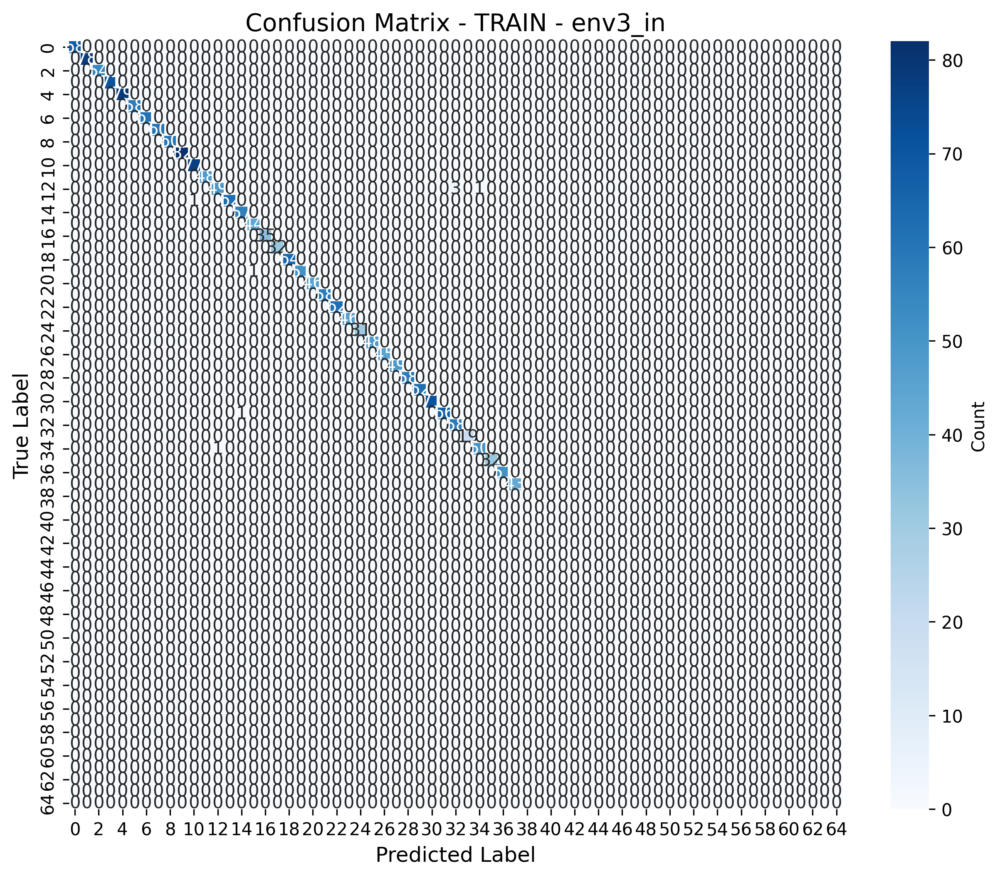


confusion_matrix_VAL_env1_out.png


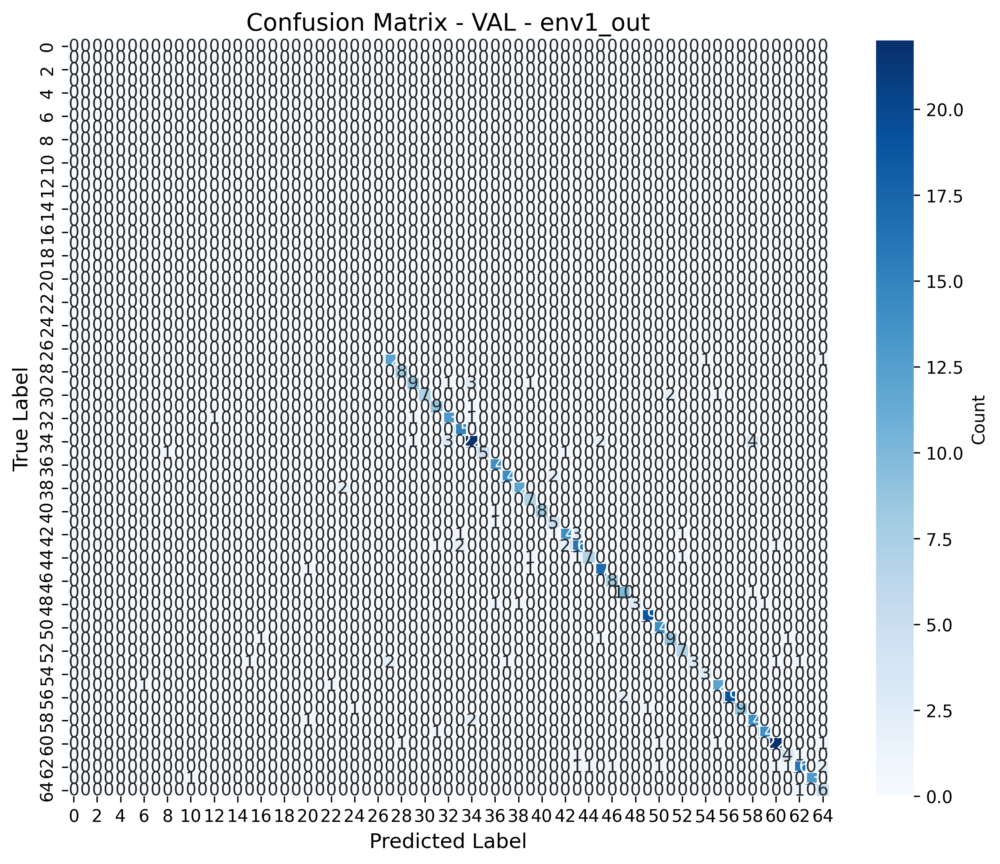


confusion_matrix_VAL_env2_out.png


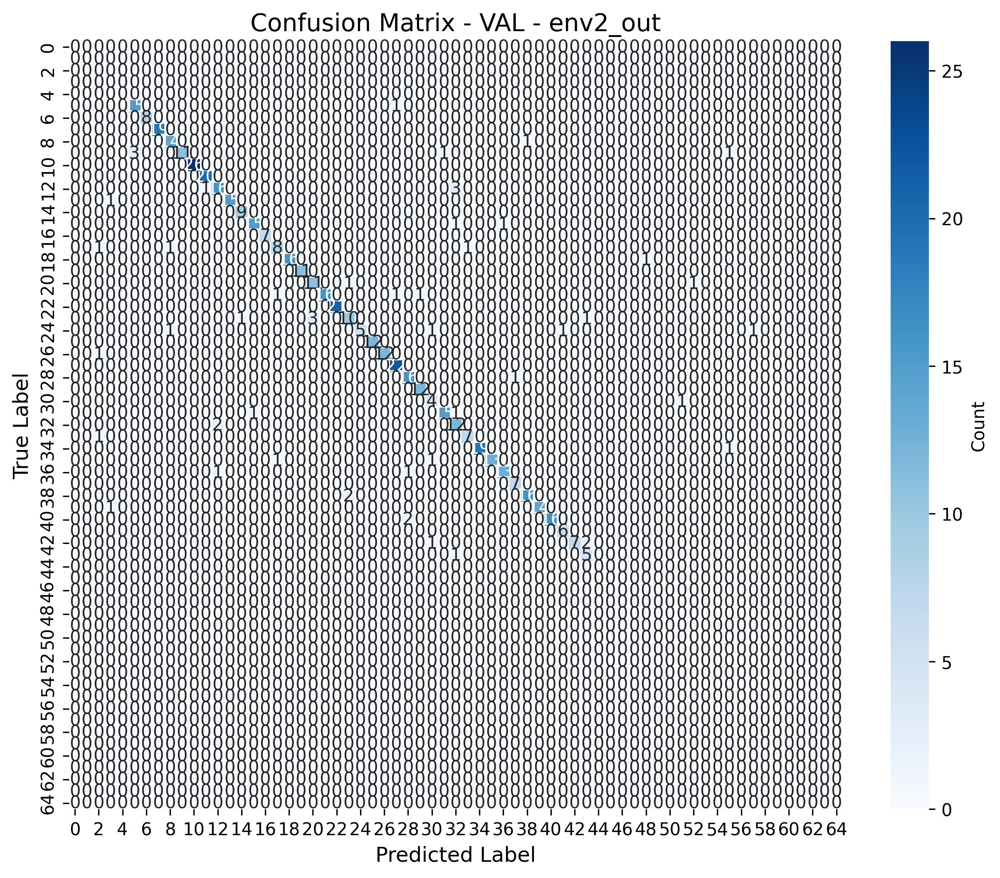


confusion_matrix_VAL_env3_out.png


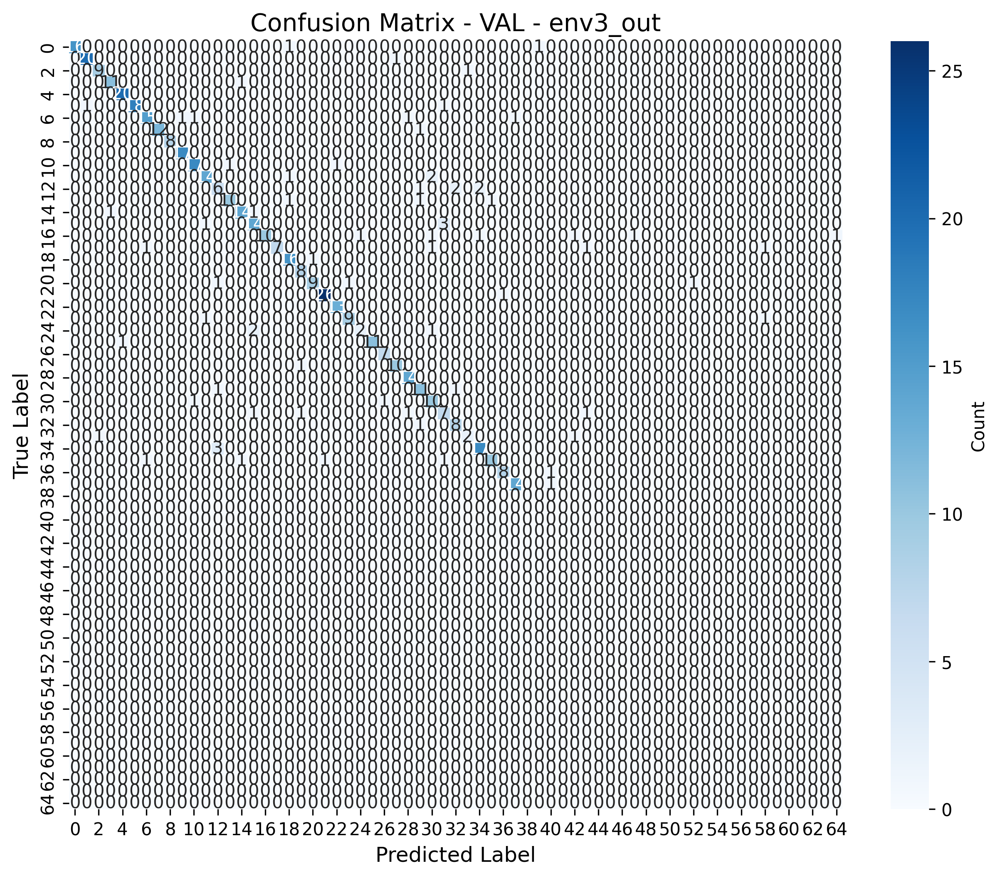



TRAINING CURVES:


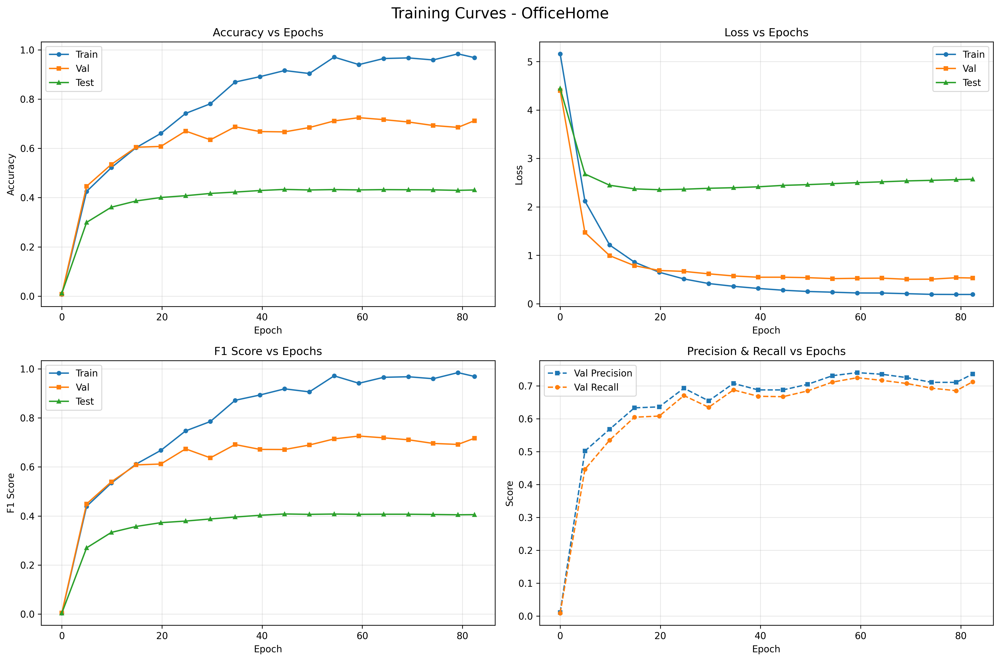

In [24]:


fit_simple(
exp_dir=str(exp_dir),
logger=logger,
seed=config.get("seed", 0),
trial_seed=config.get("trial_seed", 0),
hparams_seed=config.get("hparams_seed", 0),
algorithm_name=config["algo"],
dataset_name=dataset_name,
data_dir=config["data_dir"][dataset_name],
num_workers=config.get("num_workers", 4),
test_envs=[config["test_set_id"]],
overlap_type=config.get("overlap", "none"),
holdout_fraction=config.get("holdout_fraction", 0.2),
n_steps=config.get("n_epochs"),  # Changed to epochs!
checkpoint_freq=config.get("checkpoint_freq"),  # In epochs
model_checkpoint=config.get("model_checkpoint", {
    "metric": "val/acc",
    "maximize": True
}),
num_domain_linked_classes=config.get("num_domain_linked_classes"),
num_classes=config.get("num_classes"),
# AutoAugmentation specific
auto_augment=config.get("auto_augment", False),
augment_search_epochs=config.get("augment_search_epochs", 10),
)

logging.info(f"Experiment complete. Results saved to {exp_dir}")
print(f"\n✓ Experiment complete!")
print(f"  Results: {exp_dir / 'metrics_oh.csv'}")
print(f"  Best model: {exp_dir / 'best_model_oh.ckpt'}")
print(f"  Config: {exp_dir / 'config_oh.json'}")

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import display, Image
import os

log_dir = f"/kaggle/working/experiments/{exp_name_oh}/logs"

# Get all confusion matrix plot files
cm_files = [f for f in os.listdir(log_dir) if f.startswith('confusion_matrix_') and f.endswith('.png')]

# Display all confusion matrices
print("CONFUSION MATRICES:")
print("="*60)
for cm_file in sorted(cm_files):
    print(f"\n{cm_file}")
    display(Image(filename=os.path.join(log_dir, cm_file)))

# Display training curves
print("\n\nTRAINING CURVES:")
print("="*60)
display(Image(filename=os.path.join(log_dir, 'training_curves_OfficeHome.png')))




## PACS

In [25]:
output_dir = "/kaggle/working/experiments"
if not os.path.exists(output_dir):
    os.mkdir(output_dir)
exp_name_pacs = input()
config["name"] = exp_name_pacs

exp_name_pacs = config["name"] or f"{config['algo']}_{config['dataset']}_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
exp_dir = Path(output_dir) / exp_name_pacs
exp_dir.mkdir(parents=True, exist_ok=True)
log_dir = exp_dir / 'logs'
log_dir.mkdir(parents=True, exist_ok=True)
# Setup logging
config_logging()
logging.info(f"Starting experiment: {exp_name_pacs}")
logging.info(f"Output directory: {exp_dir}")

# Save config to experiment directory
with open(exp_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)


logger = CSVLogger(log_dir / 'metrics.csv',  root_dir=log_dir)## VLCS

 third_experiment


In [26]:
dataset_name_pacs = config["dataset"][0]
dataset_name_pacs

'PACS'

Seed set to 0


/kaggle/input/pacs-dataset/kfold
num_envs=4, num_filters=3, domain_class_filter=[[0, 1, 2, 3], [2, 3, 4, 5], [4, 5, 6, 0]]


  0%|          | 0/5001 [00:38<?, ?it/s]


=== Step 0 (Epoch 0.00) ===
TRAIN: loss: 3.2900 | acc: 0.0899 | precision: 0.2153 | recall: 0.0899 | recall: 0.0899 | f1: 0.0591 | oacc: 0.0314 | nacc: 0.1658
VAL: loss: 2.0588 | acc: 0.1008 | precision: 0.1859 | recall: 0.1008 | recall: 0.1008 | f1: 0.0703 | oacc: 0.0461 | nacc: 0.1687
TEST: loss: 2.0549 | acc: 0.1404 | precision: 0.1600 | recall: 0.1404 | recall: 0.1404 | f1: 0.1091 | oacc: 0.1267 | nacc: 0.1747
OTHER: loss: 2.0321 | acc: 0.1497 | precision: 0.1469 | recall: 0.1497 | recall: 0.1497 | f1: 0.1234 | oacc: 0.1429 | nacc: 0.1667


  6%|▌         | 300/5001 [03:09<30:38,  2.56it/s] 


=== Step 300 (Epoch 14.16) ===
TRAIN: loss: 1.0580 | acc: 0.9340 | precision: 0.9415 | recall: 0.9340 | recall: 0.9340 | f1: 0.9337 | oacc: 0.6154 | nacc: 0.3296
VAL: loss: 0.2395 | acc: 0.9161 | precision: 0.9225 | recall: 0.9161 | recall: 0.9161 | f1: 0.9161 | oacc: 0.6045 | nacc: 0.3210
TEST: loss: 1.9260 | acc: 0.5505 | precision: 0.6167 | recall: 0.5505 | recall: 0.5505 | f1: 0.4983 | oacc: 0.6850 | nacc: 0.2145
OTHER: loss: 2.1417 | acc: 0.5494 | precision: 0.6172 | recall: 0.5494 | recall: 0.5494 | f1: 0.4889 | oacc: 0.7017 | nacc: 0.1687


 12%|█▏        | 600/5001 [05:41<28:38,  2.56it/s]   


=== Step 600 (Epoch 28.32) ===
TRAIN: loss: 0.7985 | acc: 0.9708 | precision: 0.9738 | recall: 0.9708 | recall: 0.9708 | f1: 0.9707 | oacc: 0.6436 | nacc: 0.3325
VAL: loss: 0.1737 | acc: 0.9413 | precision: 0.9436 | recall: 0.9413 | recall: 0.9413 | f1: 0.9407 | oacc: 0.6247 | nacc: 0.3210
TEST: loss: 1.8596 | acc: 0.5873 | precision: 0.6407 | recall: 0.5873 | recall: 0.5873 | f1: 0.5432 | oacc: 0.7173 | nacc: 0.2623
OTHER: loss: 2.0926 | acc: 0.5969 | precision: 0.6365 | recall: 0.5969 | recall: 0.5969 | f1: 0.5368 | oacc: 0.7392 | nacc: 0.2410


 18%|█▊        | 900/5001 [08:12<26:52,  2.54it/s]   


=== Step 900 (Epoch 42.48) ===
TRAIN: loss: 0.7298 | acc: 0.9838 | precision: 0.9850 | recall: 0.9838 | recall: 0.9838 | f1: 0.9838 | oacc: 0.6537 | nacc: 0.3333
VAL: loss: 0.1334 | acc: 0.9536 | precision: 0.9559 | recall: 0.9536 | recall: 0.9536 | f1: 0.9537 | oacc: 0.6345 | nacc: 0.3210
TEST: loss: 1.9462 | acc: 0.5988 | precision: 0.6545 | recall: 0.5988 | recall: 0.5988 | f1: 0.5560 | oacc: 0.7296 | nacc: 0.2719
OTHER: loss: 2.2161 | acc: 0.6169 | precision: 0.6509 | recall: 0.6169 | recall: 0.6169 | f1: 0.5610 | oacc: 0.7504 | nacc: 0.2831


 24%|██▍       | 1200/5001 [10:44<24:48,  2.55it/s]  


=== Step 1200 (Epoch 56.64) ===
TRAIN: loss: 0.6945 | acc: 0.9907 | precision: 0.9911 | recall: 0.9907 | recall: 0.9907 | f1: 0.9906 | oacc: 0.6592 | nacc: 0.3333
VAL: loss: 0.1395 | acc: 0.8966 | precision: 0.8992 | recall: 0.8966 | recall: 0.8966 | f1: 0.8974 | oacc: 0.6406 | nacc: 0.3175
TEST: loss: 1.9997 | acc: 0.6036 | precision: 0.6620 | recall: 0.6036 | recall: 0.6036 | f1: 0.5656 | oacc: 0.7292 | nacc: 0.2896
OTHER: loss: 2.2915 | acc: 0.6215 | precision: 0.6583 | recall: 0.6215 | recall: 0.6215 | f1: 0.5695 | oacc: 0.7496 | nacc: 0.3012


 30%|███       | 1501/5001 [13:15<10:04:18, 10.36s/it]


=== Step 1500 (Epoch 70.80) ===
TRAIN: loss: 0.6845 | acc: 0.9946 | precision: 0.9946 | recall: 0.9946 | recall: 0.9946 | f1: 0.9945 | oacc: 0.6625 | nacc: 0.3328
VAL: loss: 0.1132 | acc: 0.9576 | precision: 0.9604 | recall: 0.9576 | recall: 0.9576 | f1: 0.9584 | oacc: 0.6378 | nacc: 0.3207
TEST: loss: 2.0022 | acc: 0.6110 | precision: 0.6619 | recall: 0.6110 | recall: 0.6110 | f1: 0.5714 | oacc: 0.7357 | nacc: 0.2992
OTHER: loss: 2.3184 | acc: 0.6300 | precision: 0.6566 | recall: 0.6300 | recall: 0.6300 | f1: 0.5822 | oacc: 0.7591 | nacc: 0.3072


 36%|███▌      | 1800/5001 [15:46<21:02,  2.54it/s]   


=== Step 1800 (Epoch 84.96) ===
TRAIN: loss: 0.6793 | acc: 0.9951 | precision: 0.9952 | recall: 0.9951 | recall: 0.9951 | f1: 0.9950 | oacc: 0.6628 | nacc: 0.3333
VAL: loss: 0.1072 | acc: 0.9670 | precision: 0.9683 | recall: 0.9670 | recall: 0.9670 | f1: 0.9673 | oacc: 0.6440 | nacc: 0.3239
TEST: loss: 1.9982 | acc: 0.6145 | precision: 0.6619 | recall: 0.6145 | recall: 0.6145 | f1: 0.5751 | oacc: 0.7384 | nacc: 0.3046
OTHER: loss: 2.3577 | acc: 0.6278 | precision: 0.6548 | recall: 0.6278 | recall: 0.6278 | f1: 0.5835 | oacc: 0.7561 | nacc: 0.3072


 42%|████▏     | 2100/5001 [18:17<19:06,  2.53it/s]  


=== Step 2100 (Epoch 99.12) ===
TRAIN: loss: 0.6702 | acc: 0.9970 | precision: 0.9970 | recall: 0.9970 | recall: 0.9970 | f1: 0.9970 | oacc: 0.6643 | nacc: 0.3333
VAL: loss: 0.1325 | acc: 0.9678 | precision: 0.9683 | recall: 0.9678 | recall: 0.9678 | f1: 0.9678 | oacc: 0.6467 | nacc: 0.3187
TEST: loss: 2.0232 | acc: 0.6208 | precision: 0.6685 | recall: 0.6208 | recall: 0.6208 | f1: 0.5833 | oacc: 0.7456 | nacc: 0.3087
OTHER: loss: 2.3254 | acc: 0.6323 | precision: 0.6531 | recall: 0.6323 | recall: 0.6323 | f1: 0.5878 | oacc: 0.7623 | nacc: 0.3072


 48%|████▊     | 2401/5001 [20:48<7:30:32, 10.40s/it]


=== Step 2400 (Epoch 113.27) ===
TRAIN: loss: 0.6649 | acc: 0.9985 | precision: 0.9985 | recall: 0.9985 | recall: 0.9985 | f1: 0.9985 | oacc: 0.6654 | nacc: 0.3333
VAL: loss: 0.0929 | acc: 0.9601 | precision: 0.9614 | recall: 0.9601 | recall: 0.9601 | f1: 0.9604 | oacc: 0.6411 | nacc: 0.3173
TEST: loss: 2.0063 | acc: 0.6215 | precision: 0.6700 | recall: 0.6215 | recall: 0.6215 | f1: 0.5854 | oacc: 0.7478 | nacc: 0.3060
OTHER: loss: 2.3726 | acc: 0.6363 | precision: 0.6582 | recall: 0.6363 | recall: 0.6363 | f1: 0.5938 | oacc: 0.7679 | nacc: 0.3072


 54%|█████▍    | 2700/5001 [23:21<15:02,  2.55it/s]  


=== Step 2700 (Epoch 127.43) ===
TRAIN: loss: 0.6740 | acc: 0.9986 | precision: 0.9986 | recall: 0.9986 | recall: 0.9986 | f1: 0.9986 | oacc: 0.6657 | nacc: 0.3331
VAL: loss: 0.0961 | acc: 0.9692 | precision: 0.9699 | recall: 0.9692 | recall: 0.9692 | f1: 0.9694 | oacc: 0.6480 | nacc: 0.3184
TEST: loss: 2.0018 | acc: 0.6231 | precision: 0.8127 | recall: 0.6231 | recall: 0.6231 | f1: 0.5882 | oacc: 0.7472 | nacc: 0.3128
OTHER: loss: 2.3872 | acc: 0.6460 | precision: 0.6628 | recall: 0.6460 | recall: 0.6460 | f1: 0.6035 | oacc: 0.7815 | nacc: 0.3072


 60%|█████▉    | 3000/5001 [25:54<13:06,  2.54it/s]  


=== Step 3000 (Epoch 141.59) ===
TRAIN: loss: 0.6631 | acc: 0.9999 | precision: 0.9999 | recall: 0.9999 | recall: 0.9999 | f1: 0.9999 | oacc: 0.6666 | nacc: 0.3333
VAL: loss: 0.0937 | acc: 0.9757 | precision: 0.9771 | recall: 0.9757 | recall: 0.9757 | f1: 0.9763 | oacc: 0.6528 | nacc: 0.3196
TEST: loss: 1.9608 | acc: 0.6266 | precision: 0.8141 | recall: 0.6266 | recall: 0.6266 | f1: 0.5904 | oacc: 0.7510 | nacc: 0.3155
OTHER: loss: 2.3735 | acc: 0.6428 | precision: 0.6561 | recall: 0.6428 | recall: 0.6428 | f1: 0.5966 | oacc: 0.7794 | nacc: 0.3012


 66%|██████▌   | 3301/5001 [28:26<4:58:52, 10.55s/it]


=== Step 3300 (Epoch 155.75) ===
TRAIN: loss: 0.6621 | acc: 0.9996 | precision: 0.9996 | recall: 0.9996 | recall: 0.9996 | f1: 0.9996 | oacc: 0.6663 | nacc: 0.3333
VAL: loss: 0.0915 | acc: 0.9735 | precision: 0.9735 | recall: 0.9735 | recall: 0.9735 | f1: 0.9734 | oacc: 0.6497 | nacc: 0.3227
TEST: loss: 1.9609 | acc: 0.6312 | precision: 0.8119 | recall: 0.6312 | recall: 0.6312 | f1: 0.5947 | oacc: 0.7531 | nacc: 0.3263
OTHER: loss: 2.3717 | acc: 0.6507 | precision: 0.6542 | recall: 0.6507 | recall: 0.6507 | f1: 0.6052 | oacc: 0.7906 | nacc: 0.3012


 72%|███████▏  | 3601/5001 [30:58<4:07:17, 10.60s/it]


=== Step 3600 (Epoch 169.91) ===
TRAIN: loss: 0.6601 | acc: 0.9996 | precision: 0.9996 | recall: 0.9996 | recall: 0.9996 | f1: 0.9996 | oacc: 0.6663 | nacc: 0.3333
VAL: loss: 0.0818 | acc: 0.9682 | precision: 0.9694 | recall: 0.9682 | recall: 0.9682 | f1: 0.9687 | oacc: 0.6484 | nacc: 0.3152
TEST: loss: 1.9425 | acc: 0.6366 | precision: 0.8131 | recall: 0.6366 | recall: 0.6366 | f1: 0.5994 | oacc: 0.7580 | nacc: 0.3332
OTHER: loss: 2.3423 | acc: 0.6527 | precision: 0.6552 | recall: 0.6527 | recall: 0.6527 | f1: 0.6079 | oacc: 0.7933 | nacc: 0.3012


 78%|███████▊  | 3901/5001 [33:32<3:19:04, 10.86s/it]


=== Step 3900 (Epoch 184.07) ===
TRAIN: loss: 0.6588 | acc: 1.0000 | precision: 1.0000 | recall: 1.0000 | recall: 1.0000 | f1: 1.0000 | oacc: 0.6667 | nacc: 0.3333
VAL: loss: 0.1046 | acc: 0.9736 | precision: 0.9736 | recall: 0.9736 | recall: 0.9736 | f1: 0.9734 | oacc: 0.6506 | nacc: 0.3207
TEST: loss: 1.9516 | acc: 0.6381 | precision: 0.8126 | recall: 0.6381 | recall: 0.6381 | f1: 0.6006 | oacc: 0.7590 | nacc: 0.3359
OTHER: loss: 2.3277 | acc: 0.6552 | precision: 0.6542 | recall: 0.6552 | recall: 0.6552 | f1: 0.6092 | oacc: 0.7968 | nacc: 0.3012


 84%|████████▍ | 4201/5001 [36:04<2:21:24, 10.61s/it]


=== Step 4200 (Epoch 198.23) ===
TRAIN: loss: 0.6558 | acc: 0.9991 | precision: 0.9990 | recall: 0.9991 | recall: 0.9991 | f1: 0.9990 | oacc: 0.6659 | nacc: 0.3333
VAL: loss: 0.0879 | acc: 0.9682 | precision: 0.9703 | recall: 0.9682 | recall: 0.9682 | f1: 0.9690 | oacc: 0.6459 | nacc: 0.3219
TEST: loss: 1.9407 | acc: 0.6394 | precision: 0.8119 | recall: 0.6394 | recall: 0.6394 | f1: 0.6009 | oacc: 0.7629 | nacc: 0.3304
OTHER: loss: 2.3520 | acc: 0.6552 | precision: 0.6559 | recall: 0.6552 | recall: 0.6552 | f1: 0.6096 | oacc: 0.7968 | nacc: 0.3012


 90%|█████████ | 4501/5001 [38:36<1:28:01, 10.56s/it]


=== Step 4500 (Epoch 212.39) ===
TRAIN: loss: 0.6614 | acc: 0.9997 | precision: 0.9997 | recall: 0.9997 | recall: 0.9997 | f1: 0.9997 | oacc: 0.6665 | nacc: 0.3333
VAL: loss: 0.0946 | acc: 0.9039 | precision: 0.9055 | recall: 0.9039 | recall: 0.9039 | f1: 0.9045 | oacc: 0.6478 | nacc: 0.3173
TEST: loss: 1.9190 | acc: 0.6438 | precision: 0.8137 | recall: 0.6438 | recall: 0.6438 | f1: 0.6056 | oacc: 0.7664 | nacc: 0.3373
OTHER: loss: 2.3437 | acc: 0.6589 | precision: 0.6571 | recall: 0.6589 | recall: 0.6589 | f1: 0.6133 | oacc: 0.7996 | nacc: 0.3072


 96%|█████████▌| 4801/5001 [41:09<35:16, 10.58s/it]  


=== Step 4800 (Epoch 226.55) ===
TRAIN: loss: 0.6585 | acc: 0.9999 | precision: 0.9999 | recall: 0.9999 | recall: 0.9999 | f1: 0.9999 | oacc: 0.6666 | nacc: 0.3333
VAL: loss: 0.1136 | acc: 0.9704 | precision: 0.9716 | recall: 0.9704 | recall: 0.9704 | f1: 0.9709 | oacc: 0.6477 | nacc: 0.3216
TEST: loss: 1.8946 | acc: 0.6458 | precision: 0.8138 | recall: 0.6458 | recall: 0.6458 | f1: 0.6073 | oacc: 0.7709 | nacc: 0.3332
OTHER: loss: 2.3333 | acc: 0.6632 | precision: 0.6584 | recall: 0.6632 | recall: 0.6632 | f1: 0.6166 | oacc: 0.8031 | nacc: 0.3133


100%|██████████| 5001/5001 [43:02<00:00,  1.94it/s]



=== Step 5000 (Epoch 235.99) ===
TRAIN: loss: 0.6636 | acc: 0.9996 | precision: 0.9996 | recall: 0.9996 | recall: 0.9996 | f1: 0.9996 | oacc: 0.6663 | nacc: 0.3333
VAL: loss: 0.0944 | acc: 0.9716 | precision: 0.9726 | recall: 0.9716 | recall: 0.9716 | f1: 0.9719 | oacc: 0.6478 | nacc: 0.3239
TEST: loss: 1.9437 | acc: 0.6487 | precision: 0.8151 | recall: 0.6487 | recall: 0.6487 | f1: 0.6119 | oacc: 0.7744 | nacc: 0.3344
OTHER: loss: 2.3518 | acc: 0.6614 | precision: 0.6578 | recall: 0.6614 | recall: 0.6614 | f1: 0.6150 | oacc: 0.8031 | nacc: 0.3072
Saved final SWAD model to: /kaggle/working/experiments/third_experiment/logs/swad_final_model.ckpt

TRAINING COMPLETED
Total training time: 2582.93s (43.05 minutes)
Average time per epoch: 11.21s
Total epochs: 227


FINAL EVALUATION - CONFUSION MATRICES

TEST - env0_in:
  Loss: 1.9176
  Accuracy: 0.6487, Precision: 0.8151, Recall: 0.6487, F1: 0.6119
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TEST_env0_

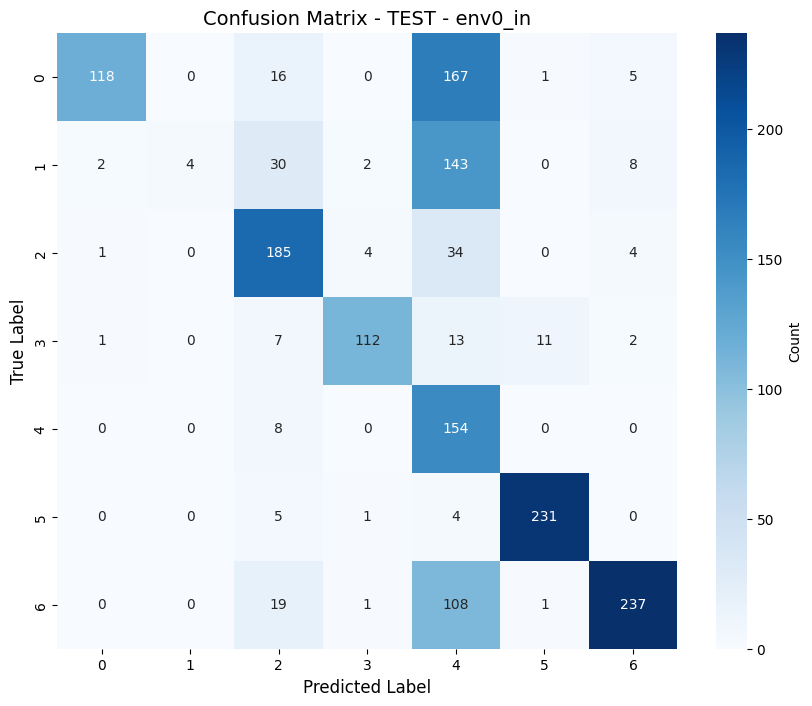


TRAIN - env1_in:
  Loss: 0.0009
  Accuracy: 1.0000, Precision: 1.0000, Recall: 1.0000, F1: 1.0000
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.png


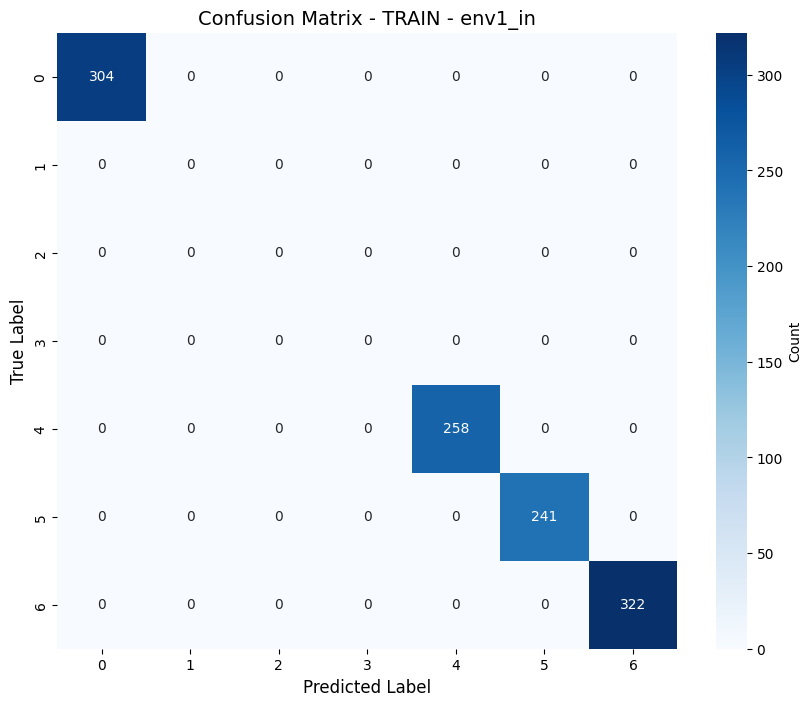


TRAIN - env2_in:
  Loss: 0.0001
  Accuracy: 1.0000, Precision: 1.0000, Recall: 1.0000, F1: 1.0000
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.png


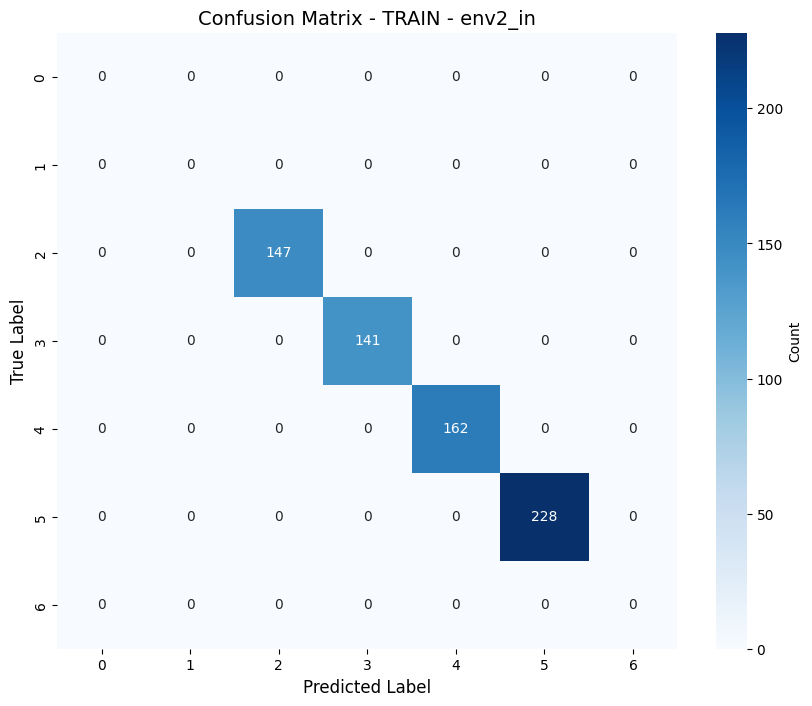


TRAIN - env3_in:
  Loss: 0.0024
  Accuracy: 0.9996, Precision: 0.9996, Recall: 0.9996, F1: 0.9996
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.png


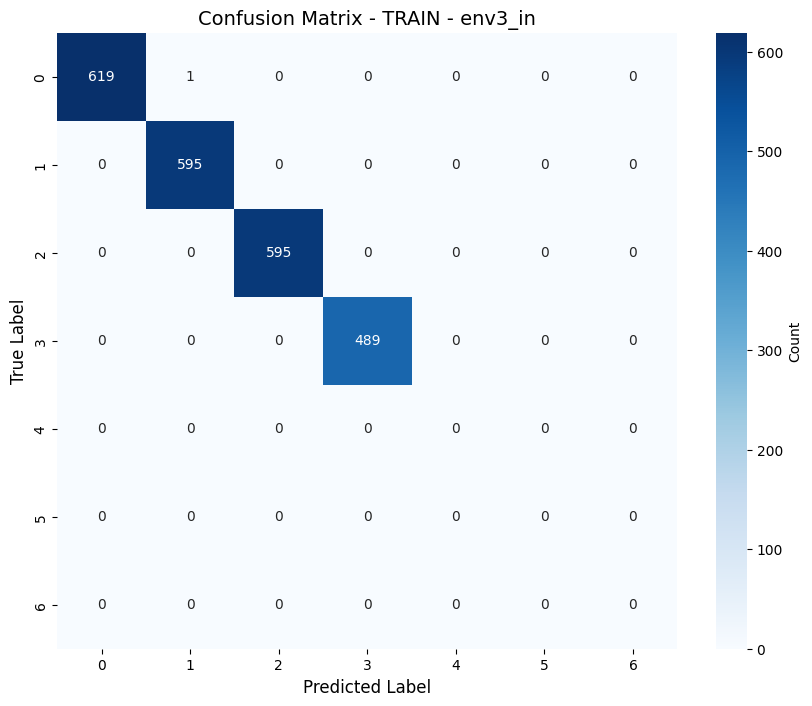


OTHER - env0_out:
  Loss: 2.3153
  Accuracy: 0.6614, Precision: 0.6578, Recall: 0.6614, F1: 0.6150
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.png


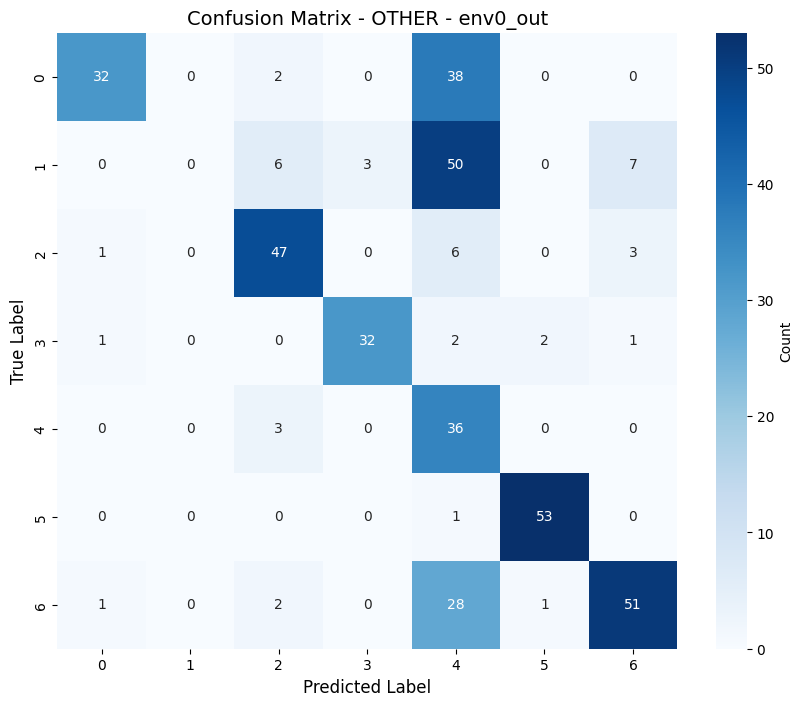


VAL - env1_out:
  Loss: 0.1763
  Accuracy: 0.9663, Precision: 0.9697, Recall: 0.9663, F1: 0.9679
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.png


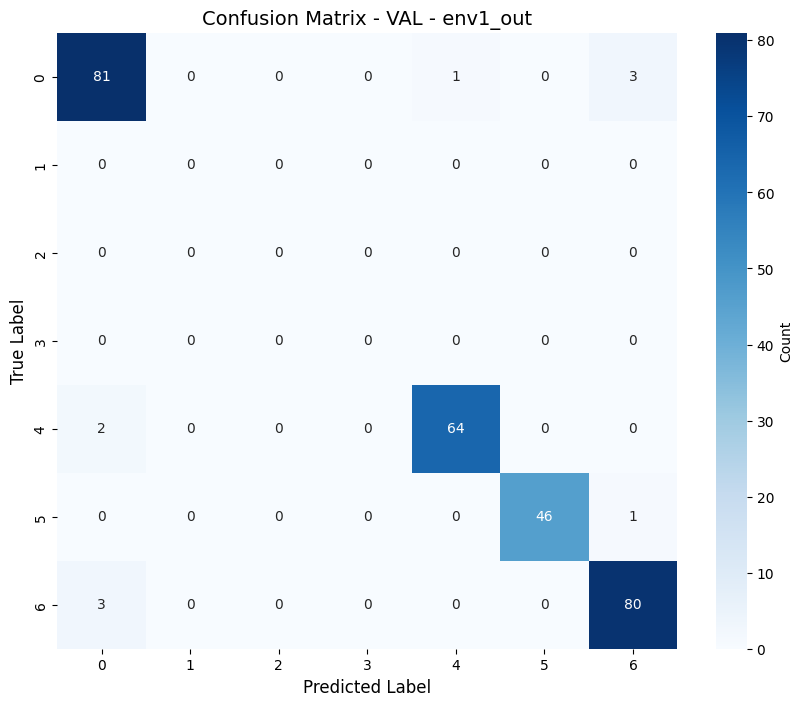


VAL - env2_out:
  Loss: 0.0305
  Accuracy: 0.9865, Precision: 0.9883, Recall: 0.9865, F1: 0.9872
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.png


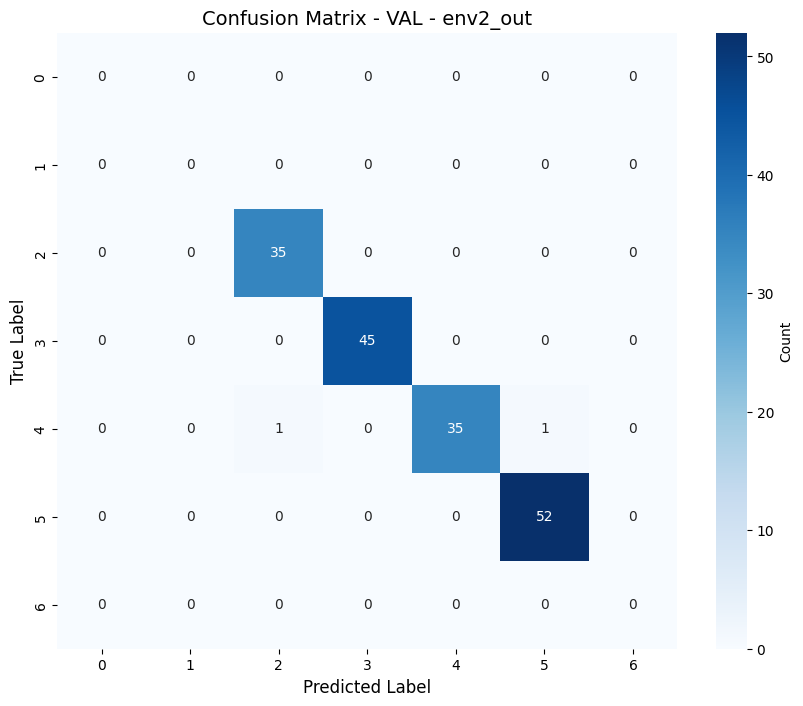


VAL - env3_out:
  Loss: 0.0929
  Accuracy: 0.9651, Precision: 0.9655, Recall: 0.9651, F1: 0.9649
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.png


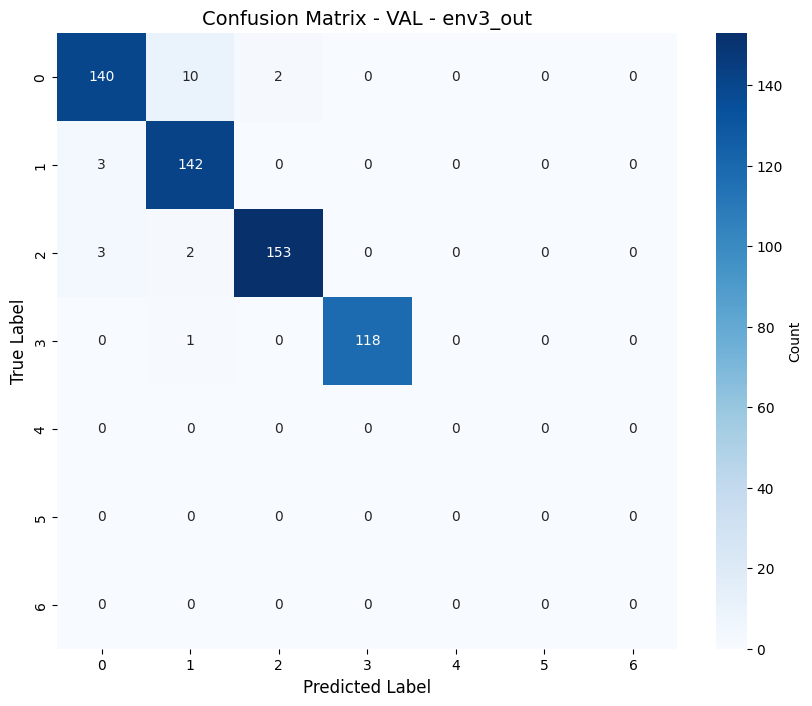


Training curves saved to: /kaggle/working/experiments/third_experiment/logs/training_curves_PACS.png


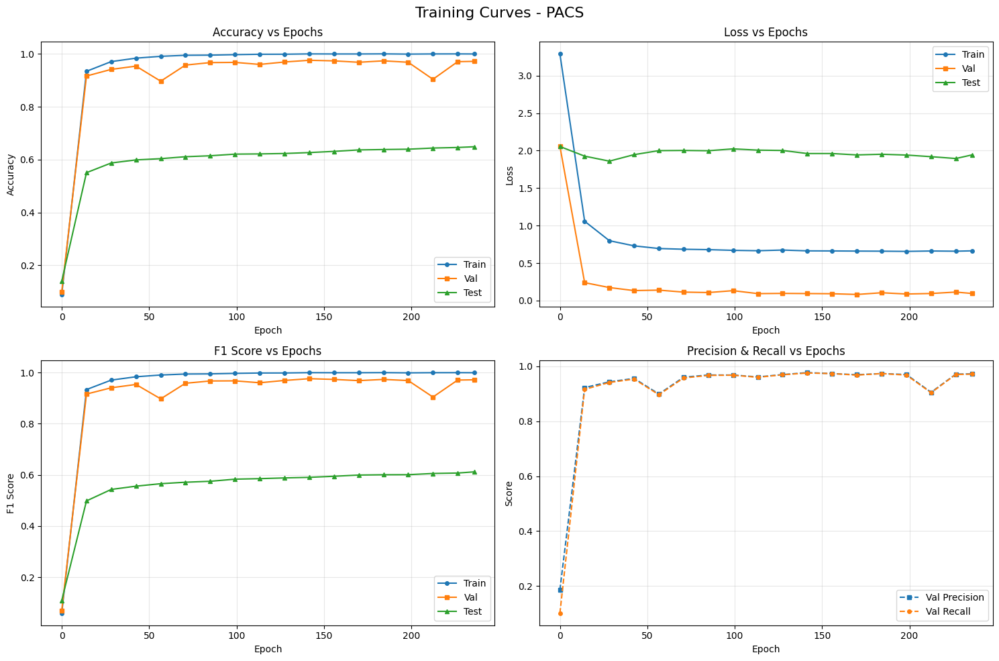

Epoch time plot saved to: /kaggle/working/experiments/third_experiment/logs/epoch_times_PACS.png


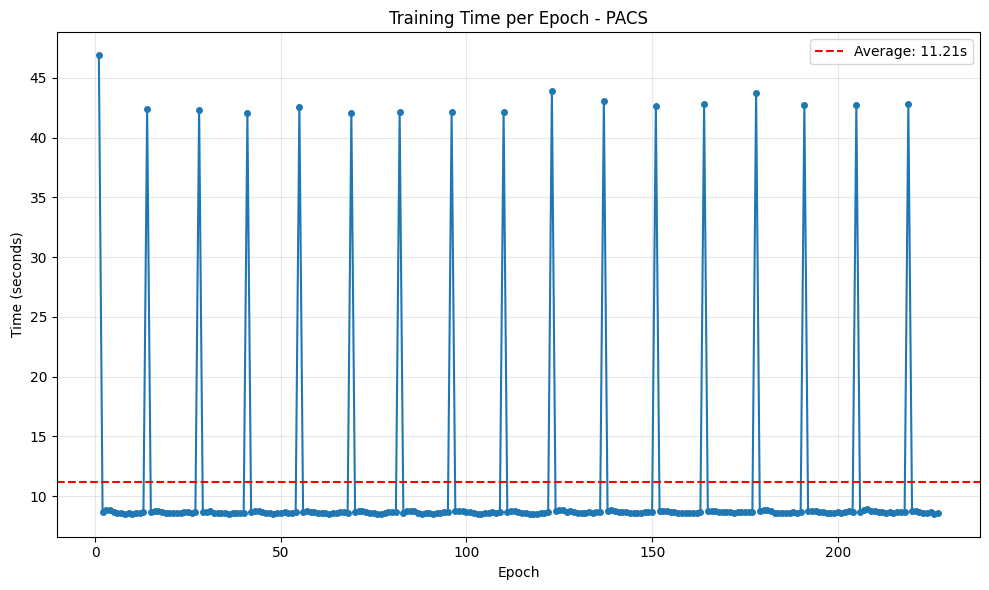


All results saved to: /kaggle/working/experiments/third_experiment/logs

Summary of saved files:
  - model_statistics.json
  - training_time_statistics.json
  - epoch_history.json
  - training_curves_PACS.png
  - epoch_times_PACS.png
  - confusion_matrix_*.csv (for all splits)
  - confusion_matrix_*.png (heatmaps for all splits)

✓ Experiment complete!
  Results: /kaggle/working/experiments/third_experiment/metrics_pacs.csv
  Best model: /kaggle/working/experiments/third_experiment/best_model_pacs.ckpt
  Config: /kaggle/working/experiments/third_experiment/config_pacs.json
CONFUSION MATRICES:

confusion_matrix_OTHER_env0_out.png


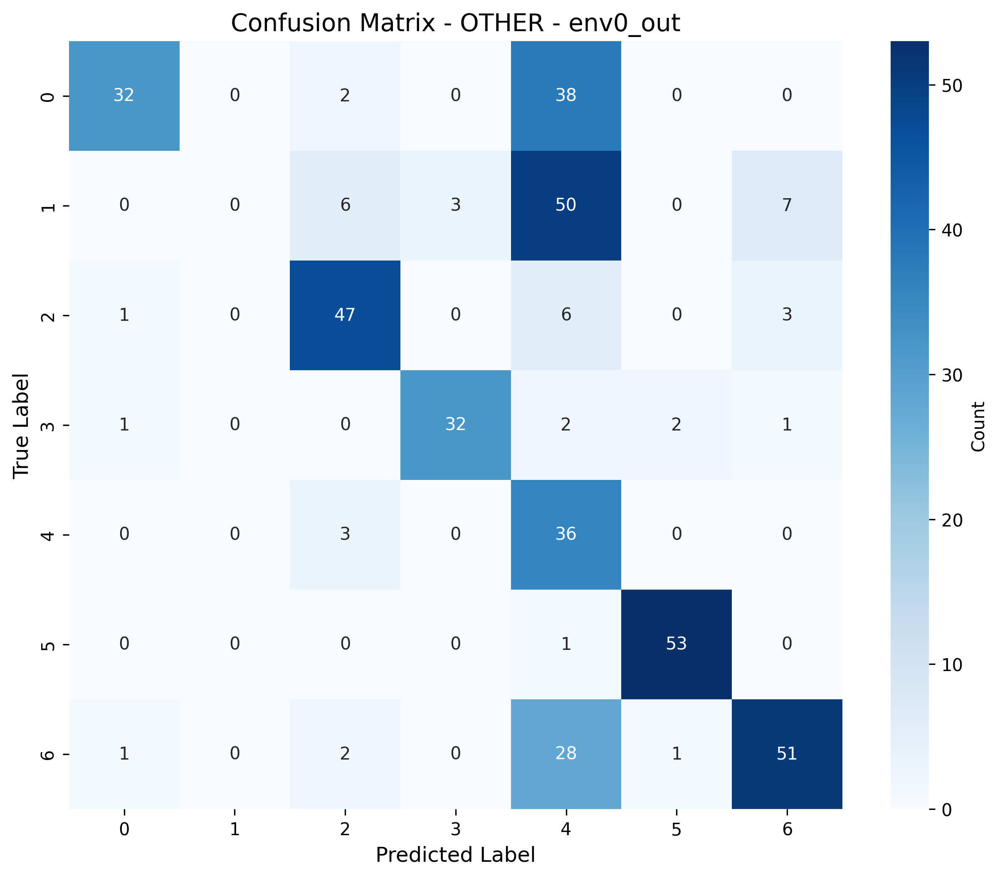


confusion_matrix_TEST_env0_in.png


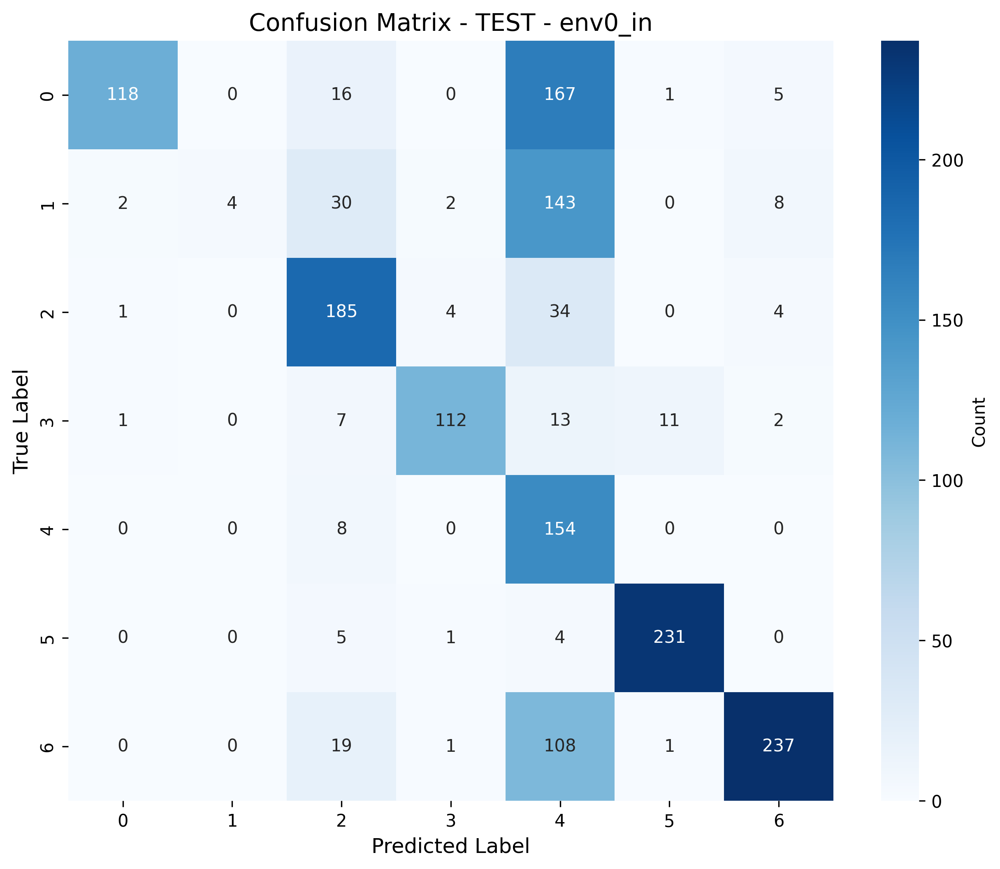


confusion_matrix_TRAIN_env1_in.png


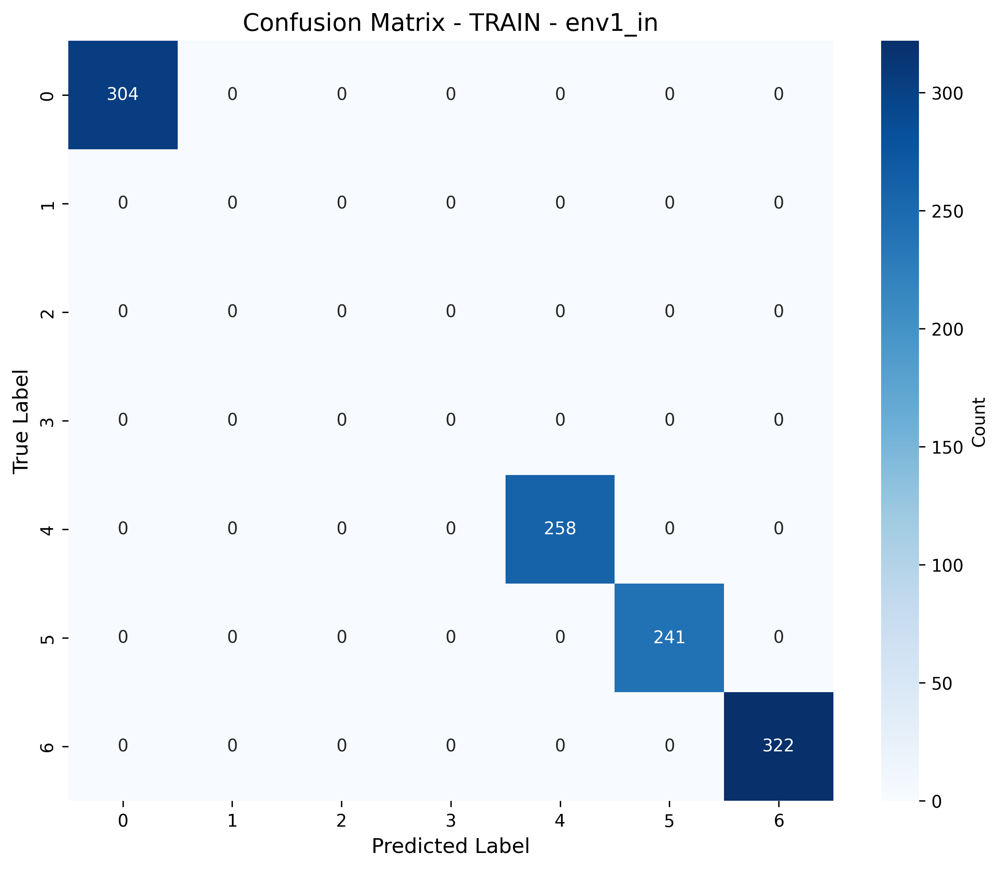


confusion_matrix_TRAIN_env2_in.png


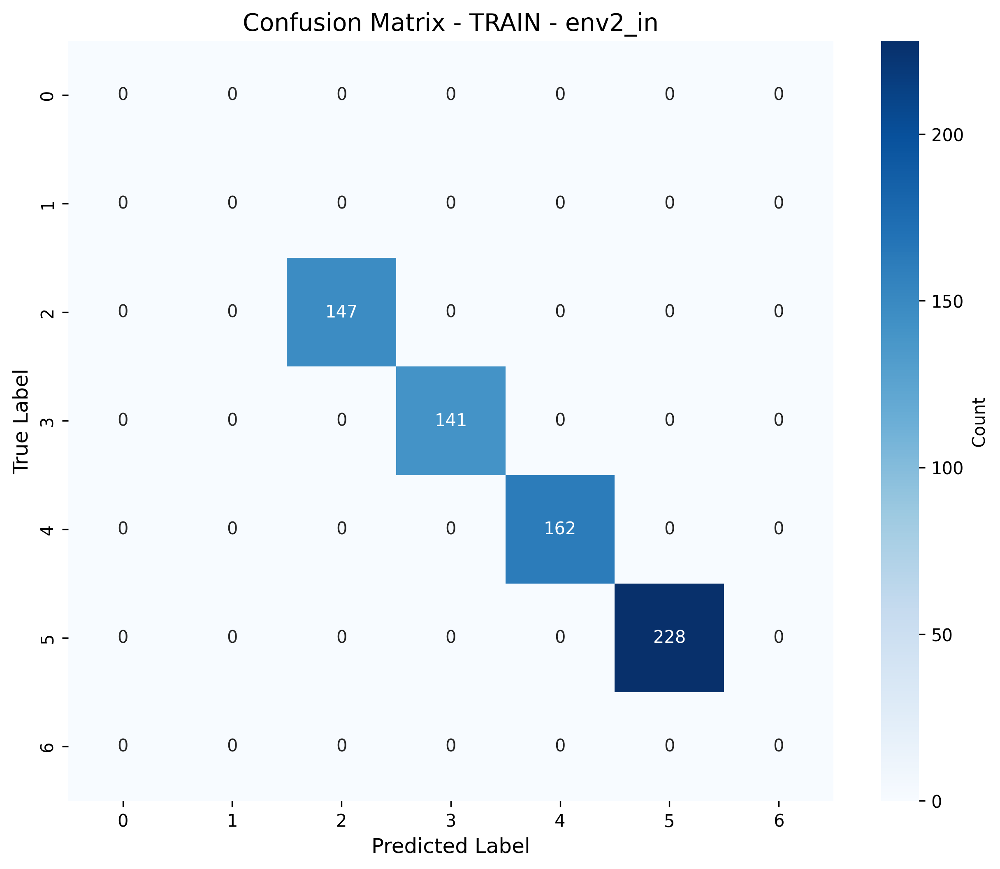


confusion_matrix_TRAIN_env3_in.png


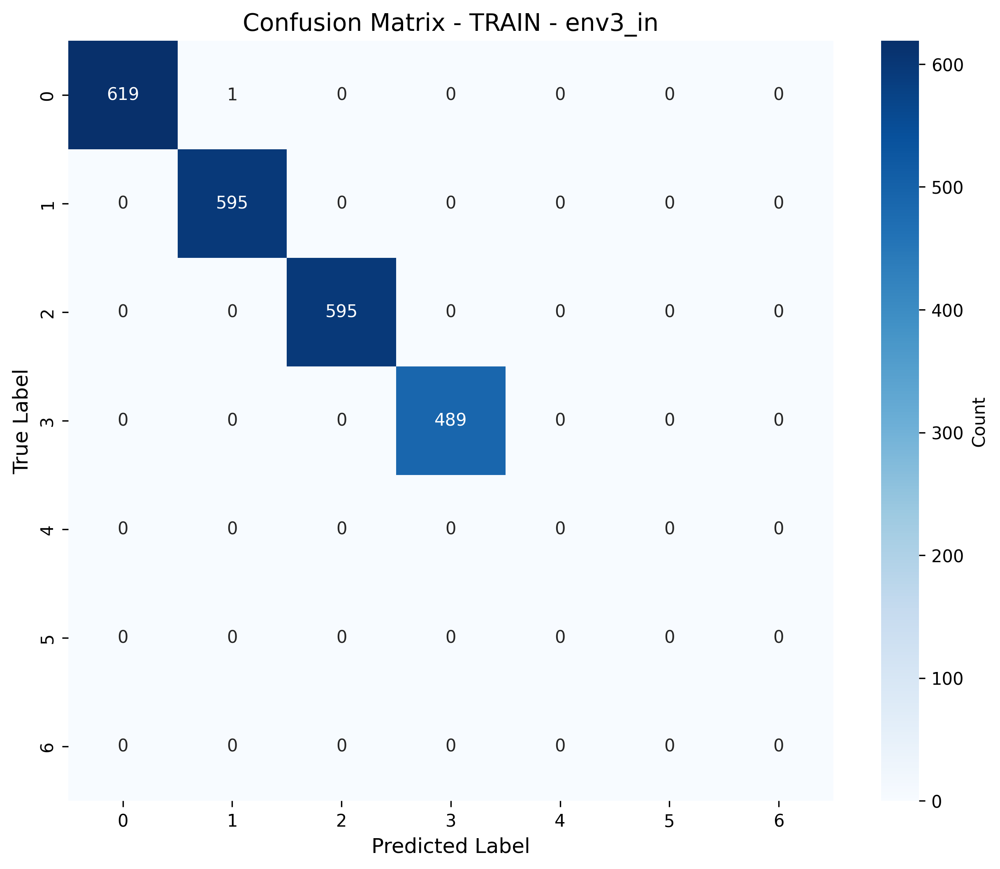


confusion_matrix_VAL_env1_out.png


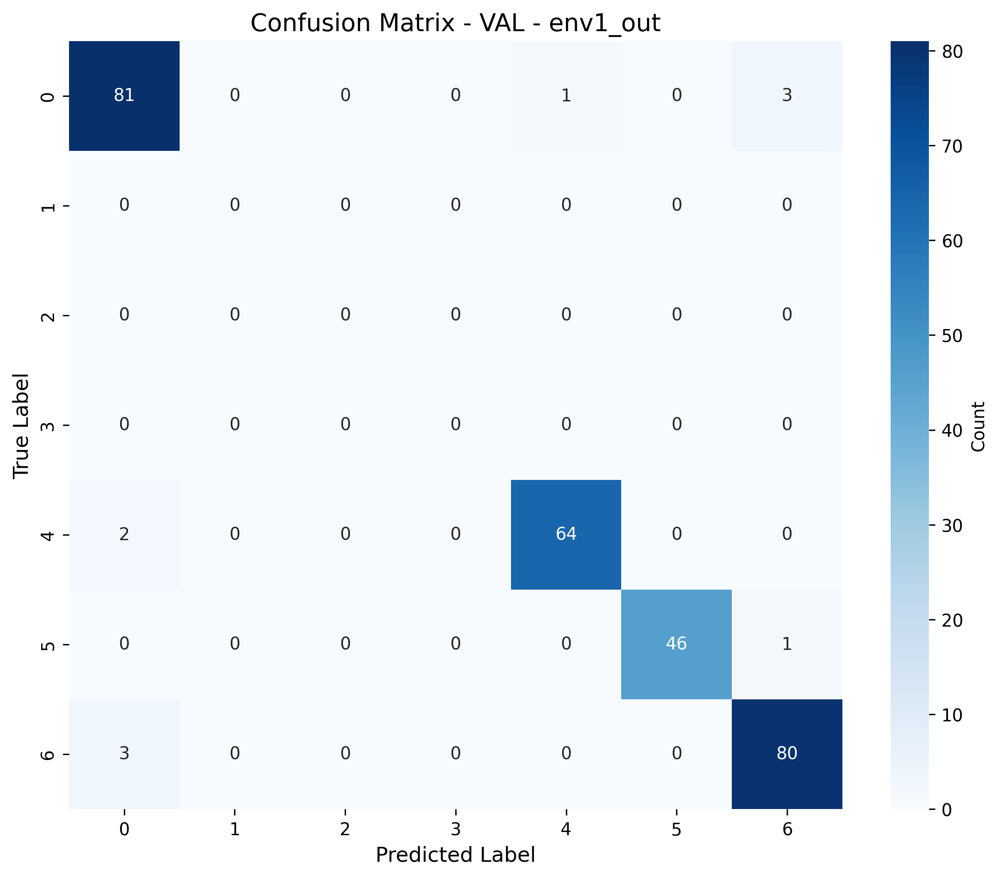


confusion_matrix_VAL_env2_out.png


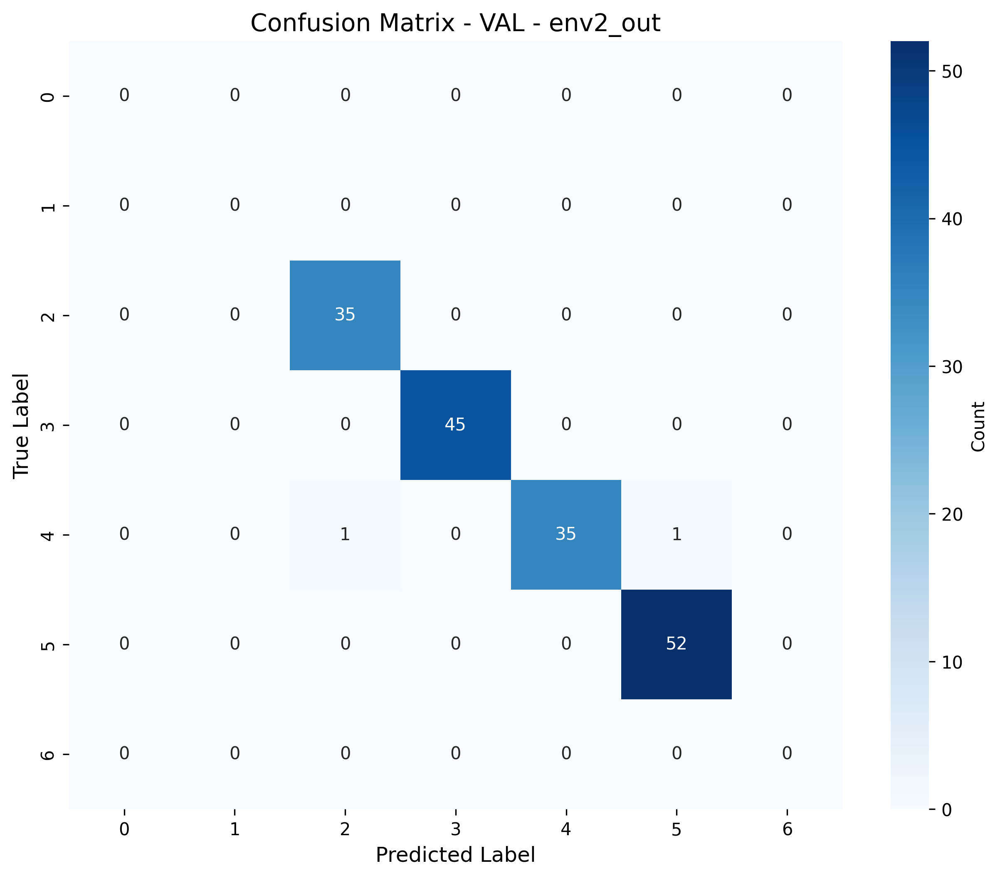


confusion_matrix_VAL_env3_out.png


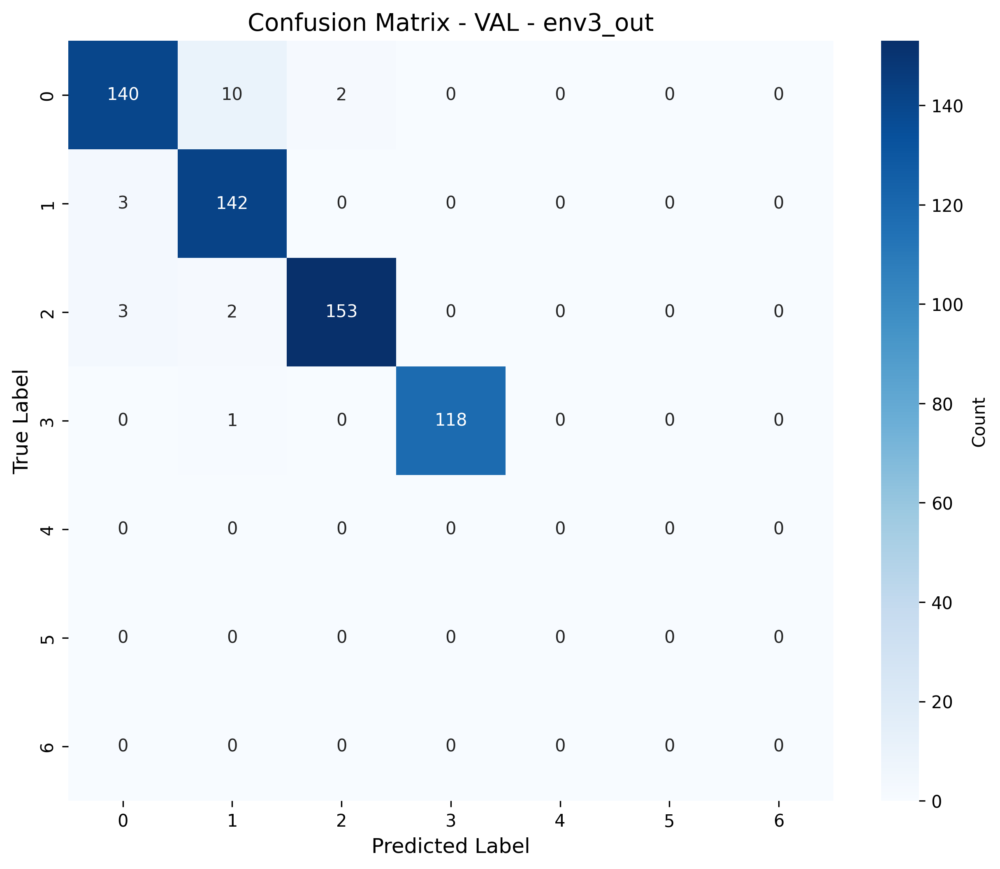



TRAINING CURVES:


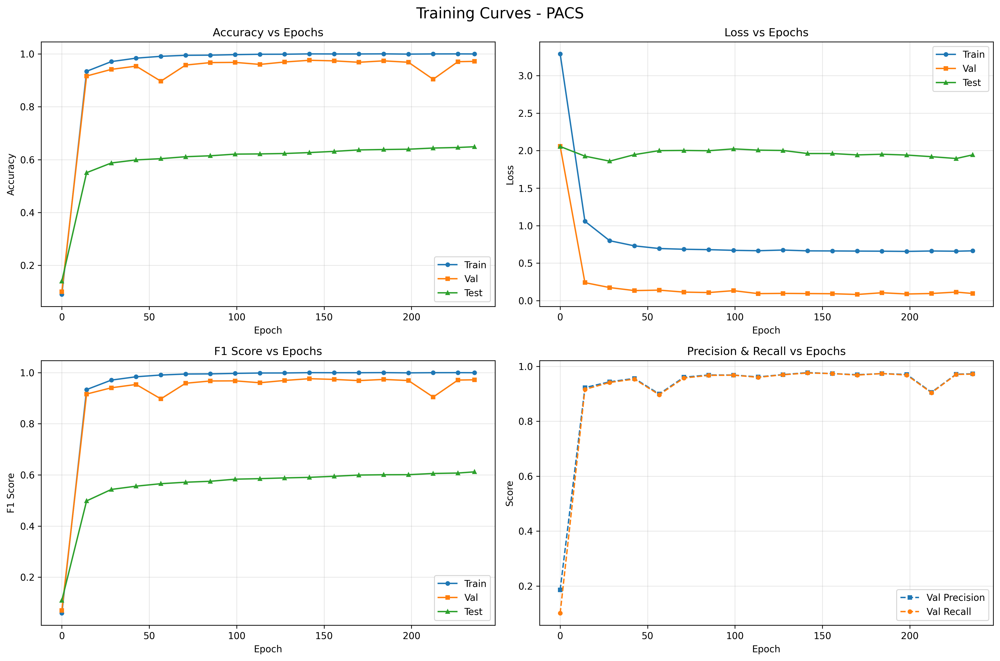

In [27]:


fit_simple(
exp_dir=str(exp_dir),
logger=logger,
seed=config.get("seed", 0),
trial_seed=config.get("trial_seed", 0),
hparams_seed=config.get("hparams_seed", 0),
algorithm_name=config["algo"],
dataset_name=dataset_name_pacs,
data_dir=config["data_dir"][dataset_name_pacs],
num_workers=config.get("num_workers", 4),
test_envs=[config["test_set_id"]],
overlap_type=config.get("overlap", "none"),
holdout_fraction=config.get("holdout_fraction", 0.2),
n_steps=config.get("n_epochs"),  # Changed to epochs!
checkpoint_freq=config.get("checkpoint_freq"),  # In epochs
model_checkpoint=config.get("model_checkpoint", {
    "metric": "val/acc",
    "maximize": True
}),
num_domain_linked_classes=config.get("num_domain_linked_classes"),
num_classes=config.get("num_classes"),
# AutoAugmentation specific
auto_augment=config.get("auto_augment", False),
augment_search_epochs=config.get("augment_search_epochs", 10),
)

logging.info(f"Experiment complete. Results saved to {exp_dir}")
print(f"\n✓ Experiment complete!")
print(f"  Results: {exp_dir / 'metrics_pacs.csv'}")
print(f"  Best model: {exp_dir / 'best_model_pacs.ckpt'}")
print(f"  Config: {exp_dir / 'config_pacs.json'}")


import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import display, Image
import os

log_dir = f"/kaggle/working/experiments/{exp_name_pacs}/logs"

# Get all confusion matrix plot files
cm_files = [f for f in os.listdir(log_dir) if f.startswith('confusion_matrix_') and f.endswith('.png')]

# Display all confusion matrices
print("CONFUSION MATRICES:")
print("="*60)
for cm_file in sorted(cm_files):
    print(f"\n{cm_file}")
    display(Image(filename=os.path.join(log_dir, cm_file)))

# Display training curves
print("\n\nTRAINING CURVES:")
print("="*60)
display(Image(filename=os.path.join(log_dir, 'training_curves_PACS.png')))

# # Display epoch times
# print("\n\nEPOCH TIMES:")
# print("="*60)
# display(Image(filename=os.path.join(log_dir, 'epoch_times_PACS.png')))


## VLCS

In [28]:
output_dir = "/kaggle/working/experiments"
if not os.path.exists(output_dir):
    os.mkdir(output_dir)
exp_name_vlcs = input()
config["name"] = exp_name_vlcs

exp_name_vlcs = config["name"] or f"{config['algo']}_{config['dataset']}_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
exp_dir = Path(output_dir) / exp_name_vlcs
exp_dir.mkdir(parents=True, exist_ok=True)
log_dir = exp_dir / 'logs'
log_dir.mkdir(parents=True, exist_ok=True)
# Setup logging
config_logging()
logging.info(f"Starting experiment: {exp_name_vlcs}")
logging.info(f"Output directory: {exp_dir}")

# Save config to experiment directory
with open(exp_dir / "config.json", "w") as f:
    json.dump(config, f, indent=2)


logger = CSVLogger(log_dir / 'metrics.csv',  root_dir=log_dir)## VLCS

 third_experiment


In [29]:
dataset_name_vlcs = config["dataset"][1]
dataset_name_vlcs

'VLCS'

Seed set to 0


num_envs=4, num_filters=3, domain_class_filter=[[0, 1, 2], [2, 3, 4], [3, 4, 0]]


  0%|          | 0/5001 [01:56<?, ?it/s]


=== Step 0 (Epoch 0.00) ===
TRAIN: loss: 3.0551 | acc: 0.0835 | precision: 0.1770 | recall: 0.0835 | recall: 0.0835 | f1: 0.0762 | oacc: 0.0302 | nacc: 0.2969
VAL: loss: 1.8642 | acc: 0.0708 | precision: 0.0776 | recall: 0.0708 | recall: 0.0708 | f1: 0.0606 | oacc: 0.0184 | nacc: 0.2803
TEST: loss: 2.1722 | acc: 0.2601 | precision: 0.0984 | recall: 0.2601 | recall: 0.2601 | f1: 0.0999 | oacc: 0.0776 | nacc: 0.9902
OTHER: loss: 2.1815 | acc: 0.2471 | precision: 0.1299 | recall: 0.2471 | recall: 0.2471 | f1: 0.0956 | oacc: 0.0588 | nacc: 1.0000


  6%|▌         | 300/5001 [08:48<1:10:52,  1.11it/s] 


=== Step 300 (Epoch 8.82) ===
TRAIN: loss: 1.4875 | acc: 0.4475 | precision: 0.5490 | recall: 0.4475 | recall: 0.4475 | f1: 0.4687 | oacc: 0.4380 | nacc: 0.2663
VAL: loss: 0.5176 | acc: 0.4216 | precision: 0.4709 | recall: 0.4216 | recall: 0.4216 | f1: 0.4438 | oacc: 0.4148 | nacc: 0.2449
TEST: loss: 0.8991 | acc: 0.6248 | precision: 0.5526 | recall: 0.6248 | recall: 0.6248 | f1: 0.5580 | oacc: 0.5898 | nacc: 0.7647
OTHER: loss: 0.9201 | acc: 0.6028 | precision: 0.5372 | recall: 0.6028 | recall: 0.6028 | f1: 0.5416 | oacc: 0.5868 | nacc: 0.6667


 12%|█▏        | 600/5001 [15:37<1:39:45,  1.36s/it] 


=== Step 600 (Epoch 17.65) ===
TRAIN: loss: 1.2919 | acc: 0.4876 | precision: 0.6258 | recall: 0.4876 | recall: 0.4876 | f1: 0.5168 | oacc: 0.4798 | nacc: 0.2881
VAL: loss: 0.4698 | acc: 0.4412 | precision: 0.5430 | recall: 0.4412 | recall: 0.4412 | f1: 0.4658 | oacc: 0.4327 | nacc: 0.2626
TEST: loss: 0.9255 | acc: 0.5082 | precision: 0.7153 | recall: 0.5082 | recall: 0.5082 | f1: 0.4539 | oacc: 0.5667 | nacc: 0.2745
OTHER: loss: 0.9352 | acc: 0.5603 | precision: 0.7191 | recall: 0.5603 | recall: 0.5603 | f1: 0.5188 | oacc: 0.6289 | nacc: 0.2857


 18%|█▊        | 900/5001 [22:21<1:05:35,  1.04it/s] 


=== Step 900 (Epoch 26.47) ===
TRAIN: loss: 1.1567 | acc: 0.5090 | precision: 0.6305 | recall: 0.5090 | recall: 0.5090 | f1: 0.5366 | oacc: 0.5009 | nacc: 0.3034
VAL: loss: 0.4415 | acc: 0.4486 | precision: 0.5437 | recall: 0.4486 | recall: 0.4486 | f1: 0.4767 | oacc: 0.4405 | nacc: 0.2677
TEST: loss: 0.9755 | acc: 0.5063 | precision: 0.6901 | recall: 0.5063 | recall: 0.5063 | f1: 0.4584 | oacc: 0.5961 | nacc: 0.1471
OTHER: loss: 0.9821 | acc: 0.5368 | precision: 0.6848 | recall: 0.5368 | recall: 0.5368 | f1: 0.4904 | oacc: 0.6353 | nacc: 0.1429


 24%|██▍       | 1200/5001 [29:12<54:55,  1.15it/s]  


=== Step 1200 (Epoch 35.29) ===
TRAIN: loss: 1.0671 | acc: 0.5270 | precision: 0.6355 | recall: 0.5270 | recall: 0.5270 | f1: 0.5543 | oacc: 0.5191 | nacc: 0.3157
VAL: loss: 0.4306 | acc: 0.4520 | precision: 0.5438 | recall: 0.4520 | recall: 0.4520 | f1: 0.4834 | oacc: 0.4471 | nacc: 0.2601
TEST: loss: 1.0831 | acc: 0.4923 | precision: 0.5743 | recall: 0.4923 | recall: 0.4923 | f1: 0.4372 | oacc: 0.6007 | nacc: 0.0588
OTHER: loss: 1.0896 | acc: 0.5233 | precision: 0.5736 | recall: 0.5233 | recall: 0.5233 | f1: 0.4613 | oacc: 0.6422 | nacc: 0.0476


 30%|███       | 1501/5001 [36:03<31:29:03, 32.38s/it]


=== Step 1500 (Epoch 44.12) ===
TRAIN: loss: 0.9853 | acc: 0.5339 | precision: 0.6392 | recall: 0.5339 | recall: 0.5339 | f1: 0.5598 | oacc: 0.5253 | nacc: 0.3233
VAL: loss: 0.4199 | acc: 0.4504 | precision: 0.5454 | recall: 0.4504 | recall: 0.4504 | f1: 0.4785 | oacc: 0.4404 | nacc: 0.2753
TEST: loss: 1.2310 | acc: 0.5136 | precision: 0.5409 | recall: 0.5136 | recall: 0.5136 | f1: 0.4485 | oacc: 0.6273 | nacc: 0.0588
OTHER: loss: 1.2326 | acc: 0.5327 | precision: 0.5460 | recall: 0.5327 | recall: 0.5327 | f1: 0.4600 | oacc: 0.6540 | nacc: 0.0476


 36%|███▌      | 1801/5001 [42:52<28:48:58, 32.42s/it]


=== Step 1800 (Epoch 52.94) ===
TRAIN: loss: 0.9486 | acc: 0.5860 | precision: 0.6909 | recall: 0.5860 | recall: 0.5860 | f1: 0.6150 | oacc: 0.5422 | nacc: 0.3275
VAL: loss: 0.4520 | acc: 0.4521 | precision: 0.5456 | recall: 0.4521 | recall: 0.4521 | f1: 0.4793 | oacc: 0.4451 | nacc: 0.2652
TEST: loss: 1.3675 | acc: 0.5089 | precision: 0.5121 | recall: 0.5089 | recall: 0.5089 | f1: 0.4348 | oacc: 0.6239 | nacc: 0.0490
OTHER: loss: 1.3676 | acc: 0.5159 | precision: 0.5097 | recall: 0.5159 | recall: 0.5159 | f1: 0.4276 | oacc: 0.6449 | nacc: 0.0000


 42%|████▏     | 2100/5001 [49:42<56:36,  1.17s/it]   


=== Step 2100 (Epoch 61.76) ===
TRAIN: loss: 0.9120 | acc: 0.5888 | precision: 0.6925 | recall: 0.5888 | recall: 0.5888 | f1: 0.6184 | oacc: 0.5440 | nacc: 0.3316
VAL: loss: 0.4534 | acc: 0.4625 | precision: 0.6196 | recall: 0.4625 | recall: 0.4625 | f1: 0.4984 | oacc: 0.4550 | nacc: 0.2778
TEST: loss: 1.4826 | acc: 0.5060 | precision: 0.5021 | recall: 0.5060 | recall: 0.5060 | f1: 0.4302 | oacc: 0.6227 | nacc: 0.0392
OTHER: loss: 1.5082 | acc: 0.5092 | precision: 0.4972 | recall: 0.5092 | recall: 0.5092 | f1: 0.4181 | oacc: 0.6364 | nacc: 0.0000


 48%|████▊     | 2401/5001 [56:21<22:39:57, 31.38s/it]


=== Step 2400 (Epoch 70.59) ===
TRAIN: loss: 0.8879 | acc: 0.5723 | precision: 0.6458 | recall: 0.5723 | recall: 0.5723 | f1: 0.5964 | oacc: 0.5698 | nacc: 0.3333
VAL: loss: 0.4517 | acc: 0.4636 | precision: 0.6116 | recall: 0.4636 | recall: 0.4636 | f1: 0.4957 | oacc: 0.4548 | nacc: 0.2803
TEST: loss: 1.6071 | acc: 0.5074 | precision: 0.4967 | recall: 0.5074 | recall: 0.5074 | f1: 0.4296 | oacc: 0.6220 | nacc: 0.0490
OTHER: loss: 1.6370 | acc: 0.5153 | precision: 0.4857 | recall: 0.5153 | recall: 0.5153 | f1: 0.4187 | oacc: 0.6441 | nacc: 0.0000


 54%|█████▍    | 2700/5001 [1:03:01<48:57,  1.28s/it] 


=== Step 2700 (Epoch 79.41) ===
TRAIN: loss: 0.8800 | acc: 0.6773 | precision: 0.7461 | recall: 0.6773 | recall: 0.6773 | f1: 0.7040 | oacc: 0.5941 | nacc: 0.3327
VAL: loss: 0.4541 | acc: 0.4919 | precision: 0.6556 | recall: 0.4919 | recall: 0.4919 | f1: 0.5262 | oacc: 0.4561 | nacc: 0.2727
TEST: loss: 1.7268 | acc: 0.4998 | precision: 0.4781 | recall: 0.4998 | recall: 0.4998 | f1: 0.4207 | oacc: 0.6149 | nacc: 0.0392
OTHER: loss: 1.7702 | acc: 0.5074 | precision: 0.4621 | recall: 0.5074 | recall: 0.5074 | f1: 0.4064 | oacc: 0.6343 | nacc: 0.0000


 60%|██████    | 3001/5001 [1:09:40<17:19:19, 31.18s/it]


=== Step 3000 (Epoch 88.24) ===
TRAIN: loss: 0.8583 | acc: 0.6414 | precision: 0.6928 | recall: 0.6414 | recall: 0.6414 | f1: 0.6615 | oacc: 0.6028 | nacc: 0.3327
VAL: loss: 0.5166 | acc: 0.4582 | precision: 0.5442 | recall: 0.4582 | recall: 0.4582 | f1: 0.4870 | oacc: 0.4522 | nacc: 0.2677
TEST: loss: 1.8605 | acc: 0.4959 | precision: 0.4660 | recall: 0.4959 | recall: 0.4959 | f1: 0.4116 | oacc: 0.6100 | nacc: 0.0392
OTHER: loss: 1.8979 | acc: 0.5052 | precision: 0.4538 | recall: 0.5052 | recall: 0.5052 | f1: 0.4029 | oacc: 0.6315 | nacc: 0.0000


 66%|██████▌   | 3301/5001 [1:16:15<14:56:17, 31.63s/it]


=== Step 3300 (Epoch 97.06) ===
TRAIN: loss: 0.8536 | acc: 0.8527 | precision: 0.9132 | recall: 0.8527 | recall: 0.8527 | f1: 0.8788 | oacc: 0.6188 | nacc: 0.3327
VAL: loss: 0.4844 | acc: 0.4828 | precision: 0.5576 | recall: 0.4828 | recall: 0.4828 | f1: 0.5100 | oacc: 0.4450 | nacc: 0.2753
TEST: loss: 1.9845 | acc: 0.4930 | precision: 0.4549 | recall: 0.4930 | recall: 0.4930 | f1: 0.4062 | oacc: 0.6064 | nacc: 0.0392
OTHER: loss: 2.0350 | acc: 0.5202 | precision: 0.4516 | recall: 0.5202 | recall: 0.5202 | f1: 0.4121 | oacc: 0.6502 | nacc: 0.0000


 72%|███████▏  | 3601/5001 [1:22:50<12:02:17, 30.96s/it]


=== Step 3600 (Epoch 105.88) ===
TRAIN: loss: 0.8503 | acc: 0.9706 | precision: 0.9983 | recall: 0.9706 | recall: 0.9706 | f1: 0.9835 | oacc: 0.6447 | nacc: 0.3333
VAL: loss: 0.5036 | acc: 0.4541 | precision: 0.5446 | recall: 0.4541 | recall: 0.4541 | f1: 0.4802 | oacc: 0.4454 | nacc: 0.2727
TEST: loss: 2.0945 | acc: 0.4911 | precision: 0.4504 | recall: 0.4911 | recall: 0.4911 | f1: 0.4037 | oacc: 0.6040 | nacc: 0.0392
OTHER: loss: 2.1476 | acc: 0.5202 | precision: 0.4516 | recall: 0.5202 | recall: 0.5202 | f1: 0.4121 | oacc: 0.6502 | nacc: 0.0000


 78%|███████▊  | 3901/5001 [1:29:30<9:27:04, 30.93s/it] 


=== Step 3900 (Epoch 114.71) ===
TRAIN: loss: 0.8446 | acc: 0.9716 | precision: 0.9983 | recall: 0.9716 | recall: 0.9716 | f1: 0.9840 | oacc: 0.6453 | nacc: 0.3333
VAL: loss: 0.4968 | acc: 0.4628 | precision: 0.5486 | recall: 0.4628 | recall: 0.4628 | f1: 0.4914 | oacc: 0.4556 | nacc: 0.2753
TEST: loss: 2.2279 | acc: 0.4958 | precision: 0.4432 | recall: 0.4958 | recall: 0.4958 | f1: 0.4013 | oacc: 0.6099 | nacc: 0.0392
OTHER: loss: 2.2927 | acc: 0.5179 | precision: 0.4369 | recall: 0.5179 | recall: 0.5179 | f1: 0.4058 | oacc: 0.6474 | nacc: 0.0000


 84%|████████▍ | 4201/5001 [1:36:05<6:56:12, 31.22s/it]


=== Step 4200 (Epoch 123.53) ===
TRAIN: loss: 0.8437 | acc: 0.9046 | precision: 0.9160 | recall: 0.9046 | recall: 0.9046 | f1: 0.9101 | oacc: 0.6555 | nacc: 0.3333
VAL: loss: 0.5842 | acc: 0.4608 | precision: 0.5483 | recall: 0.4608 | recall: 0.4608 | f1: 0.4904 | oacc: 0.4533 | nacc: 0.2727
TEST: loss: 2.3328 | acc: 0.4956 | precision: 0.4428 | recall: 0.4956 | recall: 0.4956 | f1: 0.4026 | oacc: 0.6098 | nacc: 0.0392
OTHER: loss: 2.4034 | acc: 0.5223 | precision: 0.4380 | recall: 0.5223 | recall: 0.5223 | f1: 0.4081 | oacc: 0.6528 | nacc: 0.0000


 90%|█████████ | 4501/5001 [1:42:44<4:19:37, 31.16s/it]


=== Step 4500 (Epoch 132.35) ===
TRAIN: loss: 0.8411 | acc: 0.8499 | precision: 0.8658 | recall: 0.8499 | recall: 0.8499 | f1: 0.8574 | oacc: 0.6522 | nacc: 0.3333
VAL: loss: 0.5301 | acc: 0.4611 | precision: 0.5483 | recall: 0.4611 | recall: 0.4611 | f1: 0.4905 | oacc: 0.4548 | nacc: 0.2702
TEST: loss: 2.3911 | acc: 0.4967 | precision: 0.4413 | recall: 0.4967 | recall: 0.4967 | f1: 0.4032 | oacc: 0.6087 | nacc: 0.0490
OTHER: loss: 2.4673 | acc: 0.5223 | precision: 0.4380 | recall: 0.5223 | recall: 0.5223 | f1: 0.4081 | oacc: 0.6528 | nacc: 0.0000


 96%|█████████▌| 4801/5001 [1:49:21<1:43:06, 30.93s/it]


=== Step 4800 (Epoch 141.18) ===
TRAIN: loss: 0.8366 | acc: 0.9854 | precision: 0.9994 | recall: 0.9854 | recall: 0.9854 | f1: 0.9921 | oacc: 0.6557 | nacc: 0.3333
VAL: loss: 0.4991 | acc: 0.4498 | precision: 0.5493 | recall: 0.4498 | recall: 0.4498 | f1: 0.4795 | oacc: 0.4402 | nacc: 0.2753
TEST: loss: 2.5001 | acc: 0.4965 | precision: 0.4411 | recall: 0.4965 | recall: 0.4965 | f1: 0.4028 | oacc: 0.6083 | nacc: 0.0490
OTHER: loss: 2.5851 | acc: 0.5116 | precision: 0.4301 | recall: 0.5116 | recall: 0.5116 | f1: 0.4037 | oacc: 0.6395 | nacc: 0.0000


100%|██████████| 5001/5001 [1:54:18<00:00,  1.37s/it]  



=== Step 5000 (Epoch 147.06) ===
TRAIN: loss: 0.8291 | acc: 0.9887 | precision: 0.9995 | recall: 0.9887 | recall: 0.9887 | f1: 0.9938 | oacc: 0.6582 | nacc: 0.3333
VAL: loss: 0.5659 | acc: 0.4580 | precision: 0.5455 | recall: 0.4580 | recall: 0.4580 | f1: 0.4875 | oacc: 0.4517 | nacc: 0.2702
TEST: loss: 2.5466 | acc: 0.5063 | precision: 0.4411 | recall: 0.5063 | recall: 0.5063 | f1: 0.4068 | oacc: 0.6207 | nacc: 0.0490
OTHER: loss: 2.6278 | acc: 0.5105 | precision: 0.4238 | recall: 0.5105 | recall: 0.5105 | f1: 0.4013 | oacc: 0.6381 | nacc: 0.0000
Saved final SWAD model to: /kaggle/working/experiments/third_experiment/logs/swad_final_model.ckpt

TRAINING COMPLETED
Total training time: 6858.86s (114.31 minutes)
Average time per epoch: 45.95s
Total epochs: 147


FINAL EVALUATION - CONFUSION MATRICES

TEST - env0_in:
  Loss: 2.5399
  Accuracy: 0.5063, Precision: 0.4411, Recall: 0.5063, F1: 0.4068
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TEST_env0

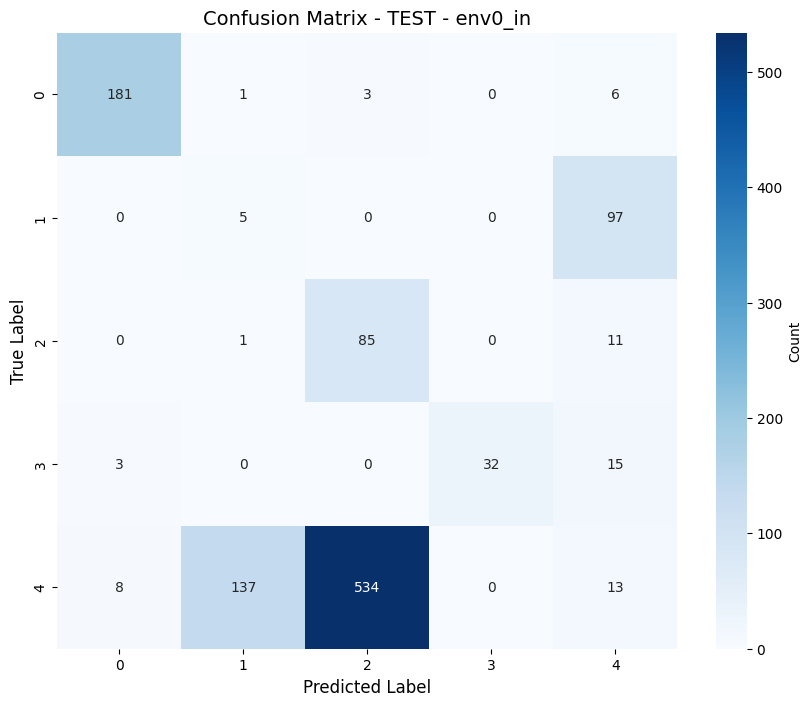


TRAIN - env1_in:
  Loss: 0.0094
  Accuracy: 0.7424, Precision: 0.7497, Recall: 0.7424, F1: 0.7460
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env1_in.png


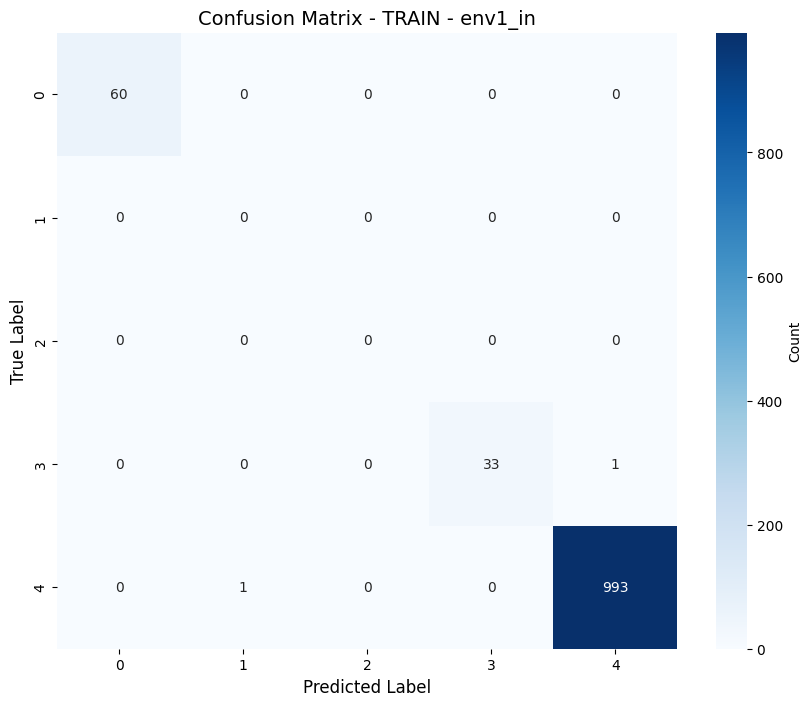


TRAIN - env2_in:
  Loss: 0.0133
  Accuracy: 0.9989, Precision: 0.9989, Recall: 0.9989, F1: 0.9989
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env2_in.png


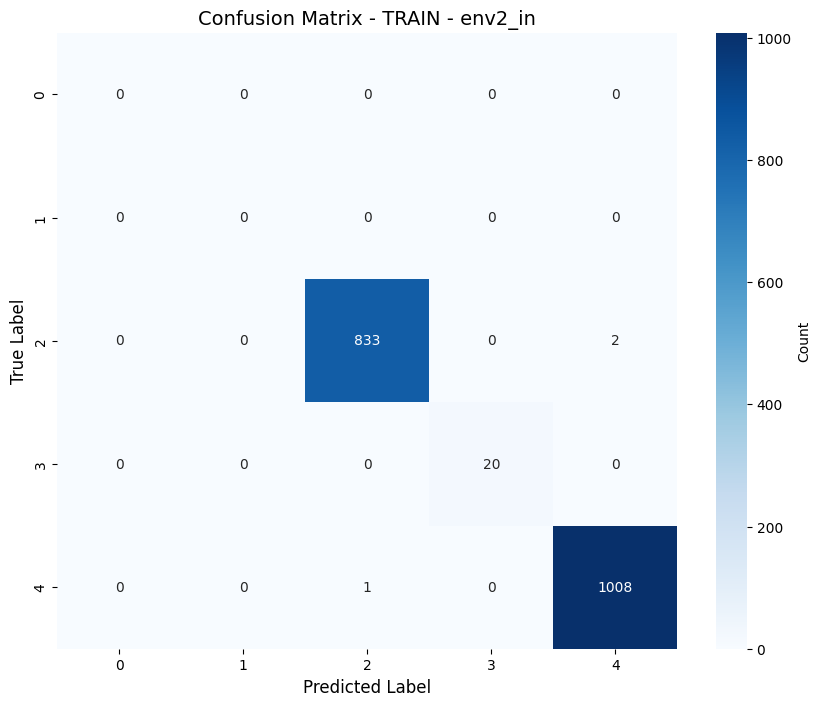


TRAIN - env3_in:
  Loss: 0.0038
  Accuracy: 0.7496, Precision: 0.7500, Recall: 0.7496, F1: 0.7498
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_TRAIN_env3_in.png


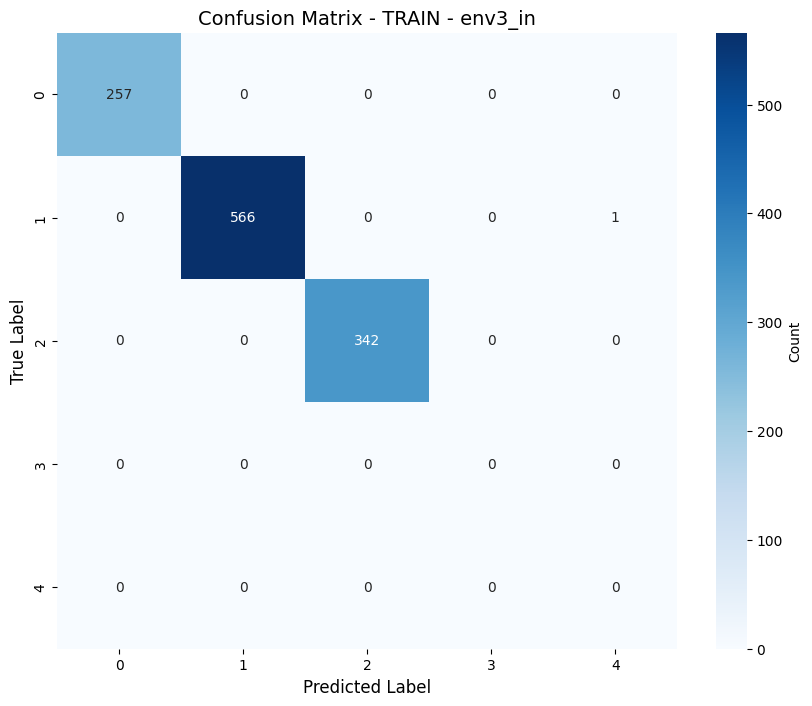


OTHER - env0_out:
  Loss: 2.6262
  Accuracy: 0.5105, Precision: 0.4238, Recall: 0.5105, F1: 0.4013
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_OTHER_env0_out.png


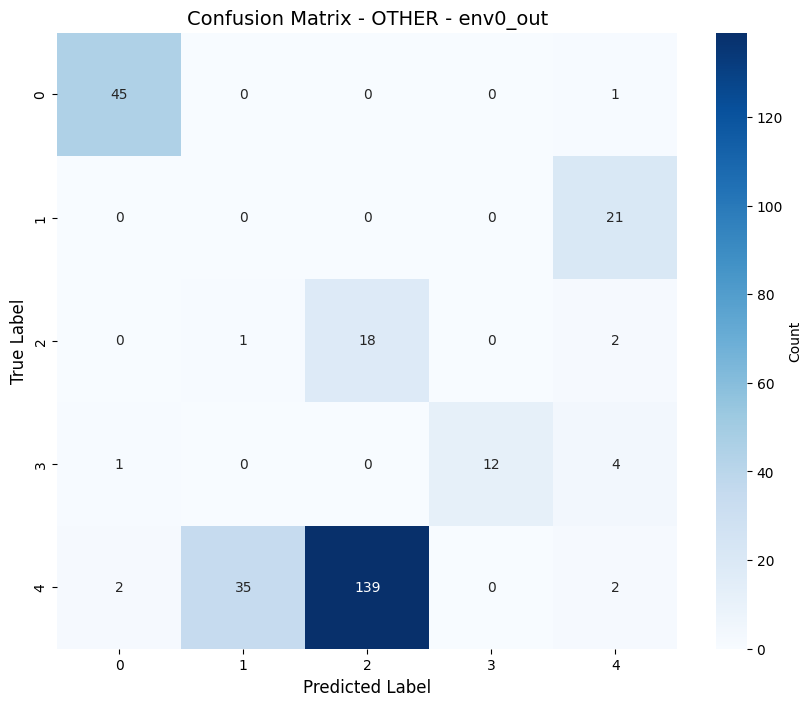


VAL - env1_out:
  Loss: 0.3865
  Accuracy: 0.3692, Precision: 0.5903, Recall: 0.3692, F1: 0.4081
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env1_out.png


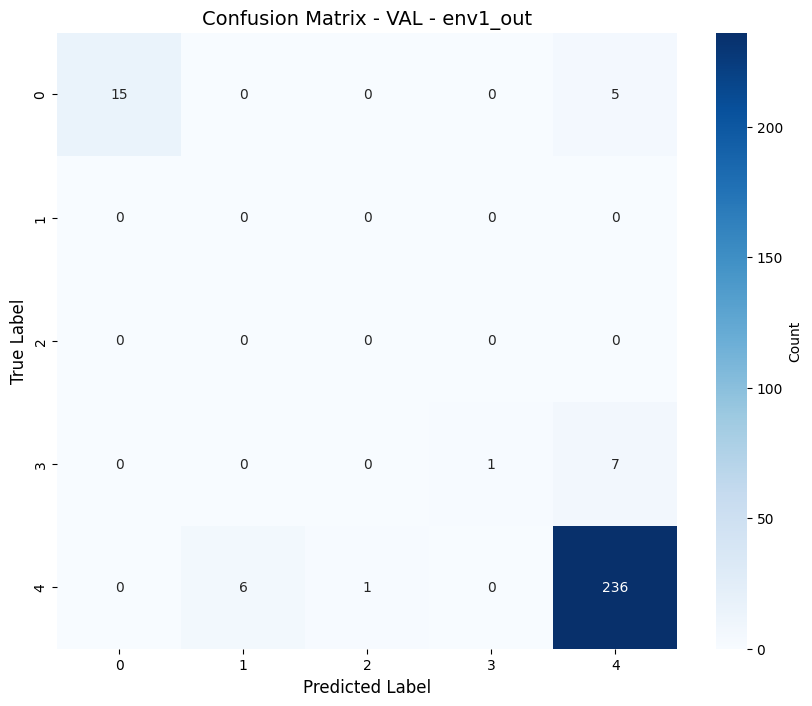


VAL - env2_out:
  Loss: 0.6769
  Accuracy: 0.3552, Precision: 0.5334, Recall: 0.3552, F1: 0.3706
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env2_out.png


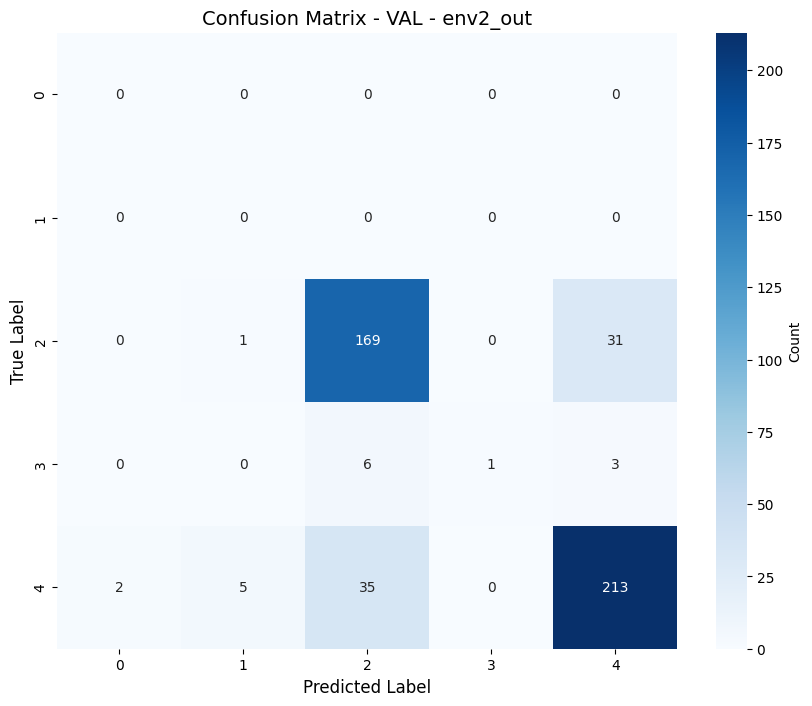


VAL - env3_out:
  Loss: 0.5311
  Accuracy: 0.6508, Precision: 0.7308, Recall: 0.6508, F1: 0.6883
  Saved CSV to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.csv
  Saved plot to: /kaggle/working/experiments/third_experiment/logs/confusion_matrix_VAL_env3_out.png


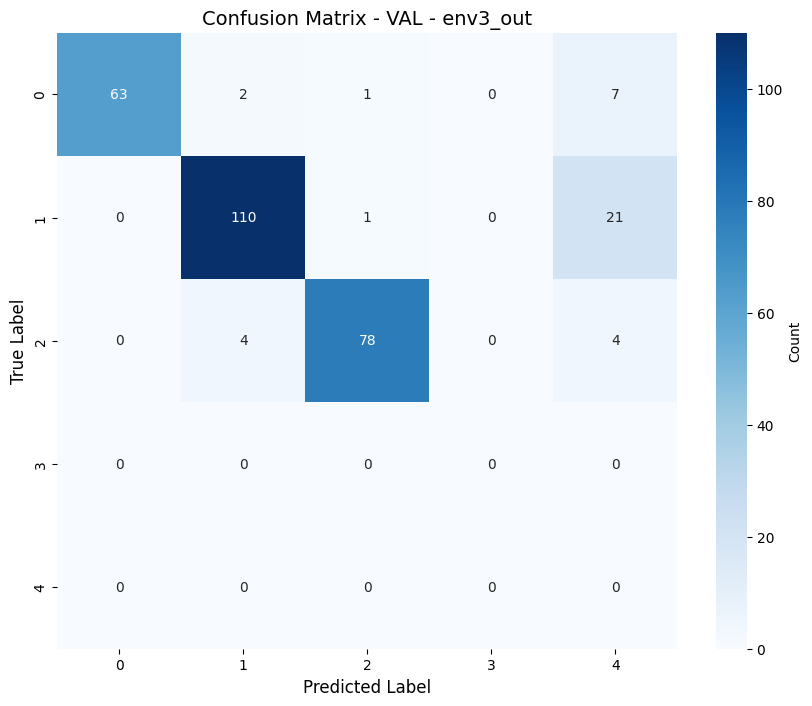


Training curves saved to: /kaggle/working/experiments/third_experiment/logs/training_curves_VLCS.png


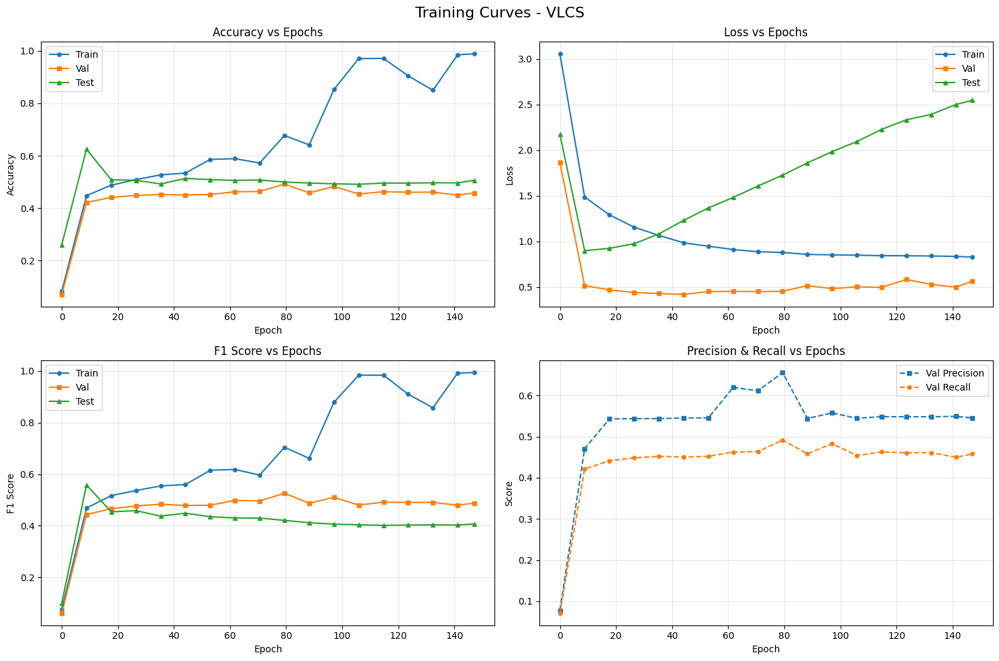

Epoch time plot saved to: /kaggle/working/experiments/third_experiment/logs/epoch_times_VLCS.png


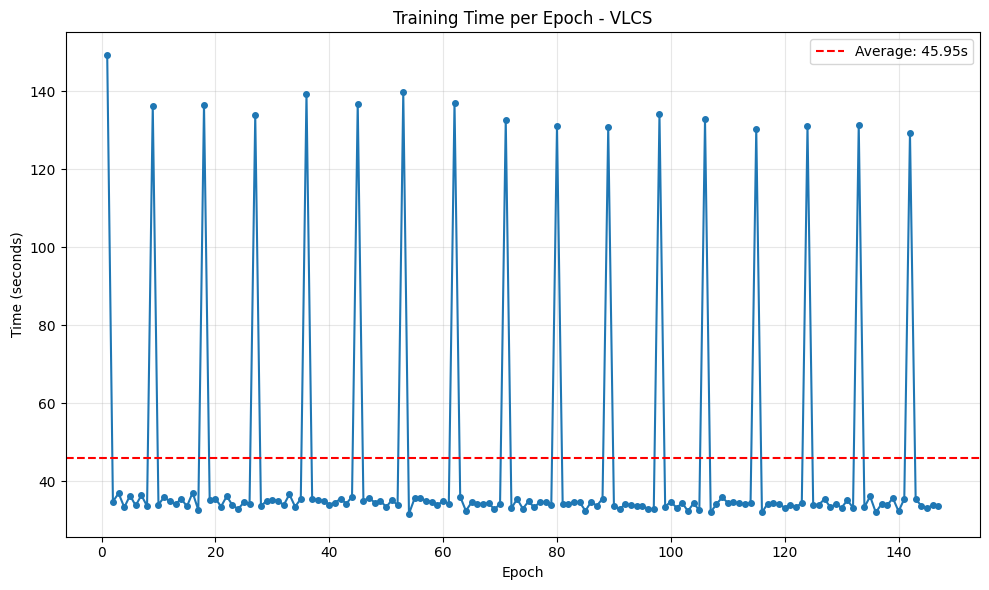


All results saved to: /kaggle/working/experiments/third_experiment/logs

Summary of saved files:
  - model_statistics.json
  - training_time_statistics.json
  - epoch_history.json
  - training_curves_VLCS.png
  - epoch_times_VLCS.png
  - confusion_matrix_*.csv (for all splits)
  - confusion_matrix_*.png (heatmaps for all splits)

✓ Experiment complete!
  Results: /kaggle/working/experiments/third_experiment/metrics_vlcs.csv
  Best model: /kaggle/working/experiments/third_experiment/best_model_vlcs.ckpt
  Config: /kaggle/working/experiments/third_experiment/config_vlcs.json
CONFUSION MATRICES:

confusion_matrix_OTHER_env0_out.png


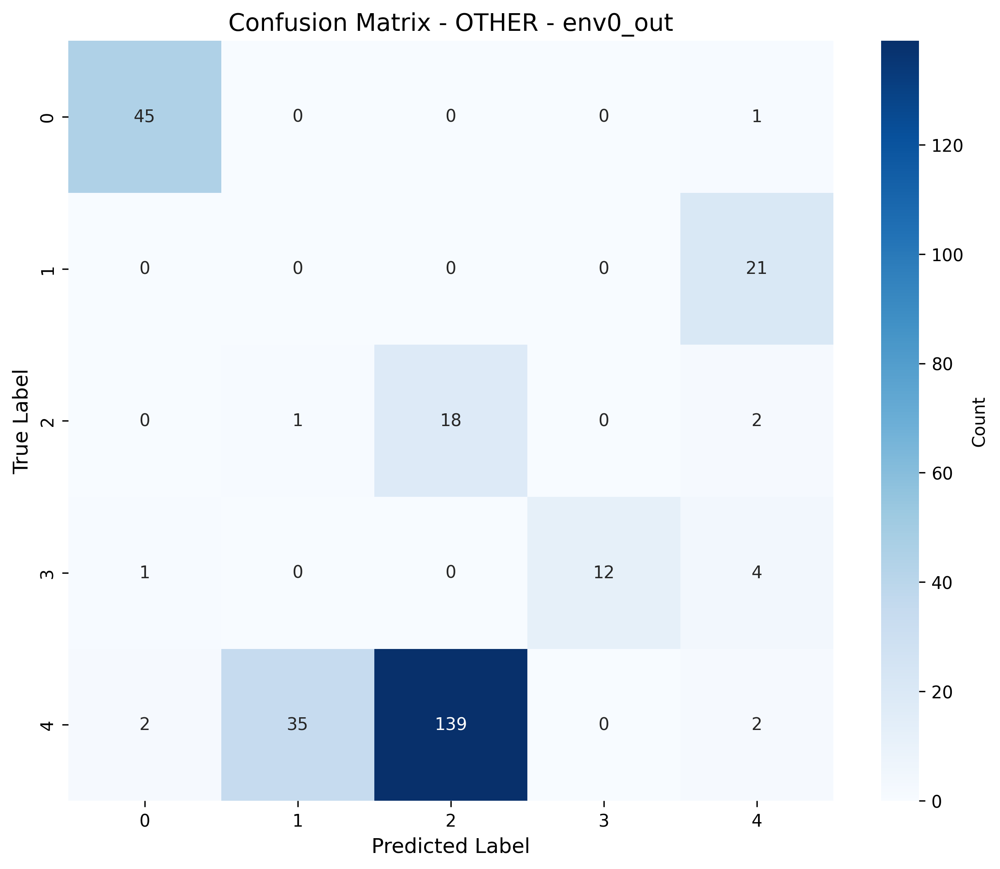


confusion_matrix_TEST_env0_in.png


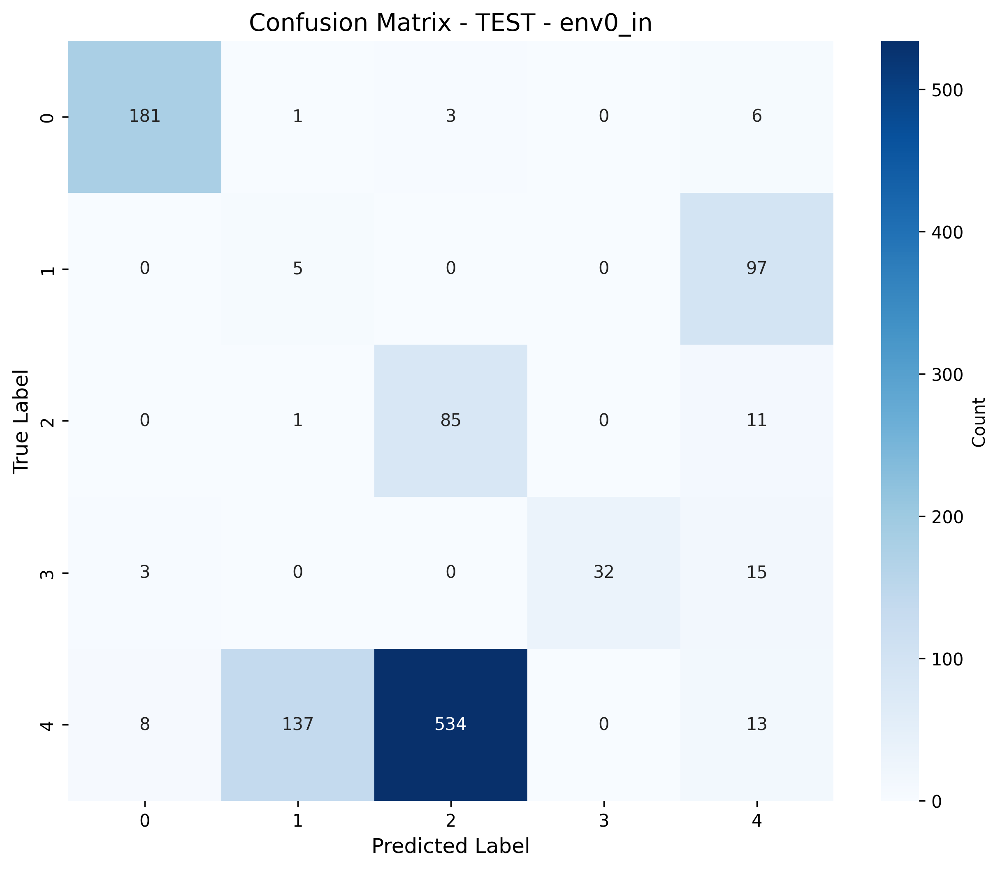


confusion_matrix_TRAIN_env1_in.png


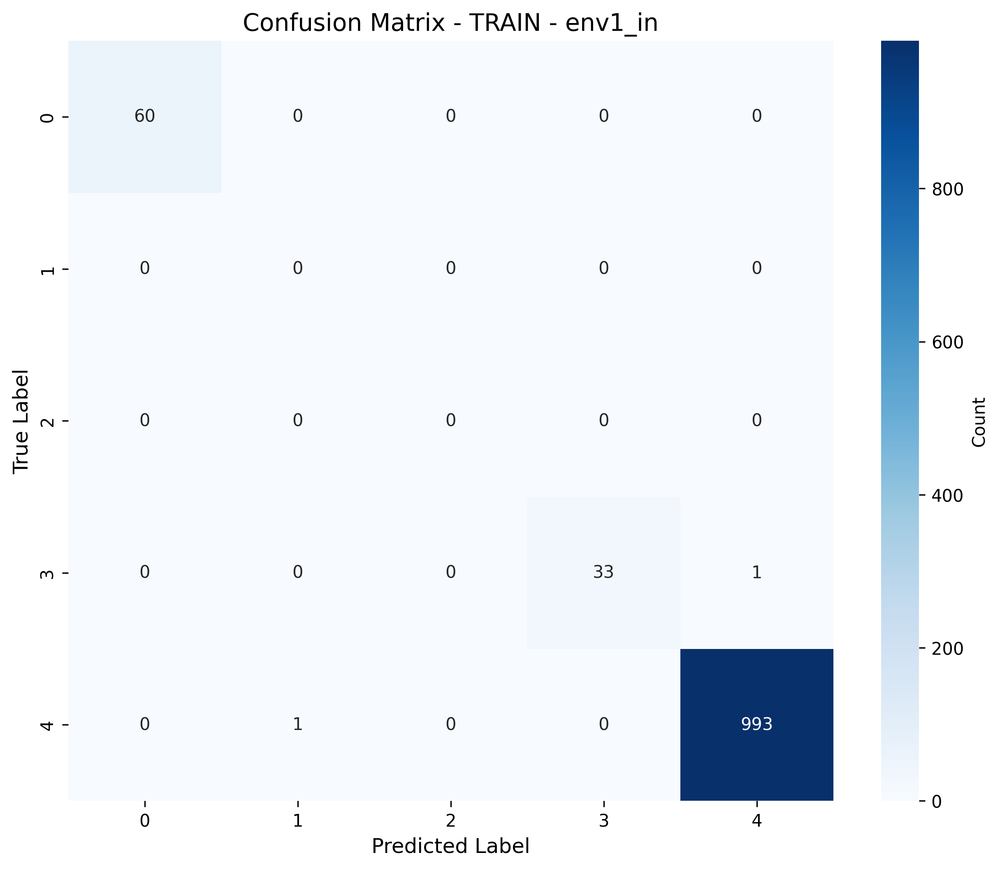


confusion_matrix_TRAIN_env2_in.png


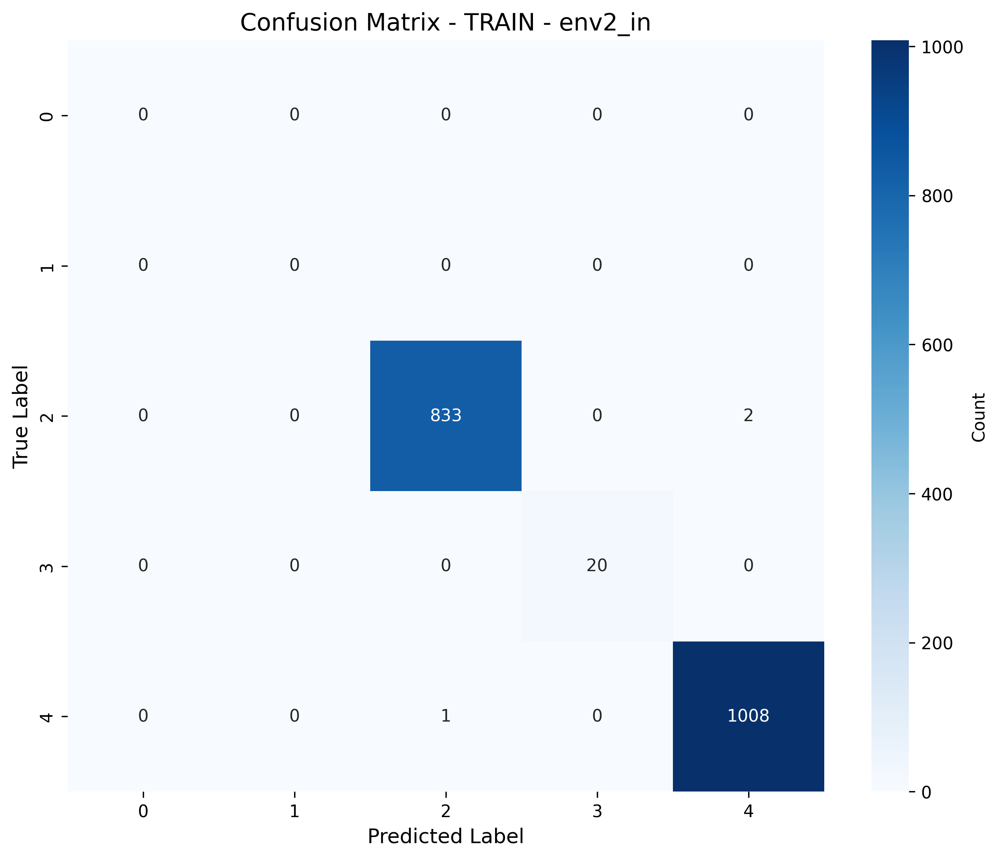


confusion_matrix_TRAIN_env3_in.png


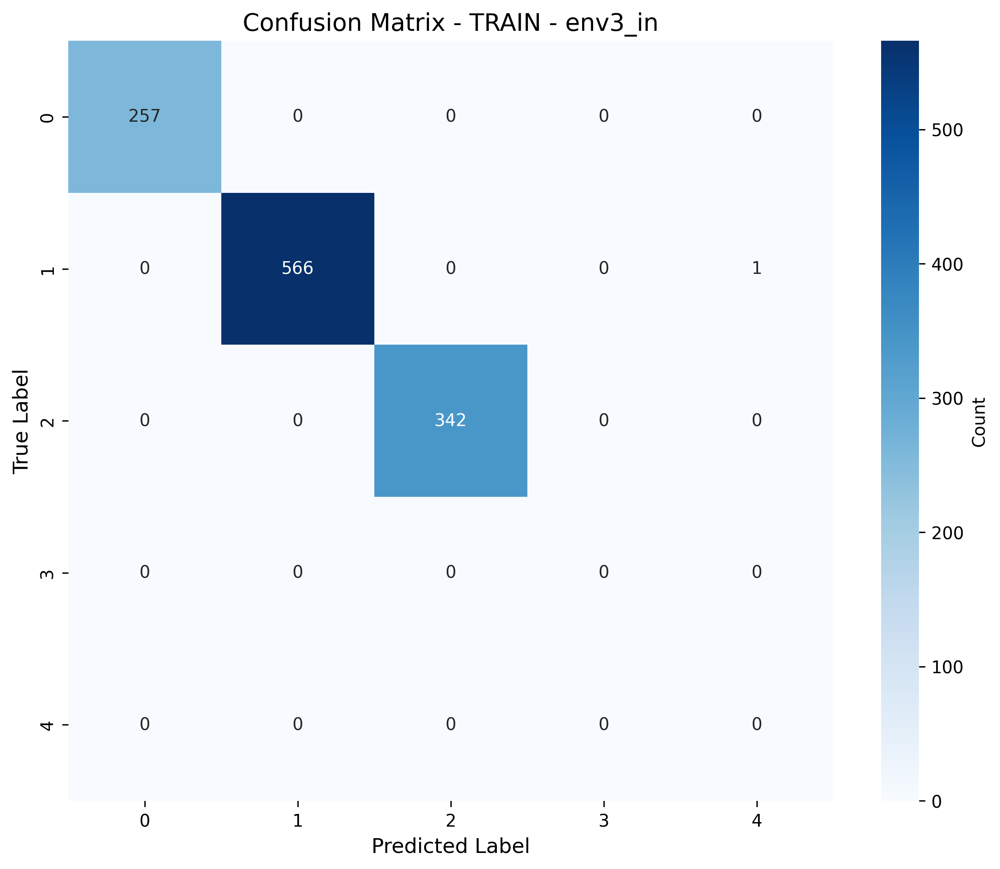


confusion_matrix_VAL_env1_out.png


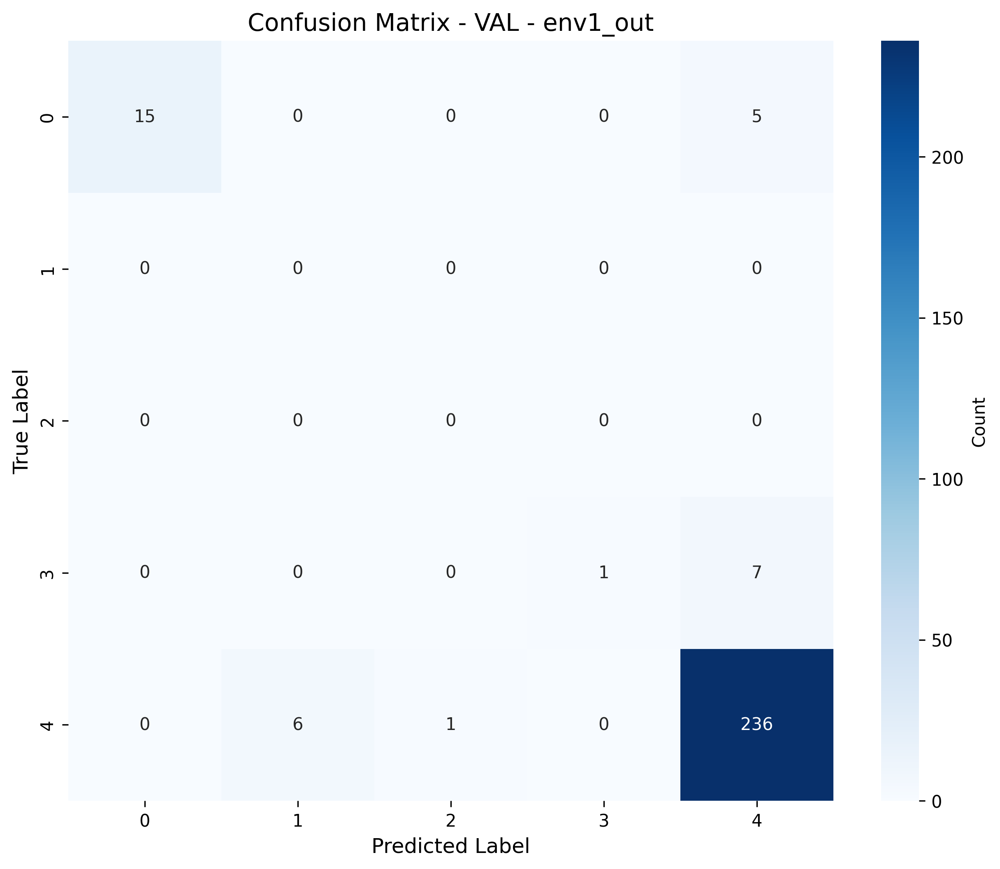


confusion_matrix_VAL_env2_out.png


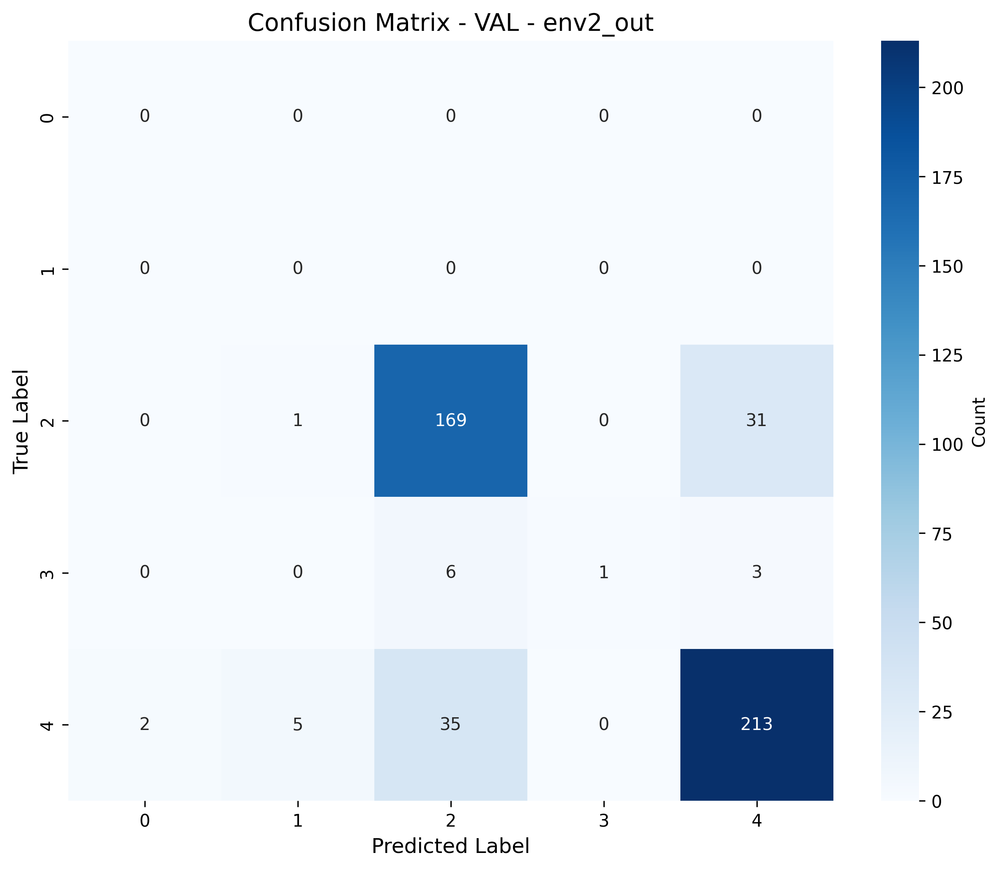


confusion_matrix_VAL_env3_out.png


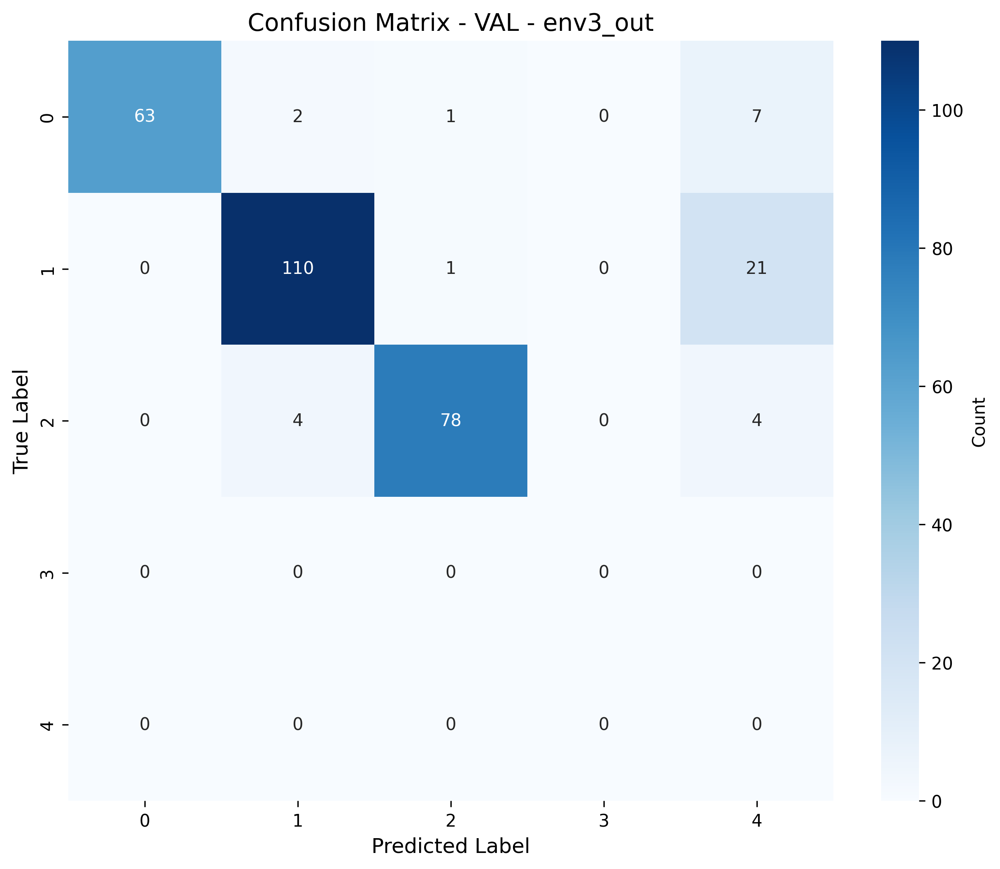



TRAINING CURVES:


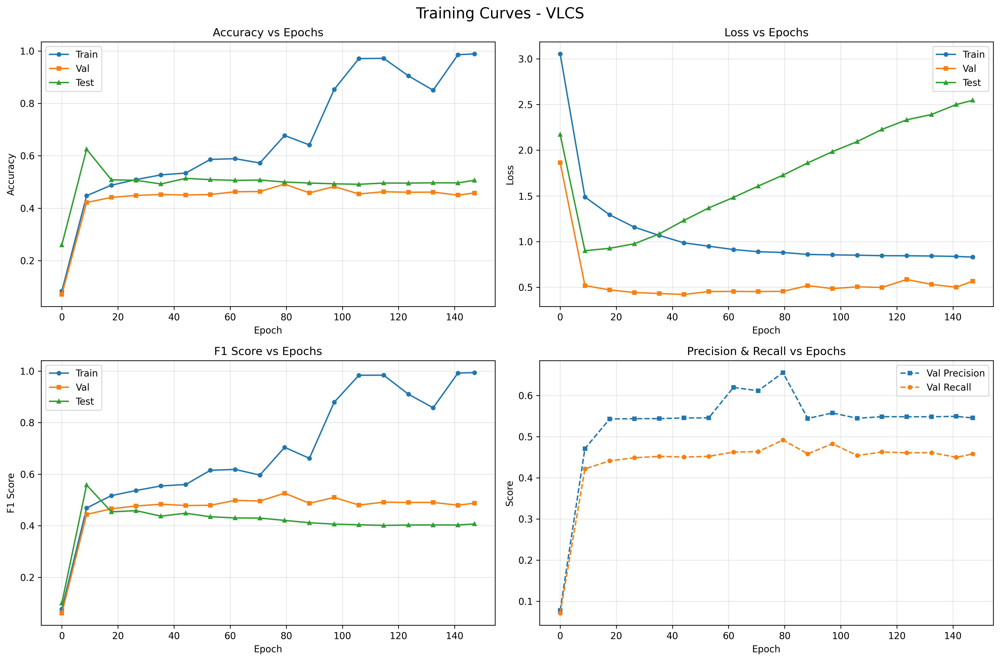

In [30]:


fit_simple(
exp_dir=str(exp_dir),
logger=logger,
seed=config.get("seed", 0),
trial_seed=config.get("trial_seed", 0),
hparams_seed=config.get("hparams_seed", 0),
algorithm_name=config["algo"],
dataset_name=dataset_name_vlcs,
data_dir=config["data_dir"][dataset_name_vlcs],
num_workers=config.get("num_workers", 4),
test_envs=[config["test_set_id"]],
overlap_type=config.get("overlap", "none"),
holdout_fraction=config.get("holdout_fraction", 0.2),
n_steps=config.get("n_epochs"),  # Changed to epochs!
checkpoint_freq=config.get("checkpoint_freq"),  # In epochs
model_checkpoint=config.get("model_checkpoint", {
    "metric": "val/acc",
    "maximize": True
}),
num_domain_linked_classes=config.get("num_domain_linked_classes"),
num_classes=config.get("num_classes"),
# AutoAugmentation specific
auto_augment=config.get("auto_augment", False),
augment_search_epochs=config.get("augment_search_epochs", 10),
)

logging.info(f"Experiment complete. Results saved to {exp_dir}")
print(f"\n✓ Experiment complete!")
print(f"  Results: {exp_dir / 'metrics_vlcs.csv'}")
print(f"  Best model: {exp_dir / 'best_model_vlcs.ckpt'}")
print(f"  Config: {exp_dir / 'config_vlcs.json'}")



import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import display, Image
import os

log_dir = f"/kaggle/working/experiments/{exp_name_vlcs}/logs"

# Get all confusion matrix plot files
cm_files = [f for f in os.listdir(log_dir) if f.startswith('confusion_matrix_') and f.endswith('.png')]

# Display all confusion matrices
print("CONFUSION MATRICES:")
print("="*60)
for cm_file in sorted(cm_files):
    print(f"\n{cm_file}")
    display(Image(filename=os.path.join(log_dir, cm_file)))

# Display training curves
print("\n\nTRAINING CURVES:")
print("="*60)
display(Image(filename=os.path.join(log_dir, 'training_curves_VLCS.png')))


## Wilds

In [ ]:
dataset_name = config["dataset"][3]
dataset_name